In [ ]:
### IMPUTATION WITH XGBOOST (mostly categorical)

In [1]:
## Horrified how bad classification is

## been doing selfRedistW1

## I think the problem is that the waves overlap eachother - so it fits on selfRedistW1 values
# and puts all the weight on selfRedistW2
# and then, when you try to generalise, it's got sod all coverage



# basic question - can you do better than simply amalgamating waves?

In [1]:
dataset_name = "W19_comb"
df_list = 'BES_Panel|BES_reduced'
#           ]#,"BESnumeric"]

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

Toggle code

In [2]:
(var_type, cat_dictionary, new_old_col_names, old_new_col_names) = get_small_files(data_subfolder, encoding)

var_type (8079, 14)


In [3]:
# get full set of inferred "cross wave" auth-lib/left-right values and ages
pan_dataset_allr_values = pd.read_csv(BES_small_data_files + "pan_dataset_allr_valuesW19"+".csv")
pan_dataset_ages = pd.read_csv( BES_small_data_files + "pan_dataset_ages"+".csv" )
pan_dataset_votes = pd.read_pickle(BES_small_data_files + "pan_dataset_votes"+".zip", compression='zip')
pan_dataset_allr_values = pan_dataset_allr_values.set_index("id")

In [15]:
def create_train(dataset,drop_other_waves,var_stub_list,mask,target_var):
    keep_list = dataset.columns
    
    if drop_other_waves:
        # drop variables from other waves
        other_waves = get_other_wave_pattern(wave_no, max_wave, num_to_wave)
        keep_list = [x for x in keep_list if not re.search( other_waves, x )]
     
    keep_list = list(keep_list)
    keep_list.remove(target_var)
    # drop key variables
    keep_list = [x for x in keep_list if not any([var_stub in x for var_stub in var_stub_list])] 
    
    
    
    return dataset[keep_list][mask]

#global var_list
def xgboost_run(title, dataset, var_list,var_stub_list=[], subdir=None, min_features=30, dependence_plots=False , output_folder=".."+os.sep+"Output"+os.sep,Treatment="default",
                use_specific_weights = None, automatic_weights_from_wave_no = False, alg = None,verbosity=1,skip_bar_plot=False,
                eval_metric = ['rmse'],minimum_sample=50,dont_stop_on_sample_size_err=False,print_shap_chart=True,plot_validation=False,
                threshold=.1,drop_other_waves=False):
    if alg is None:
        alg = get_xgboost_alg()
        alg.verbosity=verbosity
    if verbosity>=1:
        verbose=True
    else:
        verbose=False
    # global BES_Panel
    # for target_var,base_var in zip(var_list,base_list):
    treatment_subfolder = create_subdir(output_folder,Treatment)

    
    for target_var in var_list:
        if automatic_weights_from_wave_no:
            wave_no = get_wave_no( target_var )
            weight_var = num_to_weight[wave_no]    
            print( target_var, wave_no )

        target = create_target(dataset,target_var)
        mask   = target.notnull()
        if optional_mask & automatic_weights_from_wave_no:
            mask = mask&optional_mask_fn(wave_no)
        else:
            mask = mask&optional_mask_fn()
        target = target[mask]

        if sum(mask) < minimum_sample:
            print("Skipping - sample size beneath minimum: ",minimum_sample)
            skipping = True
            if not dont_stop_on_sample_size_err:
                raise Exception("fgflgf")
            continue
        skipping=False

        train = create_train(dataset,drop_other_waves,var_stub_list,mask,target_var)

        if subdir is None:
            output_subfolder = create_subdir(treatment_subfolder,target_var)
        else:
            output_subfolder = create_subdir(treatment_subfolder,subdir)

        if use_specific_weights is not None:
            sample_weights = use_specific_weights[mask].fillna(use_specific_weights[mask].median())




        elif automatic_weights_from_wave_no:
            sample_weights = weights[weight_var][mask]
            print("missing vals in sample weights: "+ str( sample_weights.isnull().sum() ) )
            sample_weights = sample_weights.fillna(sample_weights.median())
        
        else:
            sample_weights = None
    #         get_non_overfit_settings( train, target, alg, seed, early_stoppping_fraction, test_size, sample_weights )
    #         # fit to full dataset at non-overfitting level
    #         alg.fit(train, target, verbose = True, sample_weight = sample_weights)        
    #     else:

        if target.dtype.name == 'category':
            (ACC,  F1, alg_best_iteration) = get_non_overfit_settings( train, target, alg, seed, early_stoppping_fraction, test_size, eval_metric, verbose = verbose,
                                      sample_weights=sample_weights,plot_validation=plot_validation)
            pd.Series([ACC,  F1,  alg_best_iteration],index = ["ACC",  "F1", "alg_best_iteration"]).to_csv(output_subfolder+"scores.csv")
           
        
        else:

            (MSE, MAE, EV, R2, alg_best_iteration) = get_non_overfit_settings( train, target, alg, seed, early_stoppping_fraction, test_size, eval_metric, verbose = verbose,
                                      sample_weights=sample_weights,plot_validation=plot_validation)
            pd.Series([MSE, MAE, EV, R2, alg_best_iteration],index = ["MSE", "MAE", "EV", "R2", "alg_best_iteration"]).to_csv(output_subfolder+"scores.csv")
                                        
        # fit to full dataset at non-overfitting level
        alg.fit(train, target, verbose = verbose, sample_weight = sample_weights,eval_metric=eval_metric)


    #################

        explainer = shap.TreeExplainer(alg)
        shap_values = explainer.shap_values(train)
        
#         shap_values = shap.TreeExplainer(alg).shap_values(train);

        shap_problem = np.isnan(np.abs(shap_values).mean(0)).any()
        if shap_problem:
            print("hit problem!")
            shap_values = shap.TreeExplainer(alg).shap_values(train, approximate=True);

        pickle.dump( explainer, open( output_subfolder+"explainer.pkl", "wb" ) )
        pickle.dump( explainer, open( output_subfolder+"alg.pkl", "wb" ) )

        if target.dtype.name == 'category':
            subtitle = "ACC: %.2f, F1: %.2f" % (ACC, F1)
            metrics = (ACC, F1)
        else:
            subtitle = "MSE: %.2f, MAE: %.2f, EV: %.2f, R2: %.2f" % (MSE, MAE, EV, R2)
            metrics = (MSE, MAE, EV, R2)
            
        
            
        if target.dtype.name == 'category':
            multiclass = True
            class_names = list(target.cat.categories)
        else:
            multiclass = False
            class_names = None
#         raise Exception
        if print_shap_chart:
            shap_outputs(shap_values, train, target_var, output_subfolder, threshold = threshold,
                     min_features = min_features, title=title+"\n"+subtitle,
                     dependence_plots=dependence_plots,skip_bar_plot=False,multiclass=multiclass,class_names=class_names)        

    if skipping:
        return (None,None,None,None,None,None,None)
    else:
        return (explainer, shap_values, train.columns, train.index, alg,output_subfolder,metrics)


In [16]:
dk_dict = {"Don't know":np.nan}

def prep_dataset_only(dataset,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,min_features,dependence_plots=False,
       drop_vars = [],demo_var_only=True,
        multi_class_target=False,dummy_na=True,specific_vars = False, drop_after_dummying = []):


#     labels = BES_label_list[ge]
    df_simp = dataset.drop(drop_vars,axis=1)

    df_simp[target_var] = df_simp[target_var].replace(target_var_replace_dict)
    # prep nominal and ordinal as categorical to be dummied
    
    old_demo_vars = [x for x in df_simp.columns if x!=target_var]
    
    
    scale_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [1]]
    num_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [0]]
    old_demo_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [5]]
#     raise Exception
    if not multi_class_target:
        if var_type.loc[target_var,"type"]==0:
            df_simp[target_var] = df_simp[target_var].astype('float')
        else:
            df_simp[target_var] = df_simp[target_var].replace(dk_dict).cat.codes.replace(-1,np.nan).astype('float')  
        df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
        df_simp[scale_vars] = df_simp[scale_vars].replace(dk_dict).apply(lambda x: x.cat.codes).replace(-1,np.nan).astype('float')
        df_simp[num_vars] = df_simp[num_vars].astype('float')  
        df_simp = pd.get_dummies(df_simp,prefix_sep='|',dummy_na=dummy_na).drop(target_var_drop_list,axis=1)
        if target_var+"|nan" in df_simp.columns:
            df_simp.loc[df_simp[target_var+"|nan"]==1,var_stub]=np.nan
            df_simp.drop(target_var+"|nan",axis=1,inplace=True,)
    else:
        old_demo_vars = [x for x in old_demo_vars if x !=target_var]
        scale_vars = [x for x in scale_vars if x !=target_var]   
        df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
        df_simp[scale_vars] = df_simp[scale_vars].replace(dk_dict).apply(lambda x: x.cat.codes).replace(-1,np.nan).astype('float')
        df_simp[num_vars] = df_simp[num_vars].astype('float')   
        df_simp[target_var] = df_simp[target_var].astype('category')
        target_var_drop_list = [x for x in target_var_drop_list if x in df_simp[target_var].cat.categories]
        df_simp[target_var] = df_simp[target_var].cat.remove_categories(target_var_drop_list)        
        all_but_target = [x for x in df_simp.columns if x !=target_var]
        target_temp = df_simp[target_var].copy()
        df_simp = pd.get_dummies(df_simp[all_but_target],prefix_sep='|',dummy_na=dummy_na)
        df_simp[target_temp.name] = target_temp
        

    
#     df_simp = df_simp.rename(columns = replace_var_names( BES_label_list[ge] , df_simp ))  
    
    df_simp = df_simp.drop(drop_after_dummying , axis=1)

    Treatment = var_stub

    var_list = [var_stub]
    var_stub_list = []
    if not multi_class_target:
        df_simp = df_simp.select_dtypes('number')
        df_simp = df_simp.astype('float')
#     mask = df_simp[var_stub].notnull() & df_simp["wt"].notnull()
    return df_simp


# def prep_dataset(dataset,target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
#        var_stub,min_features,dependence_plots=False,
#        drop_vars = [],demo_var_only=True,alg=alg,
#         multi_class_target=False,dummy_na=True,specific_vars = False, drop_after_dummying = []):


# #     labels = BES_label_list[ge]
#     df_simp = dataset.drop(drop_vars,axis=1)

#     df_simp[target_var] = df_simp[target_var].replace(target_var_replace_dict)
#     # prep nominal and ordinal as categorical to be dummied
    
#     old_demo_vars = [x for x in df_simp.columns if x!=target_var]
    
    
#     scale_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [1]]
#     num_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [0]]
#     old_demo_vars = [x for x in old_demo_vars if var_type.loc[x,"type"] in [5]]
        
        
        
#     if not multi_class_target:
#         df_simp[target_var] = df_simp[target_var].replace(dk_dict).cat.codes.replace(-1,np.nan).astype('float')  
#         df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
#         df_simp[scale_vars] = df_simp[scale_vars].replace(dk_dict).apply(lambda x: x.cat.codes).replace(-1,np.nan).astype('float')
#         df_simp[num_vars] = df_simp[num_vars].astype('float')  
#         df_simp = pd.get_dummies(df_simp,prefix_sep='|',dummy_na=dummy_na).drop(target_var_drop_list,axis=1)
#         if target_var+"|nan" in df_simp.columns:
#             df_simp.loc[df_simp[target_var+"|nan"]==1,var_stub]=np.nan
#             df_simp.drop(target_var+"|nan",axis=1,inplace=True,)
#     else:
#         old_demo_vars = [x for x in old_demo_vars if x !=target_var]
#         scale_vars = [x for x in scale_vars if x !=target_var]   
#         df_simp[old_demo_vars] = df_simp[old_demo_vars].astype('category')    
#         df_simp[scale_vars] = df_simp[scale_vars].replace(dk_dict).apply(lambda x: x.cat.codes).replace(-1,np.nan).astype('float')
#         df_simp[num_vars] = df_simp[num_vars].astype('float')   
#         df_simp[target_var] = df_simp[target_var].astype('category')
#         target_var_drop_list = [x for x in target_var_drop_list if x in df_simp[target_var].cat.categories]
#         df_simp[target_var] = df_simp[target_var].cat.remove_categories(target_var_drop_list)        
#         all_but_target = [x for x in df_simp.columns if x !=target_var]
#         target_temp = df_simp[target_var].copy()
#         df_simp = pd.get_dummies(df_simp[all_but_target],prefix_sep='|',dummy_na=dummy_na)
#         df_simp[target_temp.name] = target_temp
        

# #     df_simp = df_simp.rename(columns = replace_var_names( BES_label_list[ge] , df_simp ))  
    
#     df_simp = df_simp.drop(drop_after_dummying , axis=1)

#     Treatment = var_stub

#     var_list = [var_stub]
#     var_stub_list = [var_stub,]
#     if not multi_class_target:
#         df_simp = df_simp.select_dtypes('number')
#         df_simp = df_simp.astype('float')

#     colname = var_stub
#     if target_var_title_pair is not None:
#         title = "\n\nMore Likely to "+target_var_title_pair[0]+" <---   ---> More Likely to"+target_var_title_pair[1]
#     else:
#         title = ""
        
# #     if wt_col =="wt":
# #         wt_cols = ["wt"]
# #         wt_ser = df_simp["wt"]
# #     else:
# #         wt_cols = ["wt",wt_col]
# #         wt_ser = df_simp[wt_col]        
#     mask = df_simp[var_stub].notnull()# & df_simp[wt_col].notnull()
    
#     (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)=\
#         xgboost_run(subdir=colname,dataset=df_simp[mask],
# #                     .drop(wt_cols,axis=1),
#                 var_list=var_list,var_stub_list=var_stub_list,
#                 use_specific_weights=None,
#                 min_features = min(df_simp.shape[1]-1,min_features),verbosity=0,
#                 skip_bar_plot=True,dependence_plots=dependence_plots,alg=alg,eval_metric=eval_metric,                    
#                 title = title)
    
#     return (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)        


# df_pred = prep_dataset_only(df_simp,
#                             target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
#        var_stub,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,specific_vars=False,
#                             multi_class_target=multi_class_target,)
# df_pred

In [13]:
# df_pred[df_pred[target_var].isnull()].var().sort_values().tail(50)
# pan_dataset_ages.isnull().sum()

In [5]:
X_varset = BES_Panel[match(BES_Panel,"al\dW|lr\dW|redistSelf|locus\d|tolUncertain|riskScale|riskTaking|ethno|aom|competitiveness|benevolentSexism|hostileSexism|community|incremental|discrim|sdo|groupempathy|empathy|childvalues|zerosum|auth|socialDes|traditionalism|respectAuth").index]
# X_varset = X_varset[search(BES_Panel,"redistSelf").index]
metric_dict = {}
fuller_columns = X_varset.columns

# pan_value_cols = pan_dataset_allr_values.columns[-2:]
# X_varset[["Economic Left-Right","Social Liberal-Conservative"]] = pan_dataset_allr_values[pan_value_cols]
# pan_age_cols = "A?ge_at_W10"
# X_varset[pan_age_cols] = pan_dataset_ages[pan_age_cols]

df_simp = X_varset.replace("Don't know",np.nan)
df_simp_imp = df_simp.copy()


In [315]:
# var_type.loc[pan_age_cols,"type"] = 0
# var_type.loc["Economic Left-Right","type"] = 0
# var_type.loc["Social Liberal-Conservative","type"] = 0

In [7]:
# %%time
def test_xgboost_multi(xgb_params=get_xgboost_alg().get_params(),eval_metric = 'mlogloss',target_var = fuller_columns[0],
                      coverage_thresh=.25,drop_std_thresh = .35):
    

    mask = df_simp[target_var].notnull()

    # target_var = fuller_columns[0]
    target_var_replace_dict = {}
    target_var_drop_list = []
    target_var_title_pair = None

    var_stub = target_var
    min_features = 30
    #     drop_std_thresh = .1
    drop_vars = []
    specific_vars = []
    inv_wt_classes = True
    dependence_plots = False
    
#     coverage_thresh = .25


    # ### def on variable type
    # if df_simp[target_var].dtype.name=="category":
    #     alg = get_xgboost_alg(classification_problem=True)
    #     multi_class_target = True
    # else:
    #     alg = get_xgboost_alg(classification_problem=False)
    #     multi_class_target = False

#     multi_class_target = True
#     eval_metric = 'mlogloss'
#     alg = get_xgboost_alg(**xgb_params,classification_problem=multi_class_target)
    inv_wt_classes = True
    
    if (df_simp[target_var].dtype.name=="category") and (len(df_simp[target_var].cat.categories)>2):
        multi_class_target = True
        eval_metric = 'mlogloss'
        objective = 'multi:softmax'
#         inv_wt_classes = True
        alg = get_xgboost_alg(**xgb_params,objective=objective,classification_problem=multi_class_target)            
        
    elif (df_simp[target_var].dtype.name=="category") and (len(df_simp[target_var].cat.categories)==2):
        
        multi_class_target = False
        
        objective = "binary:logistic"
#         eval_metric = 'mlogloss'
        eval_metric = 'logloss'
        alg = get_xgboost_alg(**xgb_params,objective=objective,classification_problem=multi_class_target)        
        
# objective = "binary:logistic"        
    elif (df_simp[target_var].dtype.name=="category") and (len(df_simp[target_var].cat.categories)==1):
        print("Categorical variable with only one category!")
        return None,None,None,None,None,None

    else:
        objective = 'reg:squarederror'
#         alg = get_xgboost_alg(classification_problem=False)
        multi_class_target = False
        eval_metric = 'rmse'
        alg = get_xgboost_alg(**xgb_params,objective=objective,classification_problem=multi_class_target)    
    


    # find variables with no coverage/variation in focal instances (mask)
    df_pred = prep_dataset_only(df_simp,
                                target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
           var_stub,min_features,dependence_plots=dependence_plots,drop_vars=drop_vars,demo_var_only=False,specific_vars=False,
                                multi_class_target=multi_class_target,)

    # only wave variants of variable
    # df_pred = df_pred[search(df_pred,"redistSelf").index]
    # drop all nan columns
    df_pred = df_pred.drop(search(df_pred,"\|nan").index,axis=1)

    null_mask = df_pred[target_var].isnull()
    stds = df_pred[null_mask].std()
    df_pred[mask].std()[df_pred[null_mask].std()<1].hist(bins=100)
    low_var_list = list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)    
    low_var_list = [x for x in low_var_list if x!=target_var]
    df_pred = df_pred.drop(low_var_list,axis=1)
    
    isnull_coverage = df_pred[df_pred[target_var].isnull()].notnull().mean()
    low_coverage_list = list(isnull_coverage[isnull_coverage<coverage_thresh].index)
    low_coverage_list.remove(target_var)
    df_pred = df_pred.drop(low_coverage_list,axis=1)    

    # df_pred["test_var"] = df_pred[target_var]+.2

    # if multi_class_target:
    #     corrs = df_pred.corrwith(df_pred[target_var].cat.codes.replace(-1,np.nan))
    # else:
    #     corrs = df_pred.corrwith(df_pred[target_var])
    # print("reduction:",df_pred.shape, len(corrs[corrs.abs()>.1].index))
    # df_pred = df_pred[list(set(list(corrs[corrs.abs()>.1].index)+[target_var]))]


    colname = var_stub
    if target_var_title_pair is not None:
        title = "\n\nMore Likely to "+target_var_title_pair[0]+" <---   ---> More Likely to"+target_var_title_pair[1]
    else:
        title = ""
    var_list = [var_stub]
    var_stub_list = []   

    # eval_metric = 'merror'
#     alg = get_xgboost_alg(classification_problem=multi_class_target)
    # alg = get_xgboost_alg(classification_problem=multi_class_target,
    #                      colsample_bylevel=1.0,colsample_bynode=1.0, colsample_bytree=1.0,subsample=1.0,
    #                      objective='multi:softmax',learning_rate=.01)
    # alg = XGBRegressor(n_estimators=1000)

    if inv_wt_classes:
        freq = df_pred.loc[mask,target_var].value_counts(normalize=True)
        wts = df_pred.loc[mask,target_var].apply(lambda x: 1/freq[x]).astype(float)
    else:
        wts = df_pred.loc[mask,target_var].notnull().astype(float)
    # wts=None
    (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)=\
        xgboost_run(subdir=colname,dataset=df_pred[mask],
                var_list=var_list,var_stub_list=var_stub_list,
                use_specific_weights=wts,
                min_features = min(df_pred.shape[1]-1,min_features),verbosity=0,
                skip_bar_plot=True,dependence_plots=dependence_plots,alg=alg,eval_metric=eval_metric,                    
                title = title,print_shap_chart=True,threshold=0)
    print("********")

    if multi_class_target:
        predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).astype('category').cat.set_categories(df_pred[target_var].cat.categories,ordered=True)
    elif objective=="binary:logistic":
        predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).round().astype('category').cat.rename_categories(df_simp[target_var].cat.categories).cat.set_categories(df_simp[target_var].cat.categories,ordered=True)
    else:    
        predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).round()
    #
    pred_dist = predictions[df_simp[target_var].isnull()].value_counts(normalize=True).sort_index()
    gt_dist = df_pred[target_var].value_counts(normalize=True).sort_index()

    err_dist = (pred_dist - gt_dist).apply(lambda x: x**2).sum()/gt_dist.shape[0]    
    #     MSE = mean_squared_error(y_test, predictions)
    #     MAE = mean_absolute_error(y_test, predictions)
    #     EV = explained_variance_score(y_test, predictions)
    #     R2 = r2_score(y_test, predictions)

    #     print("MSE: %.2f, MAE: %.2f, EV: %.2f, R2: %.2f" % (MSE, MAE, EV, R2) )        
    # print(params)
    display(pred_dist)
    #     display(gt_dist)
    print("err_dist:",err_dist)
    # return -metrics[0]+(err_dist*10)
    return df_pred,predictions,alg,target_var,metrics,err_dist

# df_simp,predictions,alg,target_var = test_xgboost_multi(eval_metric = "mlogloss")
# print(balanced_accuracy_score( predictions[df_simp[target_var].notnull()],df_simp[target_var][df_simp[target_var].notnull()]) )
# print("---mlogloss---")
# df_simp,predictions,alg,target_var = test_xgboost_multi(eval_metric = "merror")
# print(balanced_accuracy_score( predictions[df_simp[target_var].notnull()],df_simp[target_var][df_simp[target_var].notnull()]) )
# print("---merror---")
# df_simp,predictions,alg,target_var = test_xgboost_multi(eval_metric = "map")
# print(balanced_accuracy_score( predictions[df_simp[target_var].notnull()],df_simp[target_var][df_simp[target_var].notnull()]) )
# print("---map---")
# df_simp,predictions,alg,target_var = test_xgboost_multi(eval_metric = "aucpr")
# print(balanced_accuracy_score( predictions[df_simp[target_var].notnull()],df_simp[target_var][df_simp[target_var].notnull()]) )
# print("---aucpr---")
# df_simp,predictions,alg,target_var = test_xgboost_multi(eval_metric = "auc")
# print(balanced_accuracy_score( predictions[df_simp[target_var].notnull()],df_simp[target_var][df_simp[target_var].notnull()]) )
# print("---auc---")


In [8]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report, confusion_matrix
import time

results_df = pd.DataFrame(columns = ["Description","target_var","df_pred","predictions","alg",
                                     "balanced_acc","metrics","err_dist","duration"])
xgb_params = {'colsample_bylevel': 0.8720590254026701, 'colsample_bynode': 0.5843005380100216, 'colsample_bytree': 0.9897193555216962,
'gamma': 5.976908406135755,  'learning_rate': 0.06326866467481698, 'max_depth': 7.0,
'min_child_weight': 3.0, 'n_estimators': 500, 'reg_alpha': 1.0, 'reg_lambda': 0.0050929175003816,
'subsample': 0.6064304958499334}

In [9]:

# xgb_params.update({'max_depth':7,'min_child_weight':3})

# import time



# tic = time.perf_counter()

# count = max(len(results_df.index),results_df.index.max())
# descr = "base"

# df_pred,predictions,alg,target_var,metrics,err_dist = test_xgboost_multi(xgb_params,eval_metric = "mlogloss")
# balanced_acc = balanced_accuracy_score( predictions[df_simp[target_var].notnull()],
#                               df_simp[target_var][df_simp[target_var].notnull()])
# print( balanced_acc )
# print("---mlogloss---")
# toc = time.perf_counter()
# print(f"Ran in {toc - tic:0.4f} seconds")
# results_df.loc[count] = [descr,target_var,df_pred,predictions,alg,balanced_acc,metrics,err_dist,toc - tic]


In [ ]:
#     xgb_params.update({'max_depth':7,'subsample':.6,'min_child_weight':3,'gamma':6,'reg_alpha':4,
#                       'reg_lambda':1.5,'learning_rate':0.065,'colsample_bytree':.97,
#                       'colsample_bylevel':.99,'colsample_bynode':.92})

In [12]:
# {'colsample_bylevel': 0.9993530672426759, 'colsample_bynode': 0.923842763238649, 'colsample_bytree': 0.9692759731399389,
#  'gamma': 0.4485300495916873, 'inv_wt_classes': True, 'learning_rate': 0.09752248436332413, 'max_depth': 7.0,
#  'min_child_weight': 5.0, 'n_estimators': 500, 'reg_alpha': 1.0, 'reg_lambda': 0.3974541426809541,
#  'subsample': 0.6910642731185885}
#   9%|████                                        | 37/400 [59:36<9:11:52, 91.22s/trial, best loss: -0.1981959721185237]

# fuller_columns[0:1]


In [ ]:
# XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=0.99,
#               colsample_bynode=0.92, colsample_bytree=0.97, gamma=0.5,
#               gpu_id=-1, importance_type='gain', interaction_constraints='',
#               learning_rate=0.095, max_delta_step=0, max_depth=7,
#               min_child_weight=5, missing=nan, monotone_constraints='()',
#               n_estimators=68, n_jobs=8, nthread=8, num_parallel_tree=1,
#               objective='multi:softprob', random_state=729, refresh_leaf=0,
#               reg_alpha=1, reg_lambda=0.4, scale_pos_weight=None,
#               sketch_eps=0.03, subsample=0.7, tree_method='exact',
#               validate_parameters=1, verbosity=None)

In [334]:
# # 'colsample_bylevel': 0.8720590254026701, 'colsample_bynode': 0.5843005380100216, 'colsample_bytree': 0.989

# XGBClassifier(base_score=0.5, booster='gbtree',
#               colsample_bylevel=0.8720590254026701,
#               colsample_bynode=0.5843005380100216,
#               colsample_bytree=0.9897193555216962, gamma=5.976908406135755,
#               gpu_id=-1, importance_type='gain', interaction_constraints='',
#               learning_rate=0.06326866467481698, max_delta_step=0, max_depth=7,
#               min_child_weight=3, missing=nan, monotone_constraints='()',
#               n_estimators=112, n_jobs=8, nthread=8, num_parallel_tree=1,
#               objective='multi:softprob', random_state=729, refresh_leaf=0,
#               reg_alpha=1.0, reg_lambda=0.0050929175003816,
#               scale_pos_weight=None, sketch_eps=0.0,
#               subsample=0.6064304958499334, tree_method='exact',
#               validate_parameters=1, verbosity=None)

In [11]:
df_simp_imp =pd.read_pickle(BES_small_data_files + "imputed_data2"+".zip", compression='zip')
results_df=pd.read_pickle(BES_small_data_files + "imputed_data2_df"+".zip", compression='zip')

In [12]:
df_simp_imp

,redistSelfW1,redistSelfW2,redistSelfW3,redistSelfW4,redistSelfW6,lr1W6,lr2W6,lr3W6,lr4W6,lr5W6,...,lr2W10_W12,lr3W10_W12,lr4W10_W12,lr5W10_W12,al1W10_W12,al2W10_W12,al3W10_W12,al4W10_W12,al5W10_W12,zeroSumIRTW14
id,,,,,,,,,,,,,,,,,,,,,
1,Government should try to make incomes equal,Government should try to make incomes equal,Government should try to make incomes equal,Government should try to make incomes equal,Government should try to make incomes equal,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,...,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly agree,Strongly disagree,Strongly agree,NaN
2,8,8,9,8,7,Disagree,Disagree,Neither agree nor disagree,Disagree,Disagree,...,NaN,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Neither agree nor disagree,Strongly disagree,Agree,Disagree,Agree,NaN
3,5,6,4,3,6,Neither agree nor disagree,Agree,Strongly agree,Strongly agree,Agree,...,Agree,Agree,Strongly agree,Agree,Agree,Agree,Strongly agree,Neither agree nor disagree,Agree,NaN
4,5,5,5,Government should try to make incomes equal,Government should be less concerned about equa...,Agree,Strongly disagree,Agree,Strongly disagree,Strongly disagree,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,8,8,7,Government should try to make incomes equal,9,Agree,Strongly disagree,Agree,Strongly disagree,Strongly disagree,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98447,4,Government should try to make incomes equal,6,6,3,Agree,Neither agree nor disagree,Disagree,Neither agree nor disagree,Disagree,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98448,9,Government should try to make incomes equal,6,7,7,Disagree,Disagree,Disagree,Disagree,Disagree,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98449,7,Government should try to make incomes equal,6,6,4,Agree,Neither agree nor disagree,Agree,Agree,Agree,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


*******************  sdoantiegal4W15  *********************
ACC: 0.41,  F1: 0.41


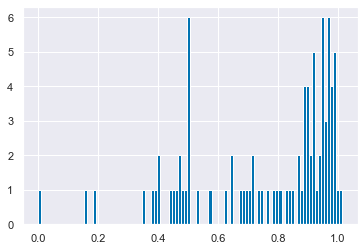

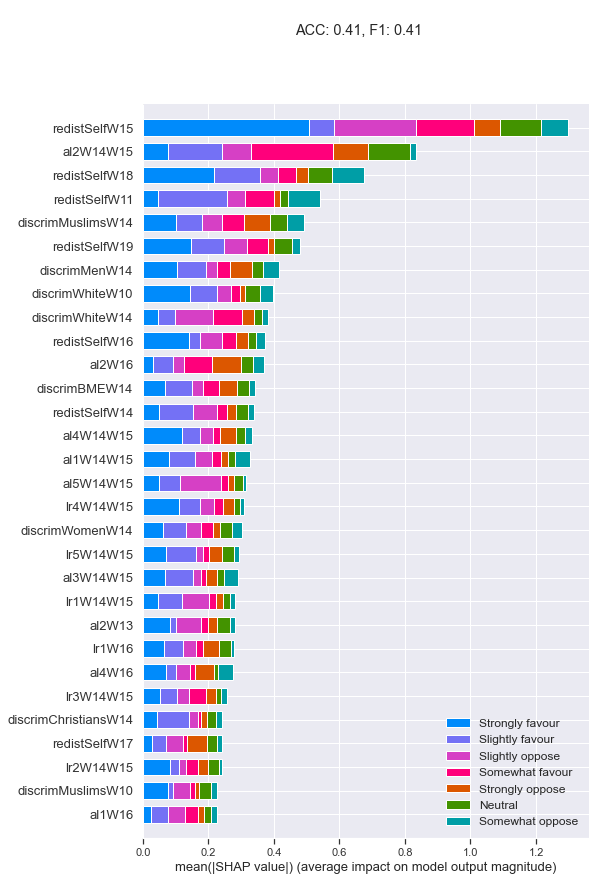

********


Strongly oppose    0.071003
Somewhat oppose    0.006383
Slightly oppose    0.005356
Neutral            0.236597
Slightly favour    0.142647
Somewhat favour    0.182467
Strongly favour    0.355547
dtype: float64

err_dist: 0.0026198717700278112
0.8780969832765374
---mlogloss---
Ran in 30.8074 seconds
*******************  redistSelfW16  *********************
ACC: 0.32,  F1: 0.32


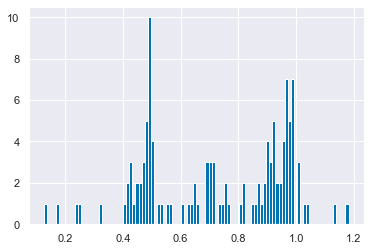

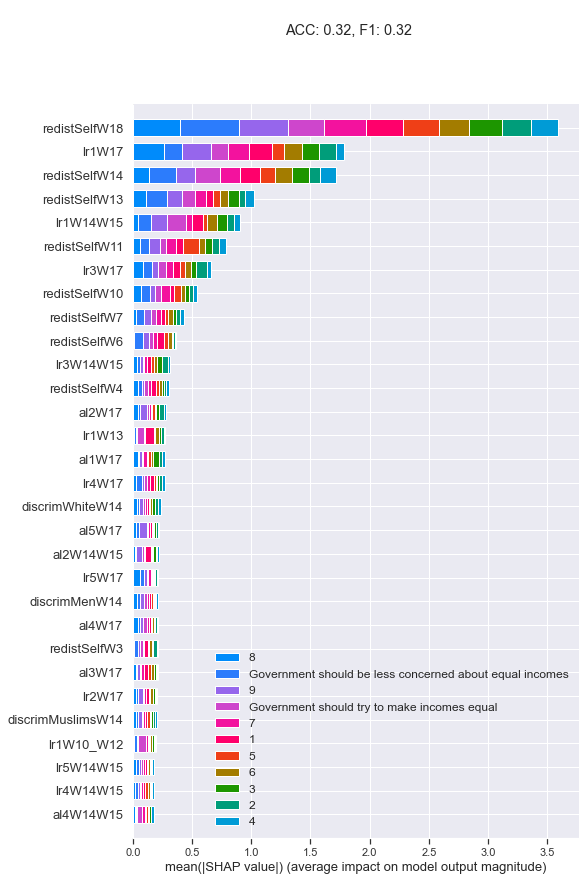

********


Government should try to make incomes equal                0.301097
1                                                          0.067671
2                                                          0.091586
3                                                          0.102318
4                                                          0.064468
5                                                          0.115034
6                                                          0.049816
7                                                          0.059813
8                                                          0.049097
9                                                          0.023275
Government should be less concerned about equal incomes    0.075825
dtype: float64

err_dist: 0.001997378716776121
0.6198439399953619
---mlogloss---
Ran in 265.0505 seconds
*******************  lr1W16  *********************
ACC: 0.50,  F1: 0.50


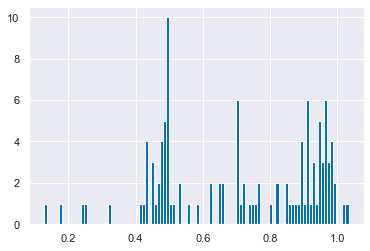

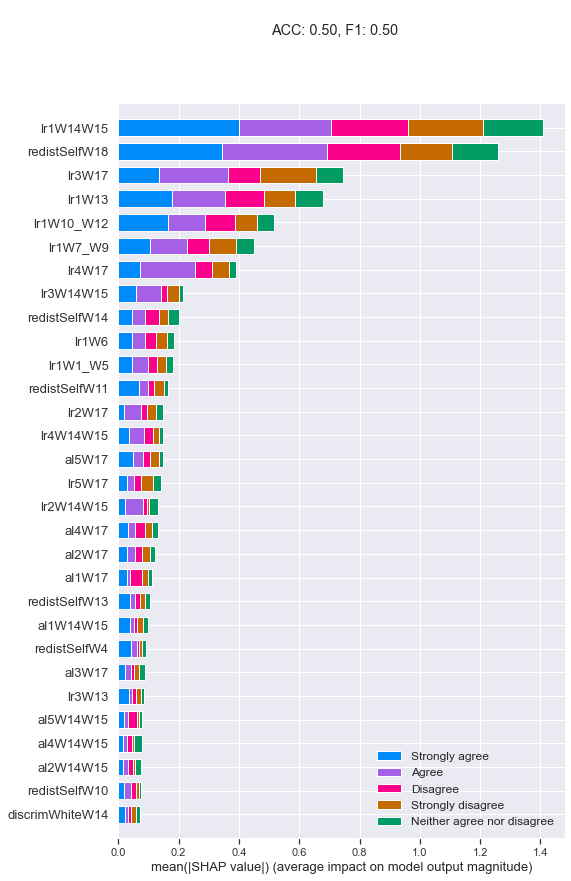

********


Strongly disagree             0.090772
Disagree                      0.146642
Neither agree nor disagree    0.224467
Agree                         0.298501
Strongly agree                0.239618
dtype: float64

err_dist: 0.0025387905279765964
0.6508331201245602
---mlogloss---
Ran in 169.6782 seconds
*******************  lr2W16  *********************
ACC: 0.48,  F1: 0.48


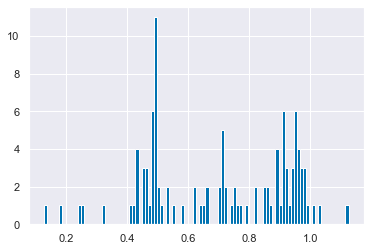

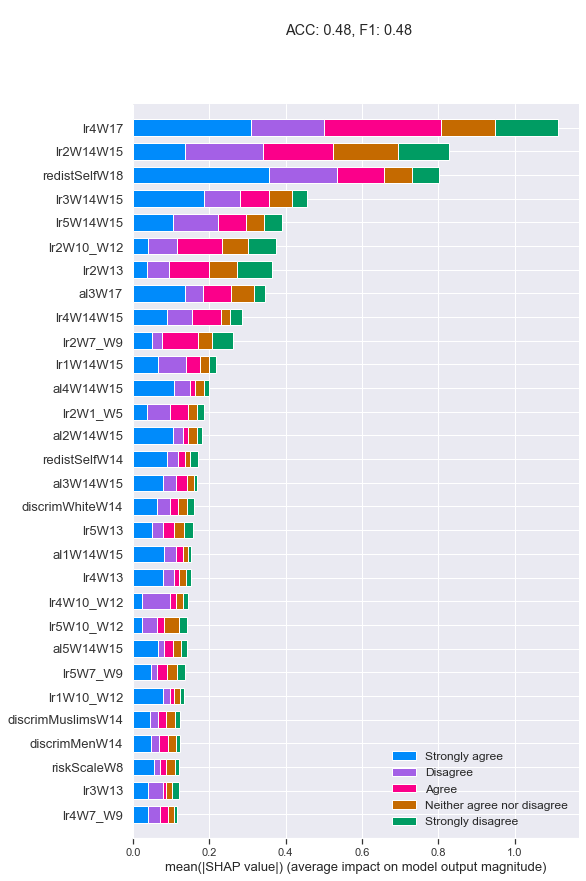

********


Strongly disagree             0.047894
Disagree                      0.077079
Neither agree nor disagree    0.211448
Agree                         0.354738
Strongly agree                0.308841
dtype: float64

err_dist: 0.0039120469780624546
0.5674064968068666
---mlogloss---
Ran in 225.6644 seconds
*******************  lr3W16  *********************
ACC: 0.48,  F1: 0.48


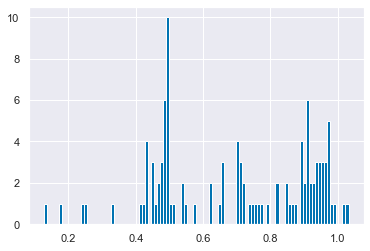

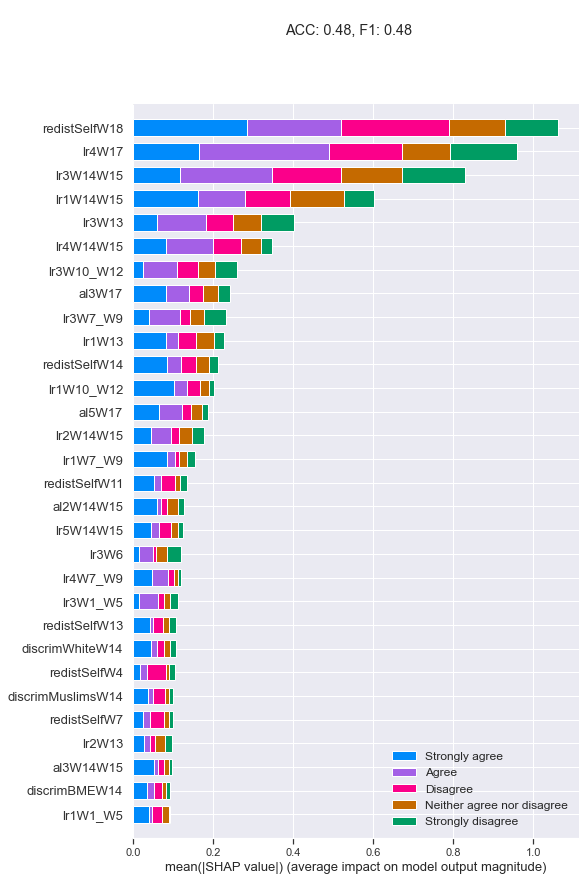

********


Strongly disagree             0.046580
Disagree                      0.107003
Neither agree nor disagree    0.184457
Agree                         0.375778
Strongly agree                0.286181
dtype: float64

err_dist: 0.0017621181842469055
0.5751378534815237
---mlogloss---
Ran in 171.5079 seconds
*******************  lr4W16  *********************
ACC: 0.44,  F1: 0.44


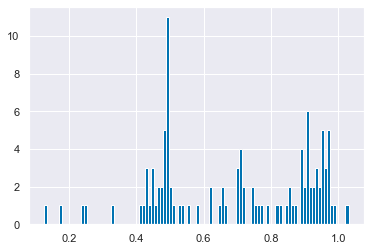

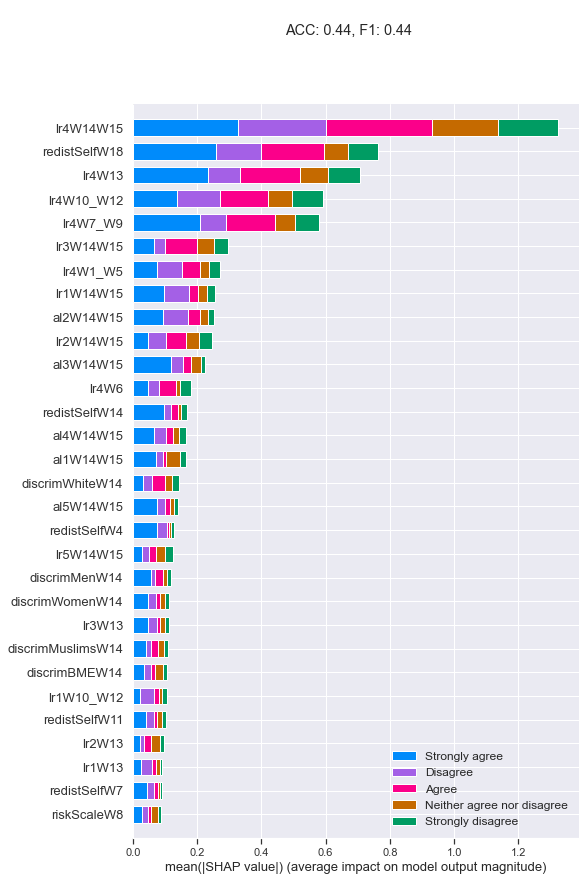

********


Strongly disagree             0.079117
Disagree                      0.122404
Neither agree nor disagree    0.159271
Agree                         0.331792
Strongly agree                0.307416
dtype: float64

err_dist: 0.0023354880806473475
0.5777531758587581
---mlogloss---
Ran in 205.2669 seconds
*******************  lr5W16  *********************
ACC: 0.44,  F1: 0.44


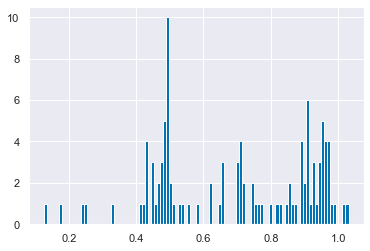

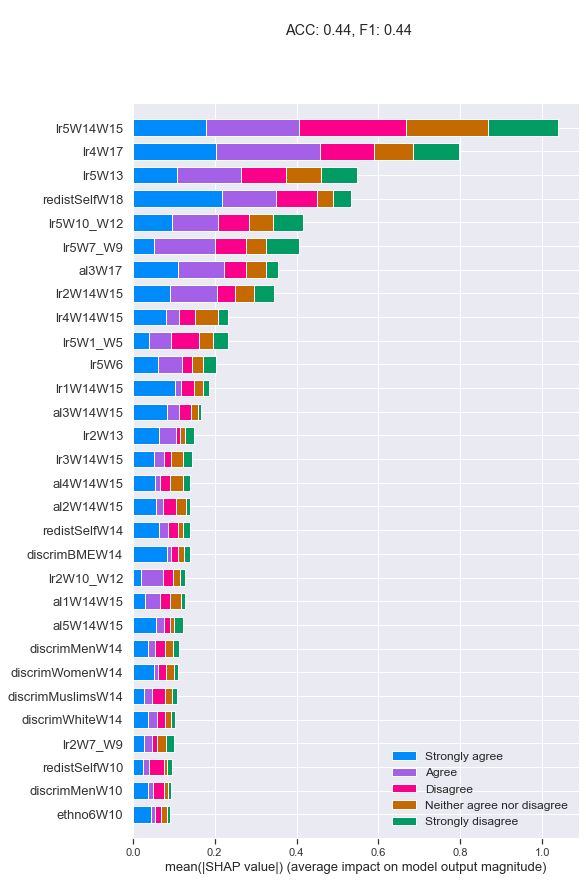

********


Strongly disagree             0.033389
Disagree                      0.169201
Neither agree nor disagree    0.224795
Agree                         0.311047
Strongly agree                0.261568
dtype: float64

err_dist: 0.004751063565783892
0.5616554742694762
---mlogloss---
Ran in 222.1807 seconds
*******************  al1W16  *********************
ACC: 0.48,  F1: 0.48


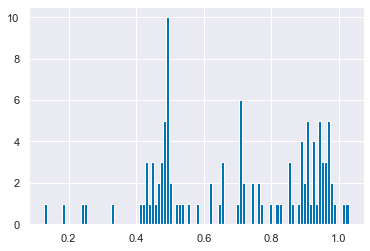

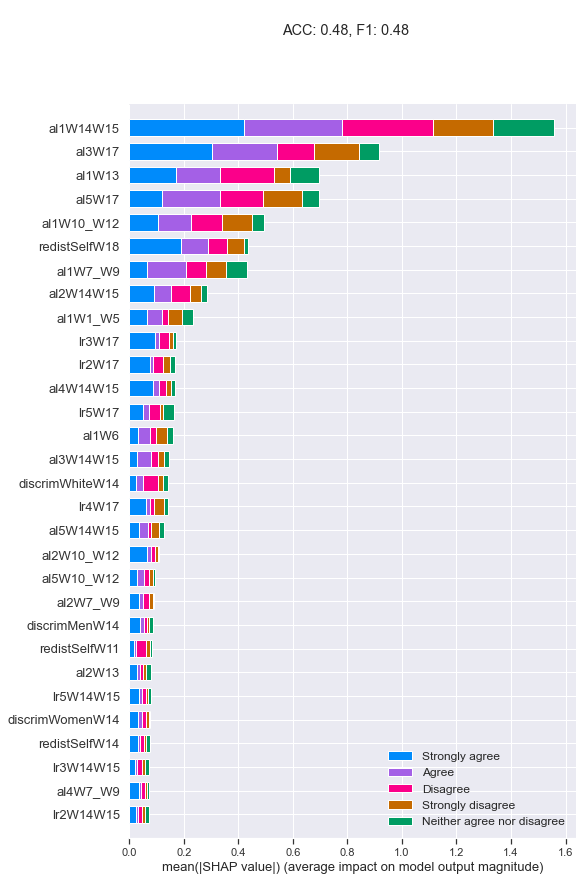

********


Strongly disagree             0.126482
Disagree                      0.158835
Neither agree nor disagree    0.188632
Agree                         0.296014
Strongly agree                0.230038
dtype: float64

err_dist: 0.0031490531239698138
0.607343079524548
---mlogloss---
Ran in 153.1291 seconds
*******************  al2W16  *********************
ACC: 0.53,  F1: 0.53


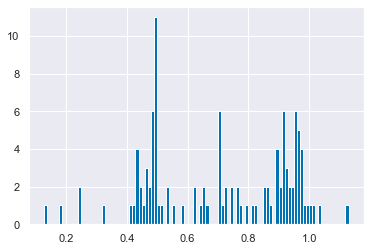

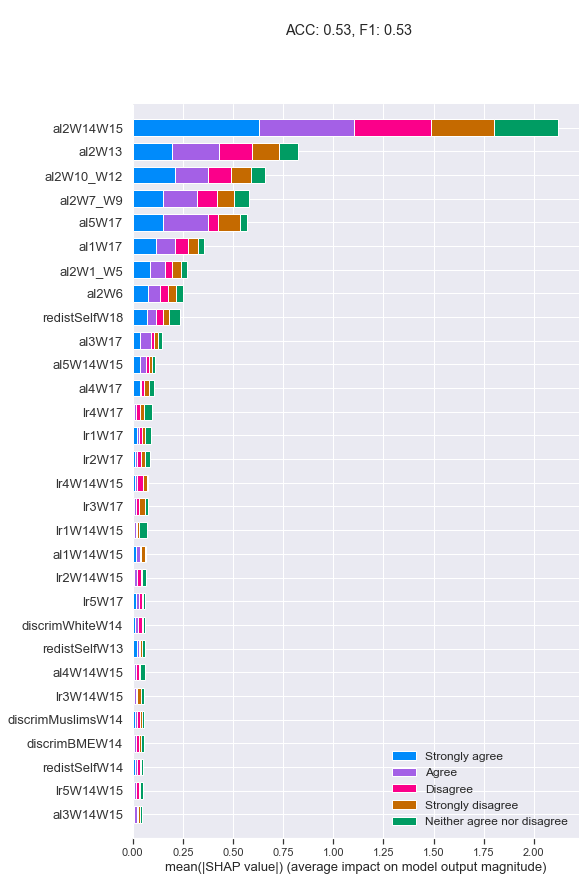

********


Strongly disagree             0.263324
Disagree                      0.185087
Neither agree nor disagree    0.145643
Agree                         0.215355
Strongly agree                0.190591
dtype: float64

err_dist: 0.0010335897481307497
0.6492184704268673
---mlogloss---
Ran in 115.0405 seconds
*******************  al3W16  *********************
ACC: 0.45,  F1: 0.45


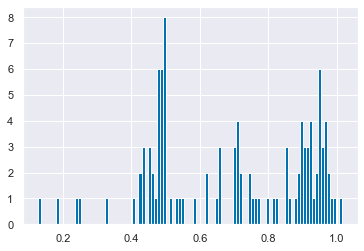

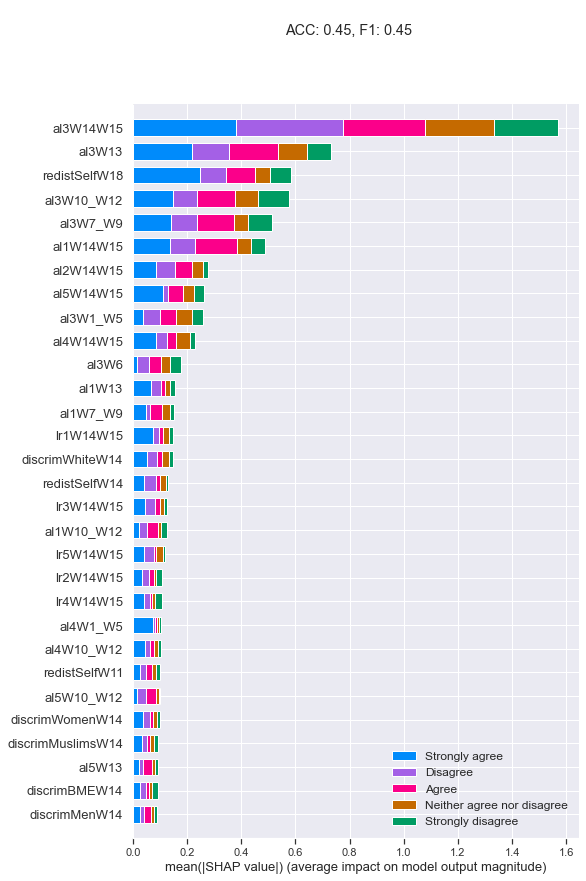

********


Strongly disagree             0.067630
Disagree                      0.196421
Neither agree nor disagree    0.192618
Agree                         0.331632
Strongly agree                0.211699
dtype: float64

err_dist: 0.0042288051855410205
0.5943750319998012
---mlogloss---
Ran in 197.4019 seconds
*******************  al4W16  *********************
ACC: 0.43,  F1: 0.43


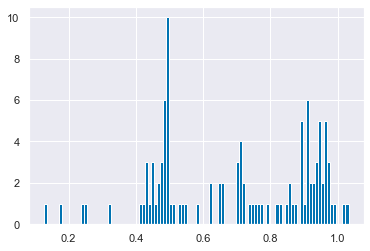

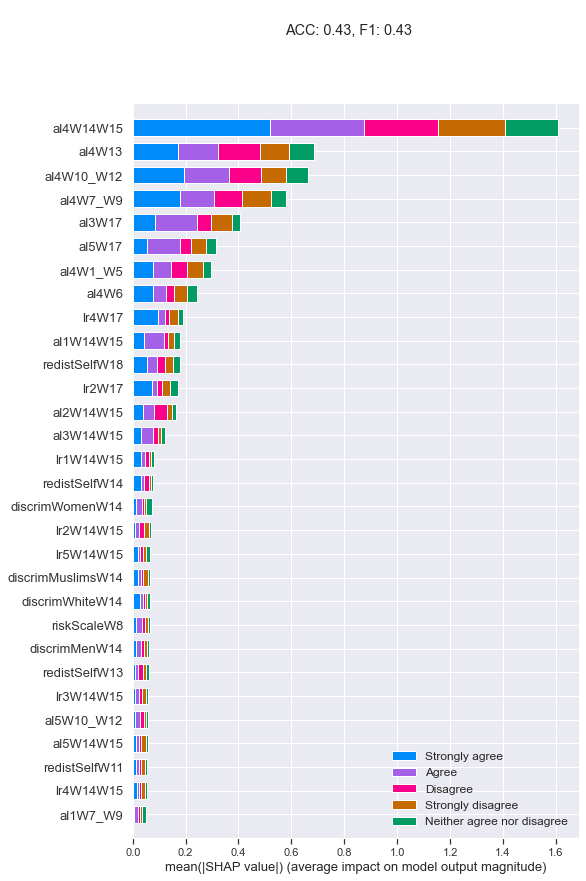

********


Strongly disagree             0.190730
Disagree                      0.221005
Neither agree nor disagree    0.181258
Agree                         0.282582
Strongly agree                0.124425
dtype: float64

err_dist: 0.00302885014847376
0.5831589141933335
---mlogloss---
Ran in 152.3444 seconds
*******************  al5W16  *********************
ACC: 0.49,  F1: 0.49


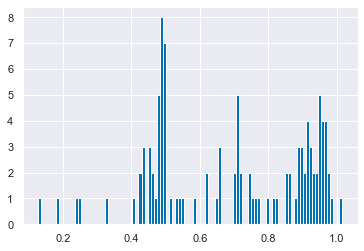

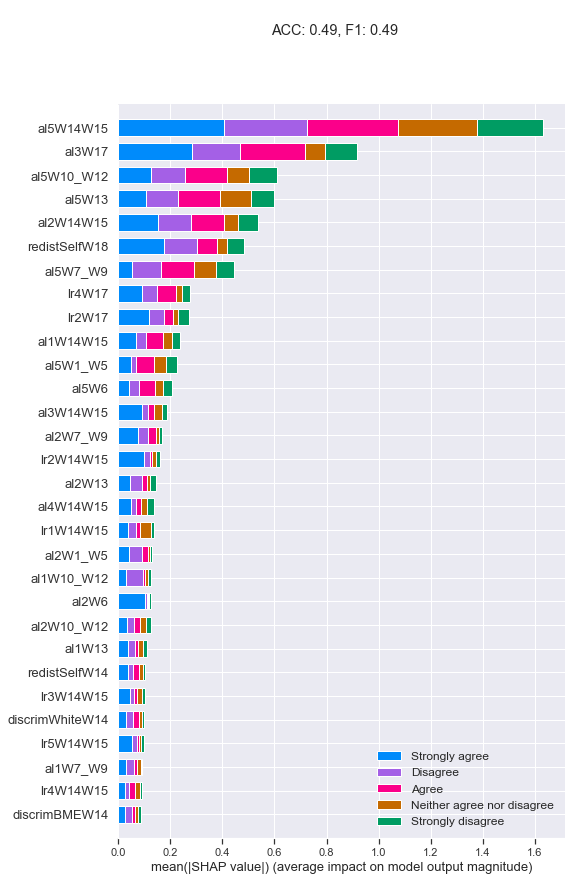

********


Strongly disagree             0.078170
Disagree                      0.108555
Neither agree nor disagree    0.248786
Agree                         0.320218
Strongly agree                0.244272
dtype: float64

err_dist: 0.002301435908289485
0.5863894599320908
---mlogloss---
Ran in 185.4567 seconds
*******************  redistSelfW17  *********************
ACC: 0.30,  F1: 0.30


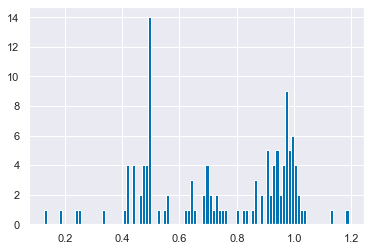

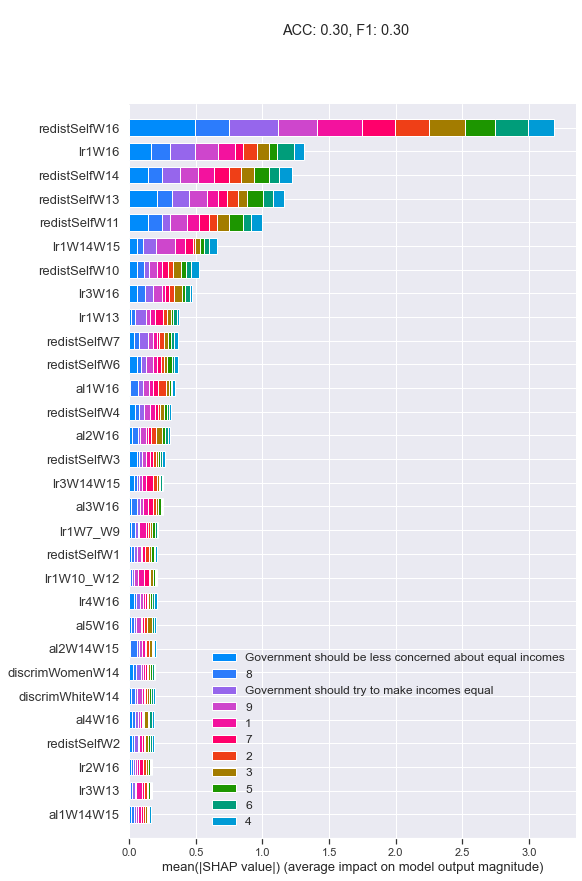

********


Government should try to make incomes equal                0.231159
1                                                          0.092917
2                                                          0.097193
3                                                          0.098415
4                                                          0.071386
5                                                          0.097595
6                                                          0.056680
7                                                          0.063161
8                                                          0.059943
9                                                          0.040409
Government should be less concerned about equal incomes    0.091143
dtype: float64

err_dist: 0.0014395894877374039
0.6485731555379708
---mlogloss---
Ran in 211.1381 seconds
*******************  lr1W17  *********************
ACC: 0.53,  F1: 0.53


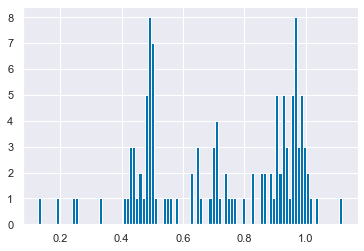

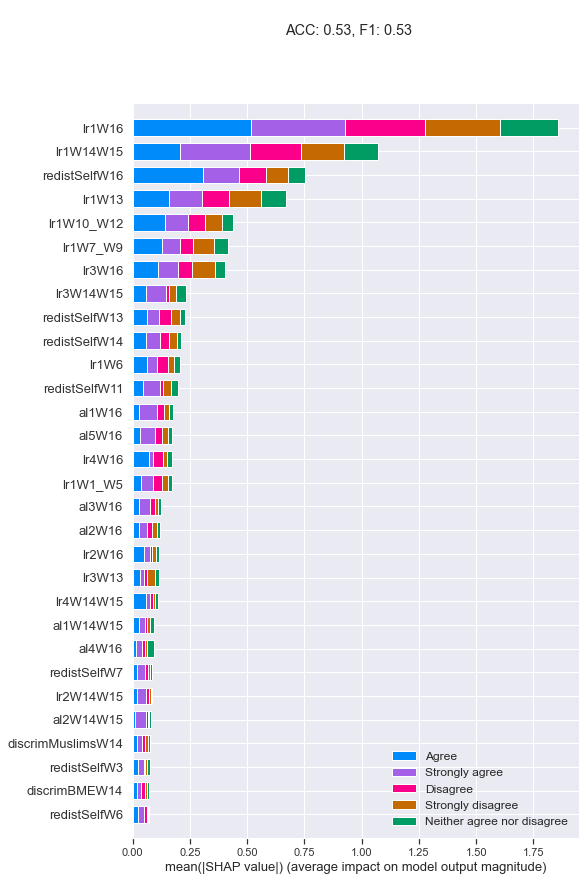

********


Strongly disagree             0.075160
Disagree                      0.169588
Neither agree nor disagree    0.211034
Agree                         0.353314
Strongly agree                0.190904
dtype: float64

err_dist: 0.0012404732600232306
0.7117052729342709
---mlogloss---
Ran in 136.9694 seconds
*******************  lr2W17  *********************
ACC: 0.53,  F1: 0.53


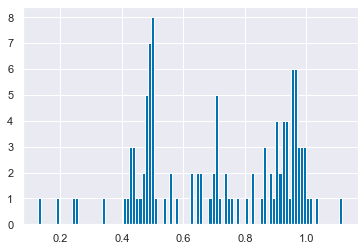

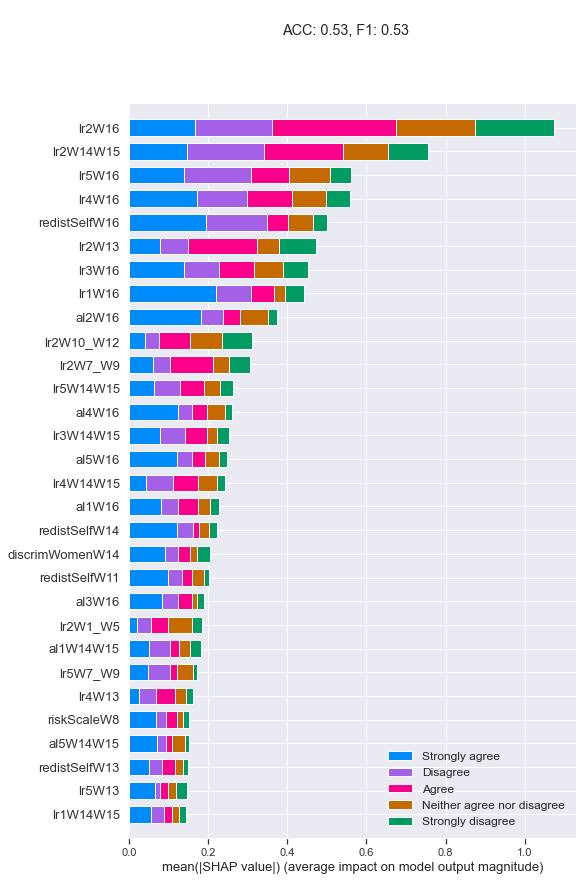

********


Strongly disagree             0.038228
Disagree                      0.104738
Neither agree nor disagree    0.197328
Agree                         0.364807
Strongly agree                0.294899
dtype: float64

err_dist: 0.002889941100365675
0.6341530698809967
---mlogloss---
Ran in 232.9314 seconds
*******************  lr3W17  *********************
ACC: 0.54,  F1: 0.54


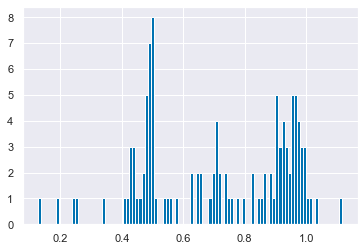

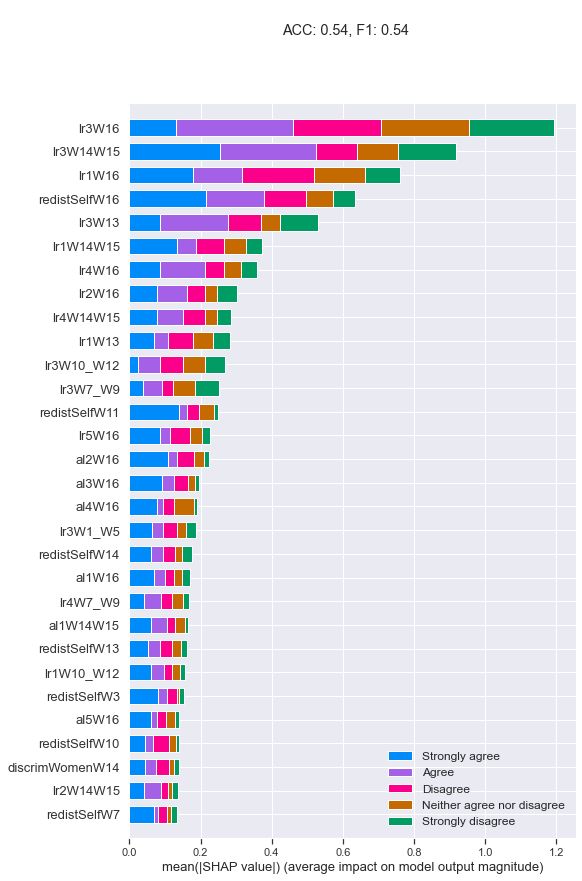

********


Strongly disagree             0.059435
Disagree                      0.095945
Neither agree nor disagree    0.187444
Agree                         0.400570
Strongly agree                0.256606
dtype: float64

err_dist: 0.0009824878432764294
0.6545057574986806
---mlogloss---
Ran in 215.4686 seconds
*******************  lr4W17  *********************
ACC: 0.53,  F1: 0.53


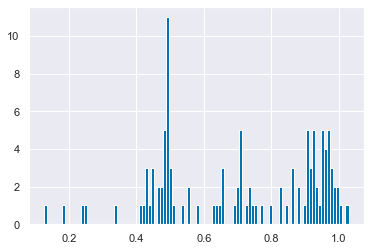

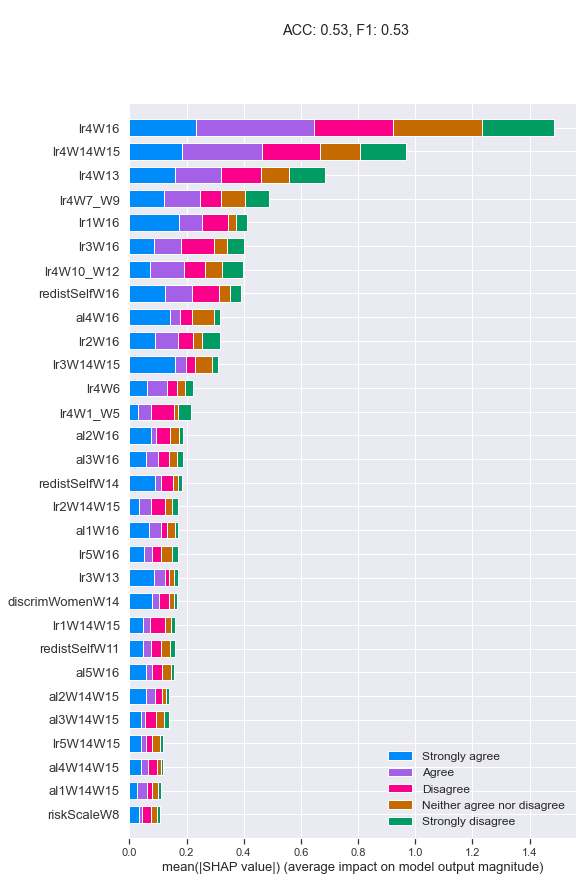

********


Strongly disagree             0.046920
Disagree                      0.134911
Neither agree nor disagree    0.149074
Agree                         0.367546
Strongly agree                0.301549
dtype: float64

err_dist: 0.001011491450643651
0.6480506956889888
---mlogloss---
Ran in 200.3582 seconds
*******************  lr5W17  *********************
ACC: 0.49,  F1: 0.49


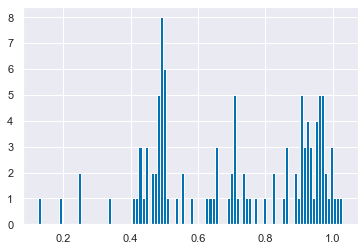

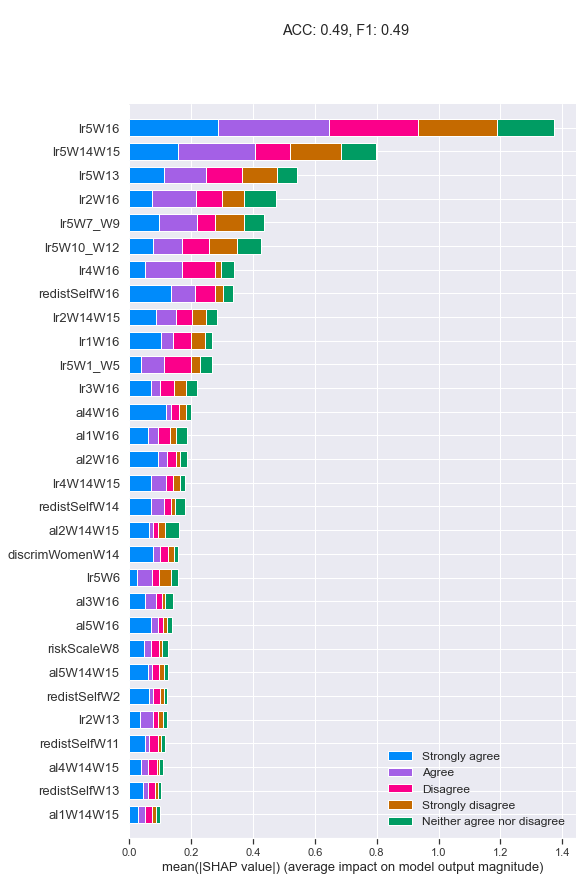

********


Strongly disagree             0.019778
Disagree                      0.213427
Neither agree nor disagree    0.277165
Agree                         0.251229
Strongly agree                0.238401
dtype: float64

err_dist: 0.010348220787865679
0.6836903500357202
---mlogloss---
Ran in 200.8104 seconds
*******************  al1W17  *********************
ACC: 0.55,  F1: 0.55


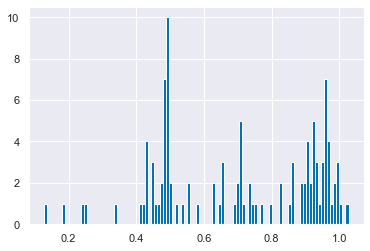

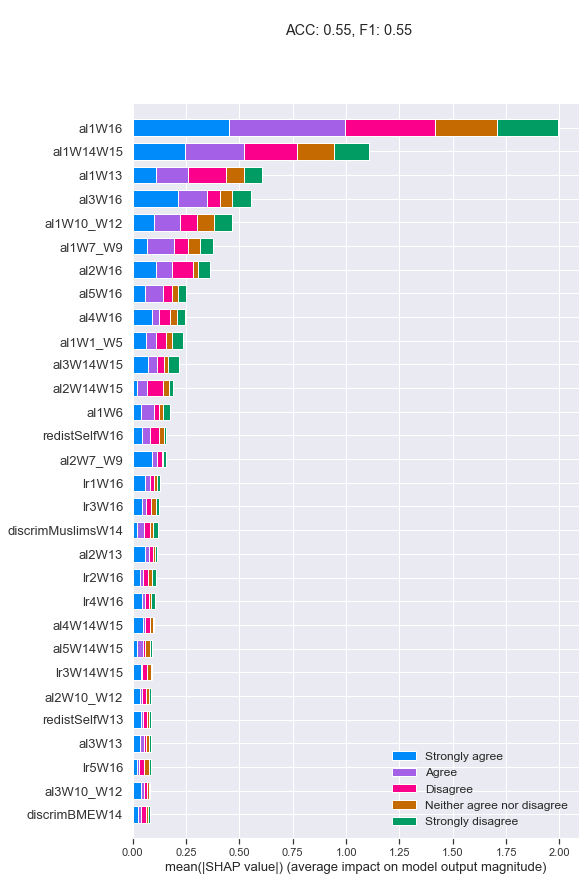

********


Strongly disagree             0.127918
Disagree                      0.143614
Neither agree nor disagree    0.178421
Agree                         0.338133
Strongly agree                0.211914
dtype: float64

err_dist: 0.0030052742148849515
0.6522458095116289
---mlogloss---
Ran in 140.7758 seconds
*******************  al2W17  *********************
ACC: 0.61,  F1: 0.61


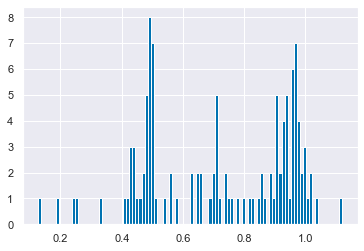

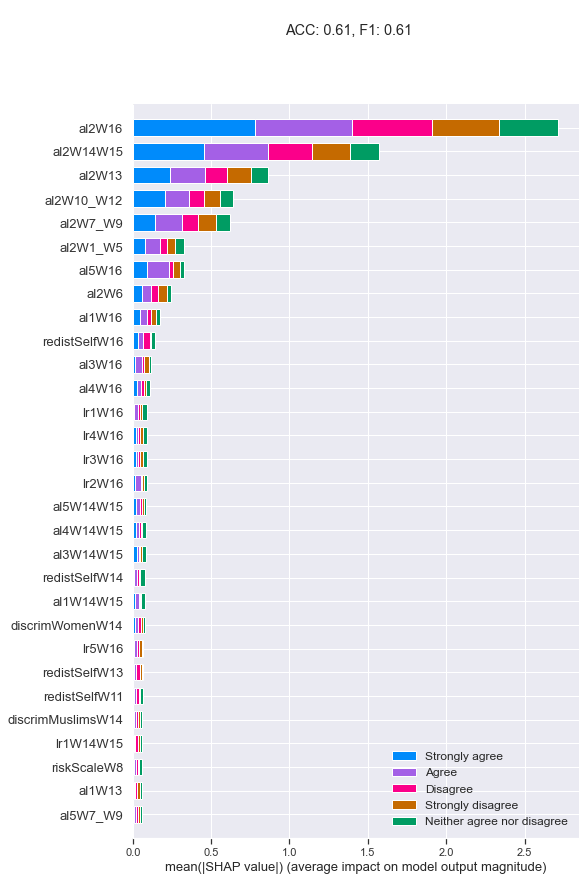

********


Strongly disagree             0.254366
Disagree                      0.185260
Neither agree nor disagree    0.173683
Agree                         0.192027
Strongly agree                0.194663
dtype: float64

err_dist: 0.001893620669422574
0.7190486412569534
---mlogloss---
Ran in 118.5781 seconds
*******************  al3W17  *********************
ACC: 0.54,  F1: 0.54


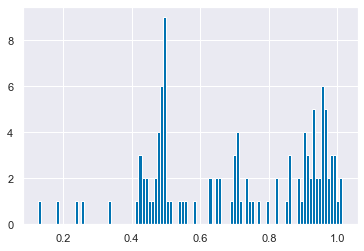

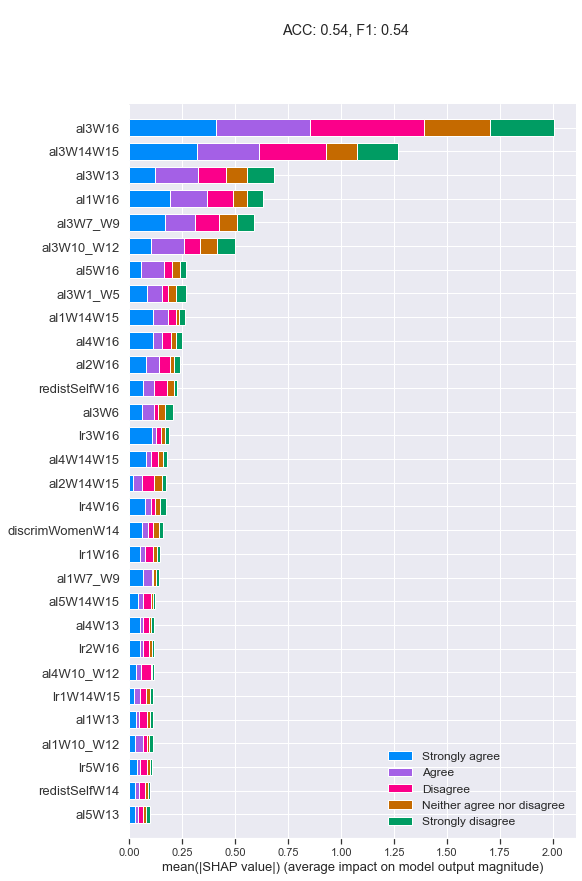

********


Strongly disagree             0.090384
Disagree                      0.138142
Neither agree nor disagree    0.193683
Agree                         0.362583
Strongly agree                0.215207
dtype: float64

err_dist: 0.0022233019856715197
0.6562517645248415
---mlogloss---
Ran in 179.6839 seconds
*******************  al4W17  *********************
ACC: 0.51,  F1: 0.51


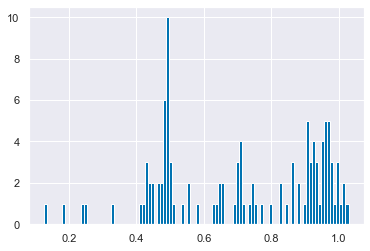

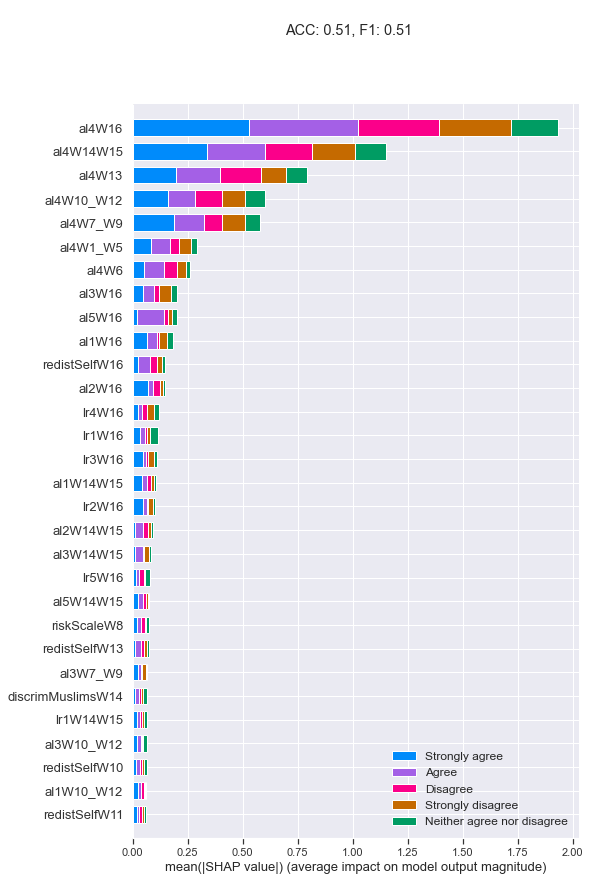

********


Strongly disagree             0.181112
Disagree                      0.221697
Neither agree nor disagree    0.193039
Agree                         0.287743
Strongly agree                0.116410
dtype: float64

err_dist: 0.0034868053305094258
0.6422767066843709
---mlogloss---
Ran in 137.6975 seconds
*******************  al5W17  *********************
ACC: 0.57,  F1: 0.57


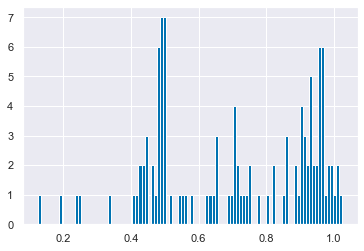

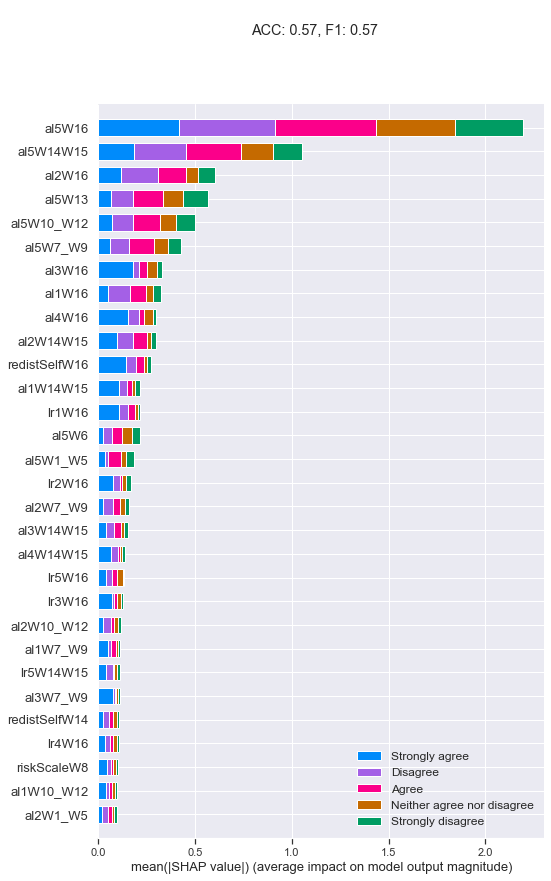

********


Strongly disagree             0.067821
Disagree                      0.119913
Neither agree nor disagree    0.219455
Agree                         0.349243
Strongly agree                0.243568
dtype: float64

err_dist: 0.0017173986928712415
0.649532568097116
---mlogloss---
Ran in 152.8248 seconds
*******************  redistSelfW18  *********************
ACC: 0.31,  F1: 0.31


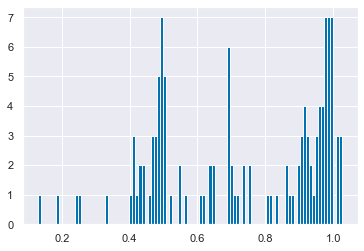

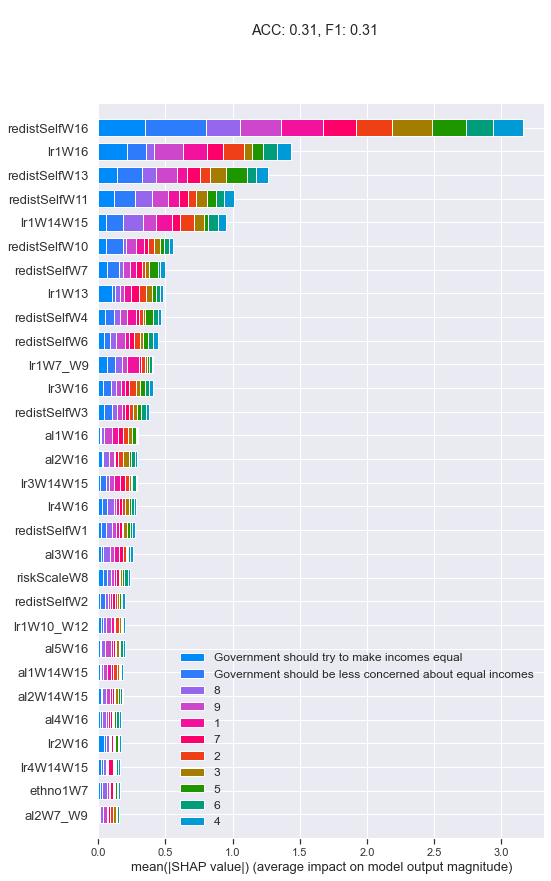

********


Government should try to make incomes equal                0.274779
1                                                          0.060268
2                                                          0.094514
3                                                          0.107628
4                                                          0.069078
5                                                          0.109747
6                                                          0.065298
7                                                          0.045351
8                                                          0.048657
9                                                          0.040653
Government should be less concerned about equal incomes    0.084027
dtype: float64

err_dist: 0.0023146463012464337
0.6106313098049216
---mlogloss---
Ran in 240.6425 seconds
*******************  redistSelfW19  *********************
ACC: 0.32,  F1: 0.32


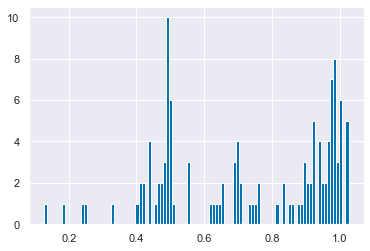

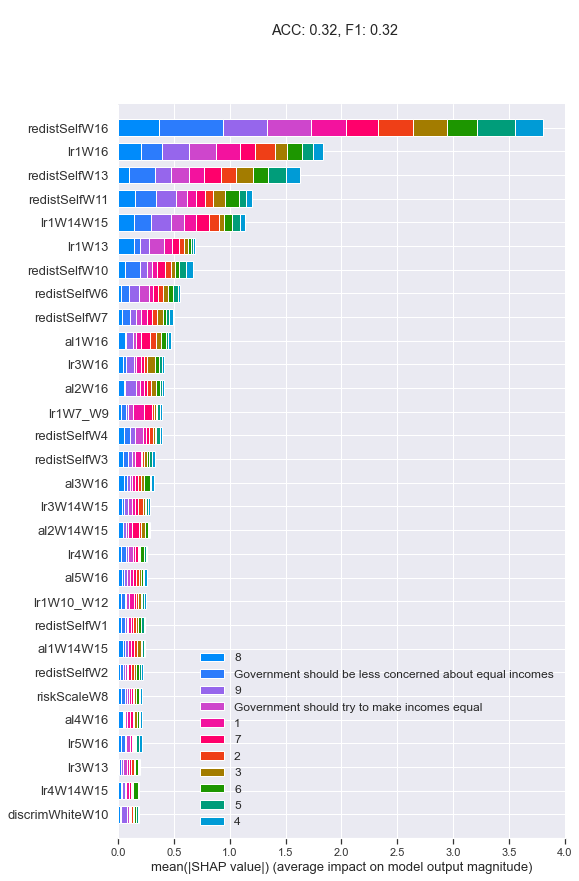

********


Government should try to make incomes equal                0.263849
1                                                          0.058101
2                                                          0.092399
3                                                          0.096428
4                                                          0.100706
5                                                          0.085107
6                                                          0.069612
7                                                          0.066569
8                                                          0.066819
9                                                          0.024169
Government should be less concerned about equal incomes    0.076242
dtype: float64

err_dist: 0.002196859692782118
0.6554067900087648
---mlogloss---
Ran in 219.3151 seconds
*******************  community1W19  *********************
ACC: 0.49,  F1: 0.49


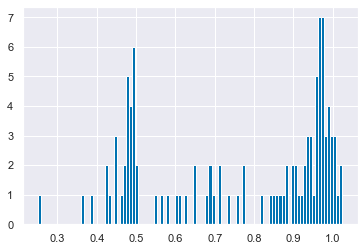

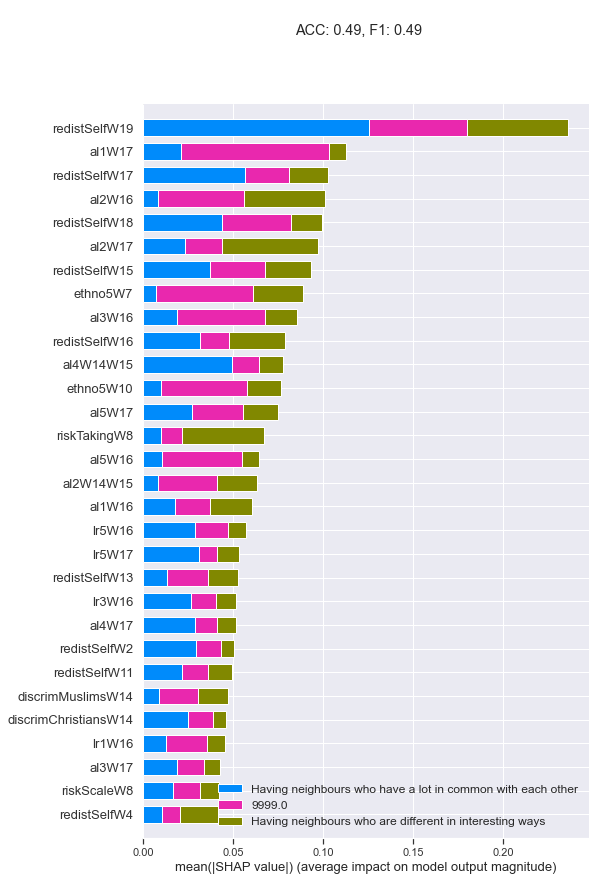

********


Having neighbours who have a lot in common with each other    0.178702
Having neighbours who are different in interesting ways       0.210205
9999.0                                                        0.611094
dtype: float64

err_dist: 0.08442717222226885
0.8354091568985039
---mlogloss---
Ran in 20.2345 seconds
*******************  community2W19  *********************
ACC: 0.64,  F1: 0.64


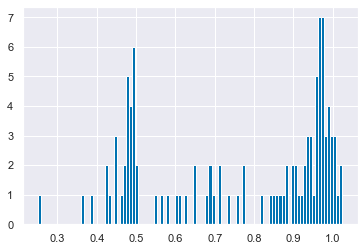

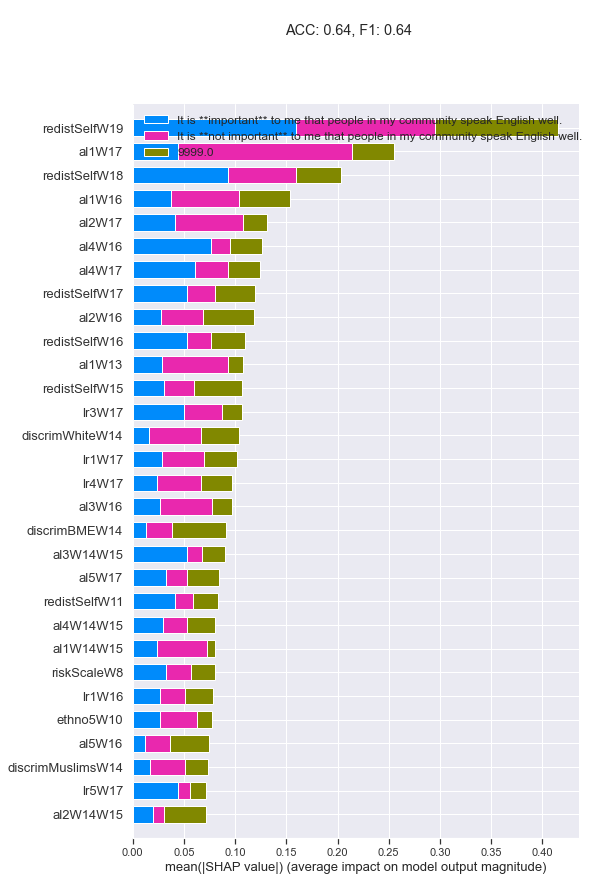

********


It is **important** to me that people in my community speak English well.        0.334530
It is **not important** to me that people in my community speak English well.    0.173031
9999.0                                                                           0.492439
dtype: float64

err_dist: 0.07947111227047418
0.8565977213381739
---mlogloss---
Ran in 24.8565 seconds
*******************  community3W19  *********************
ACC: 0.66,  F1: 0.66


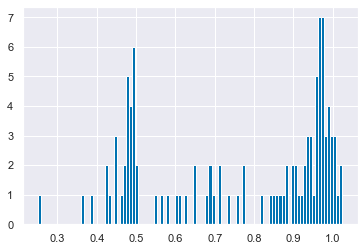

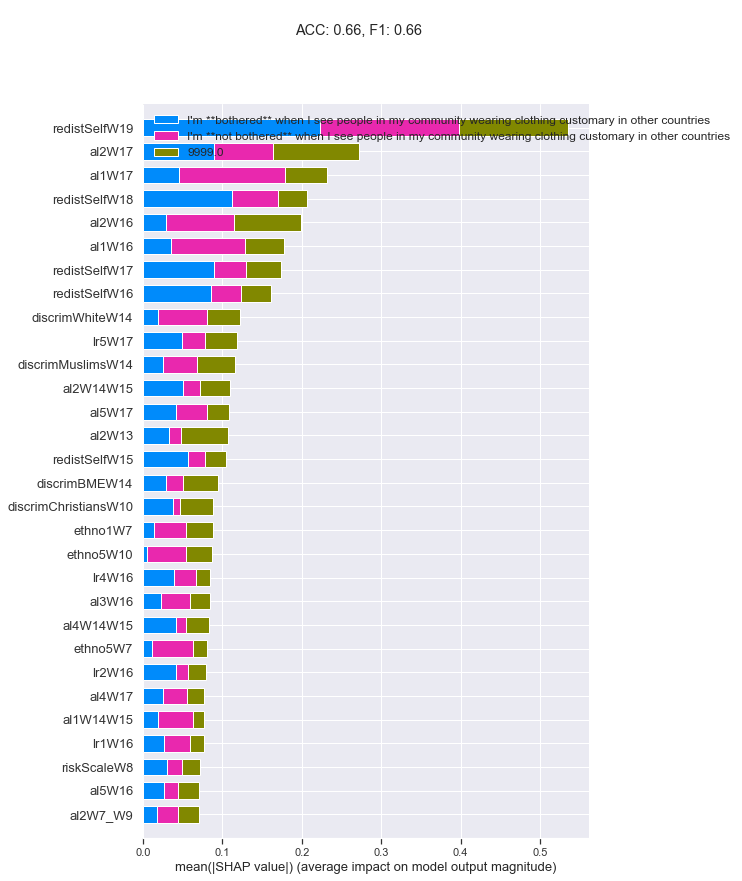

********


I'm **bothered** when I see people in my community wearing clothing customary in other countries        0.141168
I'm **not bothered** when I see people in my community wearing clothing customary in other countries    0.414671
9999.0                                                                                                  0.444161
dtype: float64

err_dist: 0.07189159038151988
0.8416045605021417
---mlogloss---
Ran in 25.7132 seconds
*******************  community4W19  *********************
ACC: 0.67,  F1: 0.67


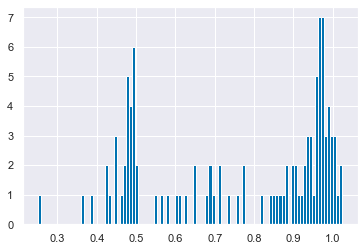

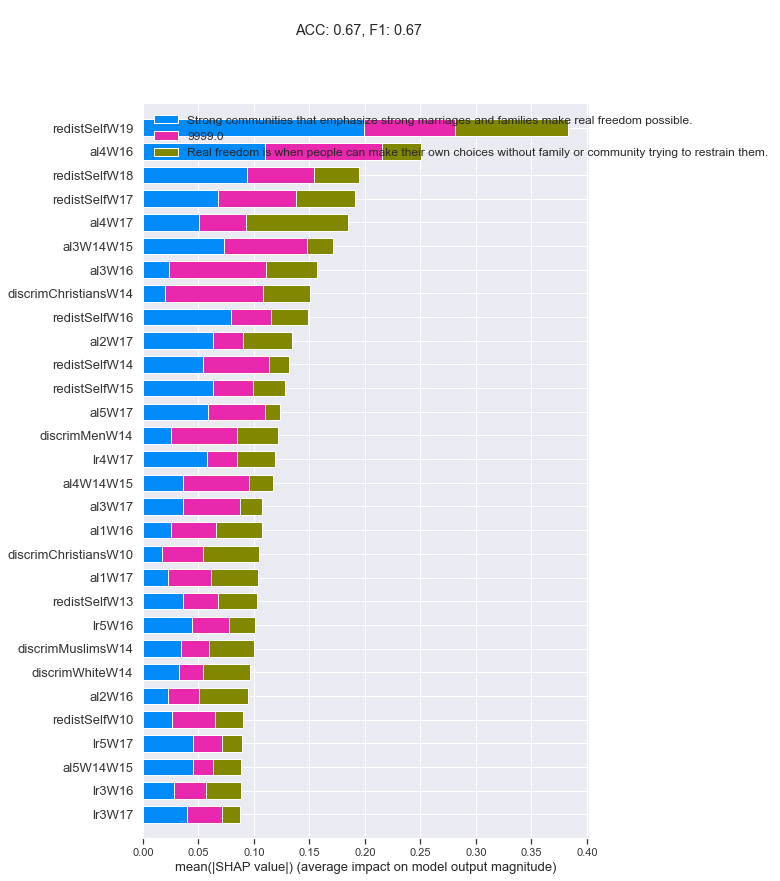

********


Strong communities that emphasize strong marriages and families make real freedom possible.                    0.081087
Real freedom is when people can make their own choices without family or community trying to restrain them.    0.411206
9999.0                                                                                                         0.507707
dtype: float64

err_dist: 0.08561457310667119
0.8588558240233652
---mlogloss---
Ran in 28.1045 seconds
*******************  incremental1W19  *********************
ACC: 0.53,  F1: 0.53


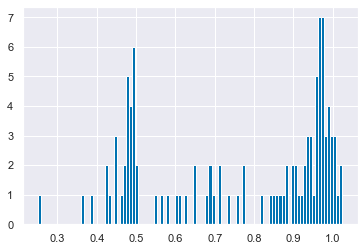

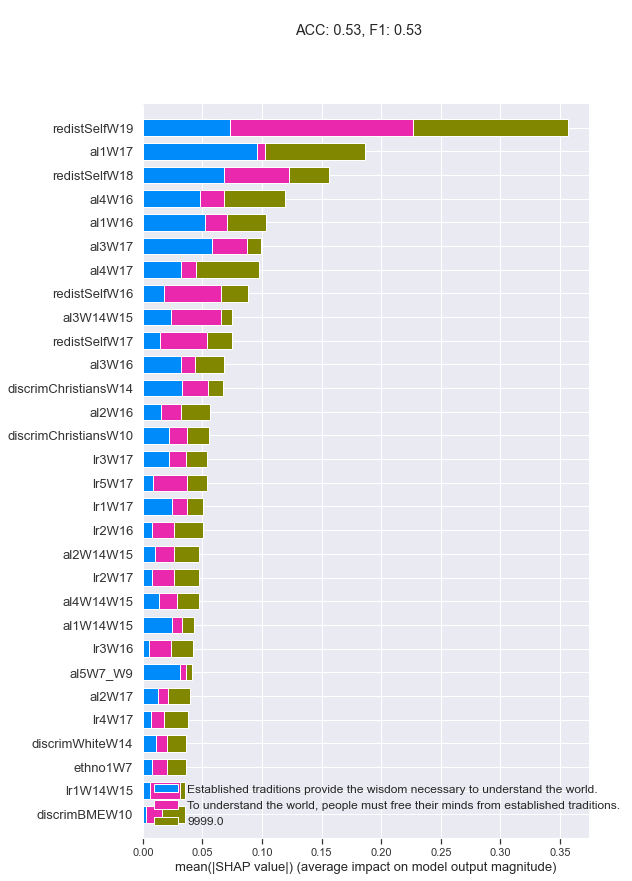

********


To understand the world, people must free their minds from established traditions.    0.156796
Established traditions provide the wisdom necessary to understand the world.          0.146557
9999.0                                                                                0.696647
dtype: float64

err_dist: 0.12162014932863874
0.7908066998119924
---mlogloss---
Ran in 14.7530 seconds
*******************  incremental2W19  *********************
ACC: 0.54,  F1: 0.54


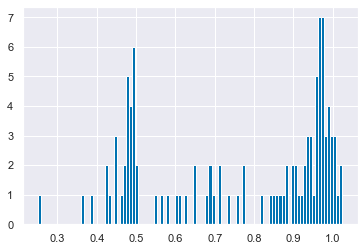

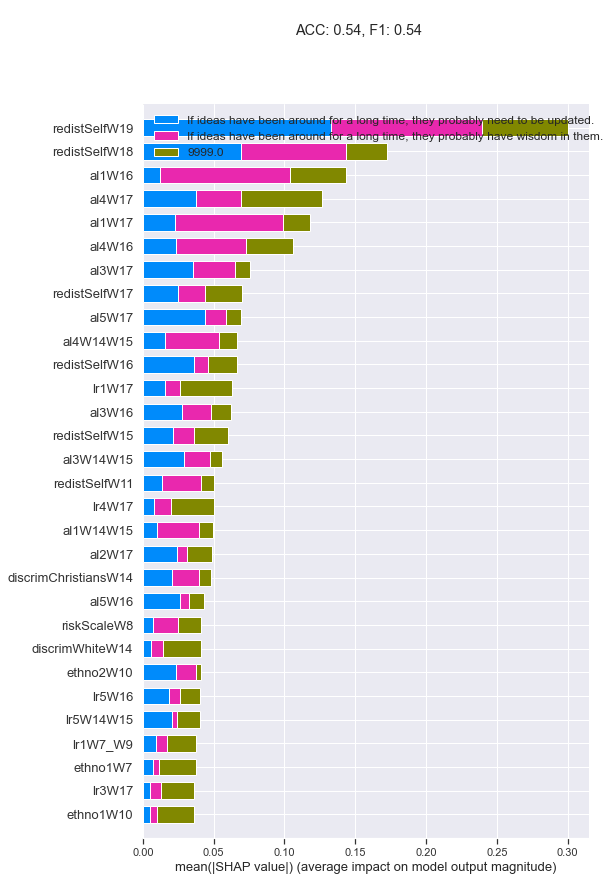

********


If ideas have been around for a long time, they probably need to be updated.     0.137106
If ideas have been around for a long time, they probably have wisdom in them.    0.209856
9999.0                                                                           0.653038
dtype: float64

err_dist: 0.09680422417099392
0.7934977565249574
---mlogloss---
Ran in 15.2514 seconds
*******************  incremental3W19  *********************
ACC: 0.56,  F1: 0.56


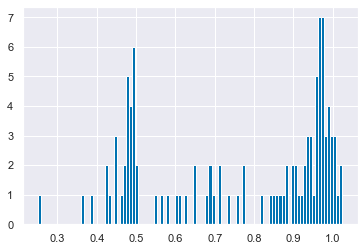

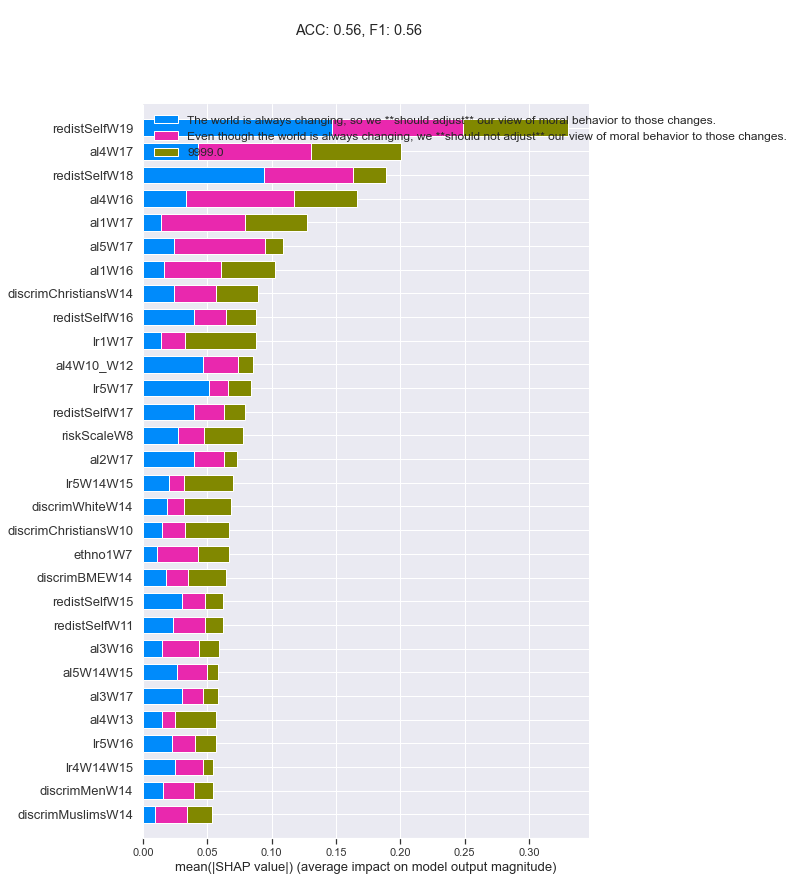

********


The world is always changing, so we **should adjust** our view of moral behavior to those changes.                 0.239154
Even though the world is always changing, we **should not adjust** our view of moral behavior to those changes.    0.180299
9999.0                                                                                                             0.580547
dtype: float64

err_dist: 0.09258408956438213
0.8308146211162746
---mlogloss---
Ran in 20.9946 seconds
*******************  incremental4W19  *********************
ACC: 0.61,  F1: 0.61


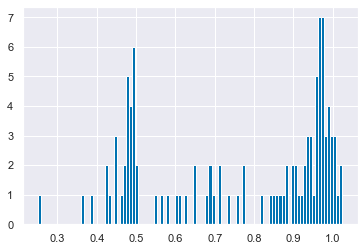

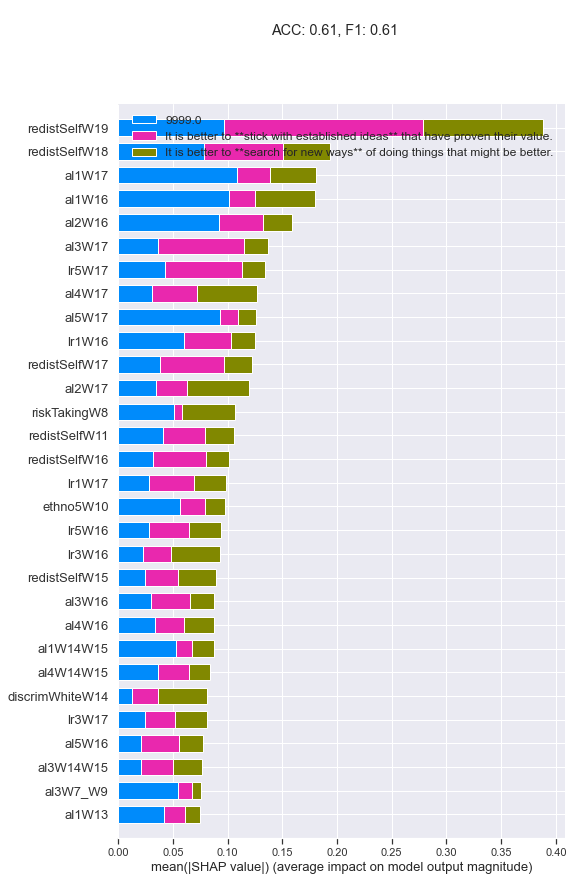

********


It is better to **stick with established ideas** that have proven their value.    0.104005
It is better to **search for new ways** of doing things that might be better.     0.315268
9999.0                                                                            0.580727
dtype: float64

err_dist: 0.10168999908601595
0.8685442852921194
---mlogloss---
Ran in 28.2918 seconds
*******************  auth1W19  *********************
MSE: 0.17, MAE: 0.35, EV: 0.31, R2: 0.30


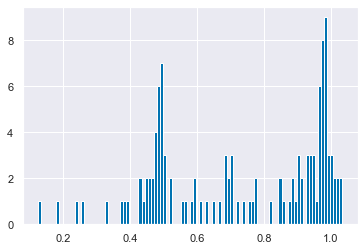

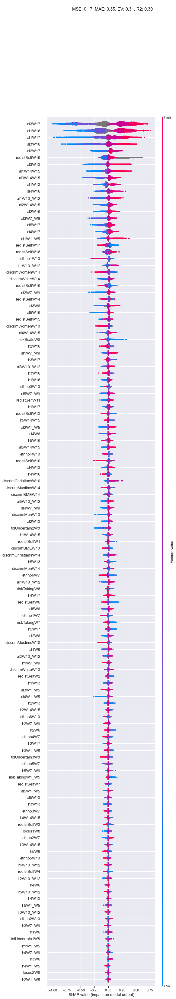

********


Independence          0.316251
Respect for elders    0.683749
dtype: float64

err_dist: 0.0
0.8493605080443525
---mlogloss---
Ran in 14.7350 seconds
*******************  auth2W19  *********************
MSE: 0.18, MAE: 0.34, EV: 0.18, R2: 0.15


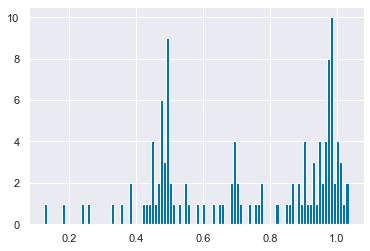

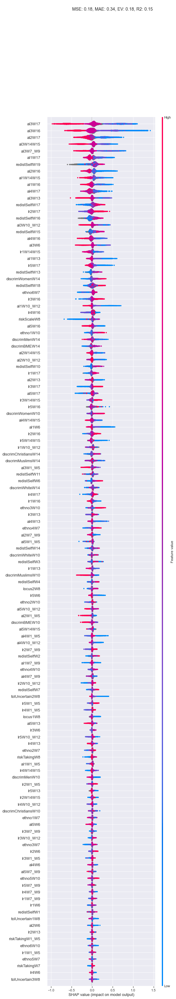

********


Obedience        0.531832
Self-reliance    0.468168
dtype: float64

err_dist: 0.0
0.8708551914230942
---mlogloss---
Ran in 16.9815 seconds
*******************  auth4W19  *********************
MSE: 0.19, MAE: 0.39, EV: 0.22, R2: 0.22


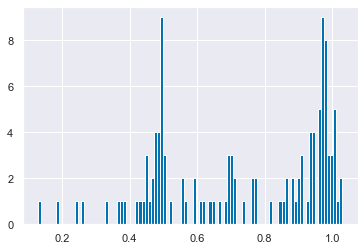

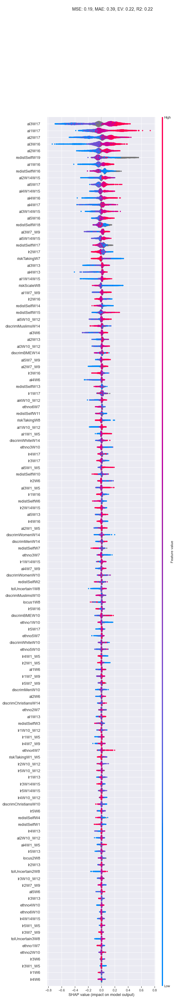

********


Orderly        0.262112
Imaginative    0.737888
dtype: float64

err_dist: 0.0
0.8189835892490968
---mlogloss---
Ran in 14.4334 seconds
*******************  auth5W19  *********************
ACC: 0.76,  F1: 0.76


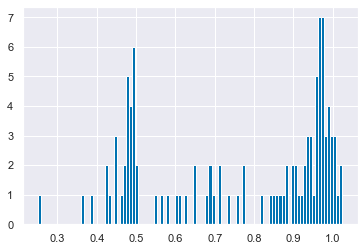

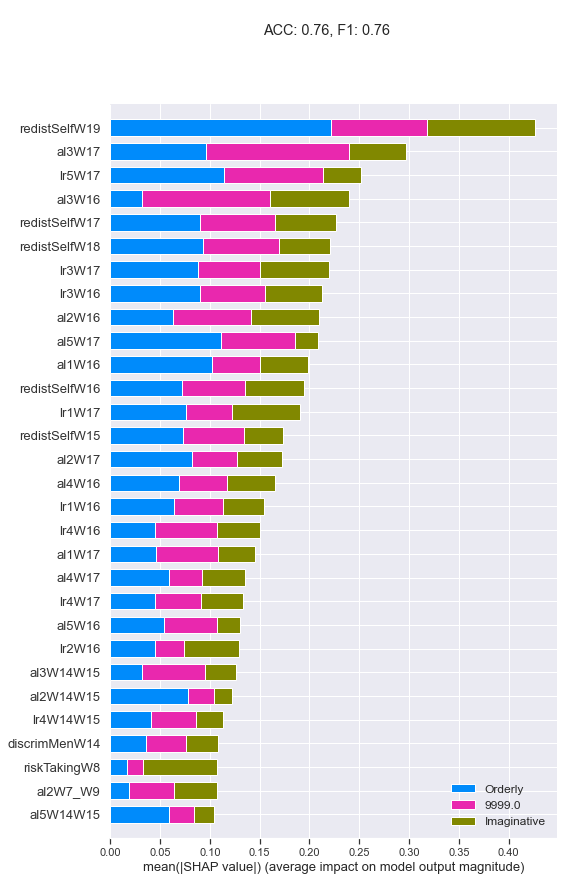

********


Orderly        0.057628
Imaginative    0.565110
9999.0         0.377261
dtype: float64

err_dist: 0.05290237479889168
0.9169529730480509
---mlogloss---
Ran in 33.5478 seconds
*******************  competitiveness1W19  *********************
MSE: 0.07, MAE: 0.13, EV: -0.22, R2: -0.24


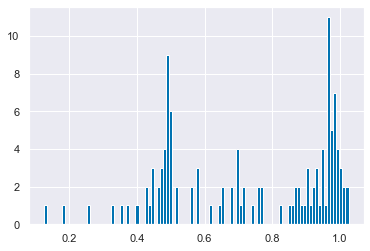

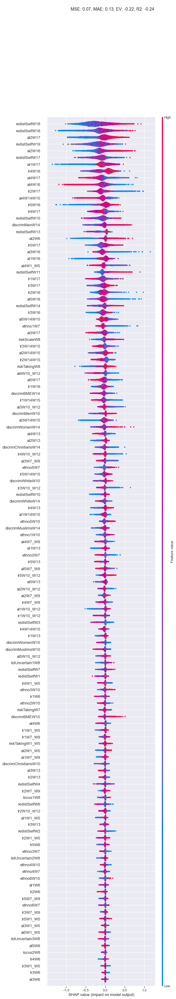

********


Kind     0.982721
Tough    0.017279
dtype: float64

err_dist: 0.0
0.9285714285714286
---mlogloss---
Ran in 19.4498 seconds
*******************  competitiveness2W19  *********************
MSE: 0.02, MAE: 0.04, EV: -0.15, R2: -0.15


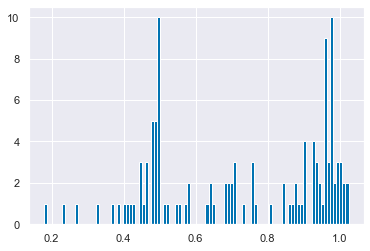

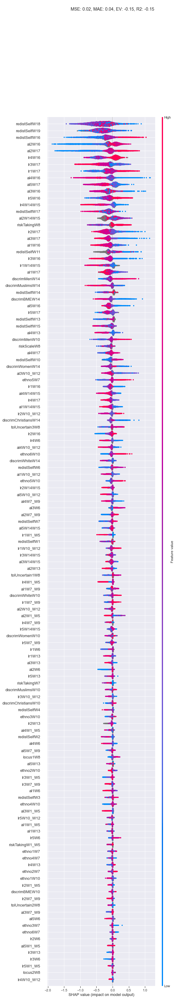

********


Compromising    0.995308
Aggressive      0.004692
dtype: float64

err_dist: 0.0
0.9217687074829932
---mlogloss---
Ran in 15.8555 seconds
*******************  competitiveness3W19  *********************
MSE: 0.13, MAE: 0.25, EV: -0.15, R2: -0.17


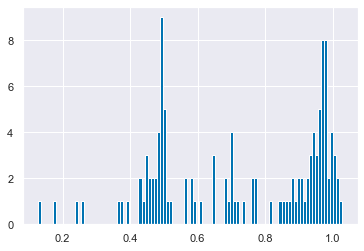

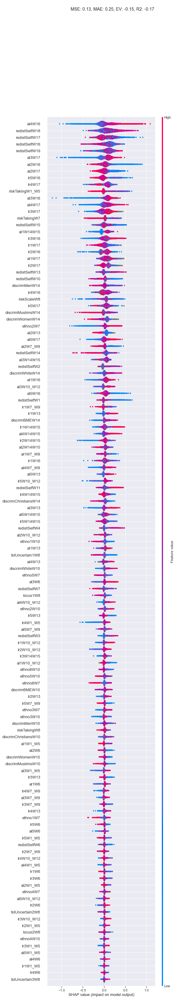

********


Strong-willed    0.160836
Good-natured     0.839164
dtype: float64

err_dist: 0.0
0.9200352339409481
---mlogloss---
Ran in 20.8790 seconds
*******************  competitiveness4W19  *********************
MSE: 0.04, MAE: 0.08, EV: -0.25, R2: -0.26


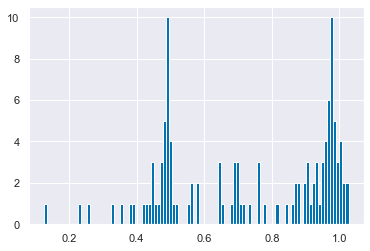

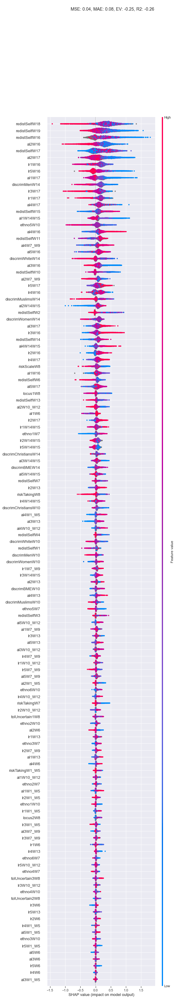

********


Forceful      0.006932
Empathetic    0.993068
dtype: float64

err_dist: 0.0
0.9521276595744681
---mlogloss---
Ran in 18.1580 seconds
*******************  hostileSexism1W19  *********************
ACC: 0.34,  F1: 0.34


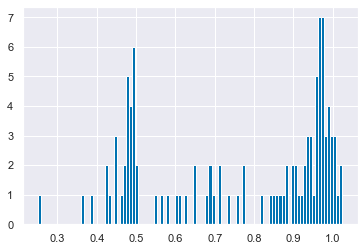

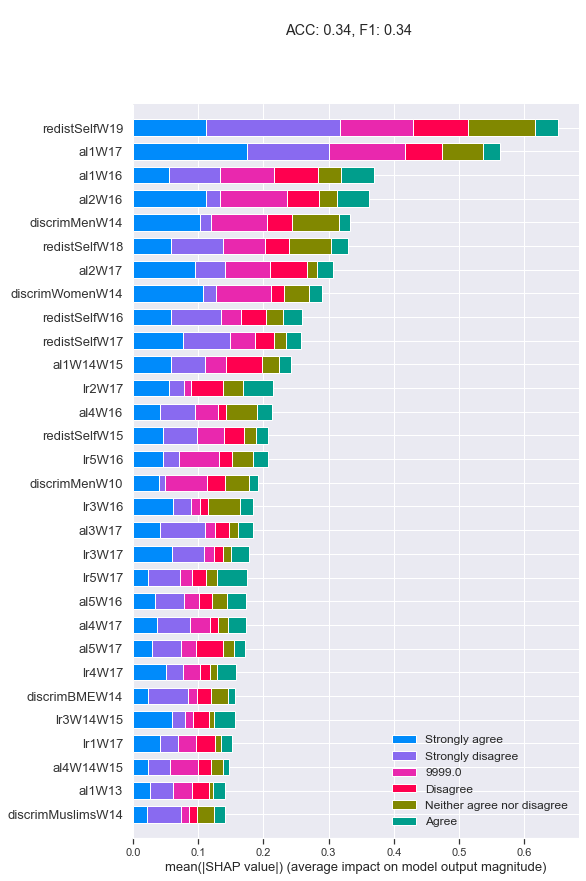

********


Strongly disagree             0.078713
Disagree                      0.105378
Neither agree nor disagree    0.201406
Agree                         0.114908
Strongly agree                0.022457
9999.0                        0.477138
dtype: float64

err_dist: 0.03960604949564667
0.7907951427083325
---mlogloss---
Ran in 36.4533 seconds
*******************  hostileSexism2W19  *********************
ACC: 0.36,  F1: 0.36


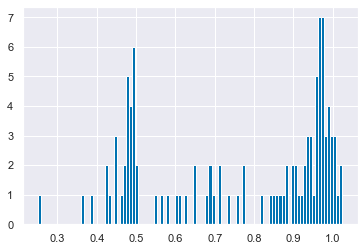

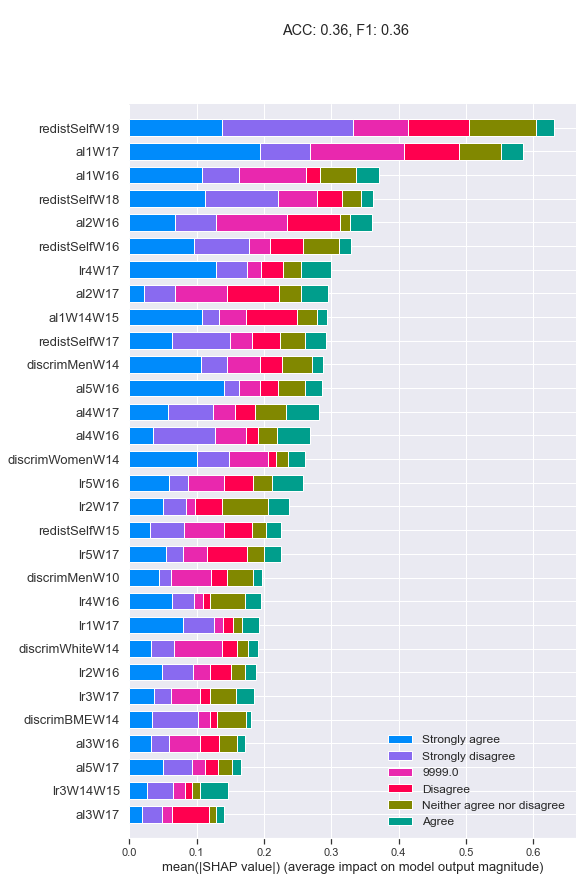

********


Strongly disagree             0.083045
Disagree                      0.123065
Neither agree nor disagree    0.229692
Agree                         0.093688
Strongly agree                0.027014
9999.0                        0.443497
dtype: float64

err_dist: 0.03257391326600629
0.8009363728025249
---mlogloss---
Ran in 41.0446 seconds
*******************  hostileSexism3W19  *********************
ACC: 0.34,  F1: 0.34


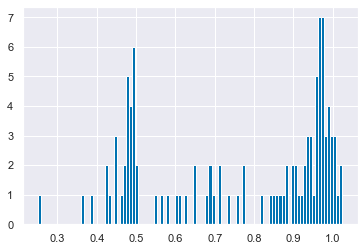

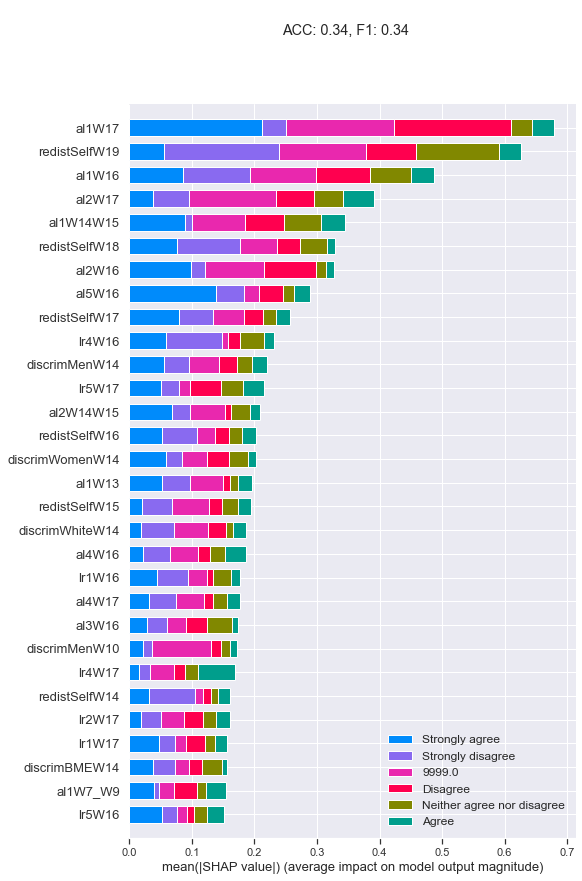

********


Strongly disagree             0.069071
Disagree                      0.099145
Neither agree nor disagree    0.178927
Agree                         0.129332
Strongly agree                0.051058
9999.0                        0.472468
dtype: float64

err_dist: 0.0372151386971931
0.7874600205242106
---mlogloss---
Ran in 35.4632 seconds
*******************  benevolentSexism1W19  *********************
ACC: 0.37,  F1: 0.37


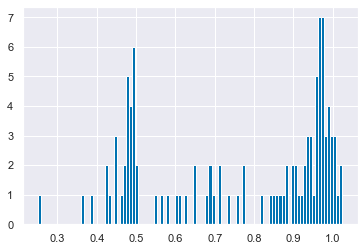

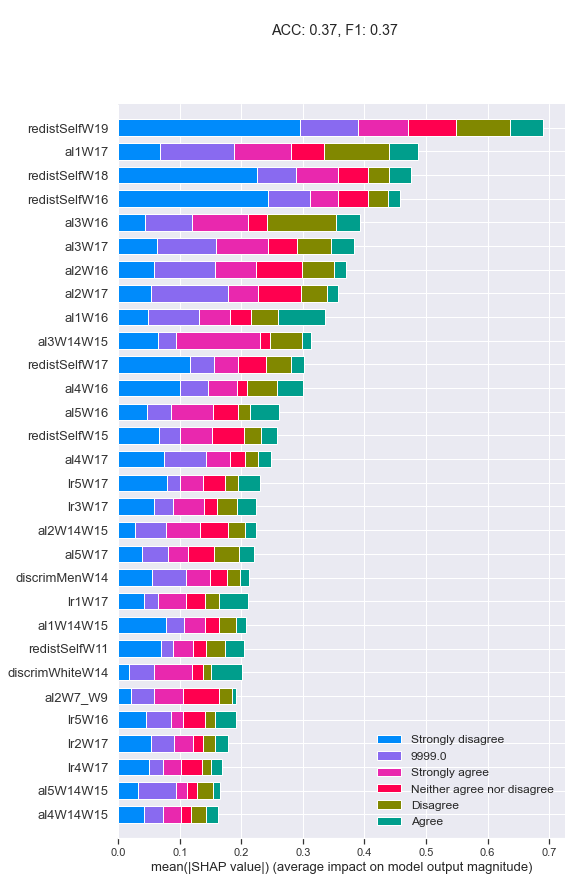

********


Strongly disagree             0.062421
Disagree                      0.073132
Neither agree nor disagree    0.242664
Agree                         0.184473
Strongly agree                0.056537
9999.0                        0.380772
dtype: float64

err_dist: 0.026939361494481274
0.8089218530532954
---mlogloss---
Ran in 44.9680 seconds
*******************  benevolentSexism2W19  *********************
ACC: 0.37,  F1: 0.37


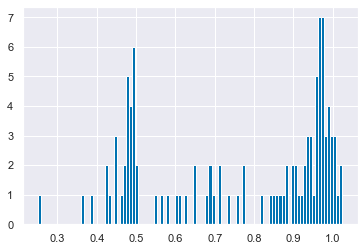

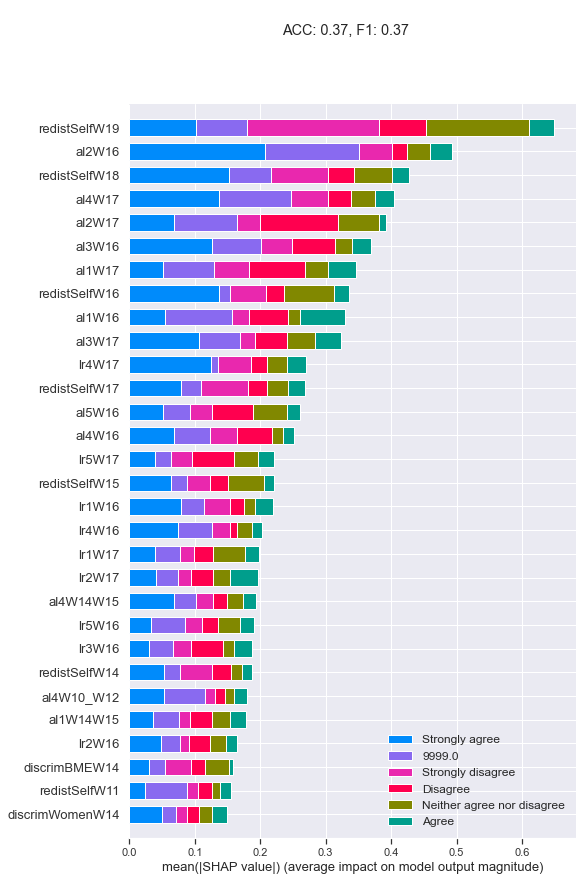

********


Strongly disagree             0.059147
Disagree                      0.105828
Neither agree nor disagree    0.218981
Agree                         0.084496
Strongly agree                0.015943
9999.0                        0.515605
dtype: float64

err_dist: 0.03886375290578612
0.8286499723338833
---mlogloss---
Ran in 43.1389 seconds
*******************  benevolentSexism3W19  *********************
ACC: 0.34,  F1: 0.34


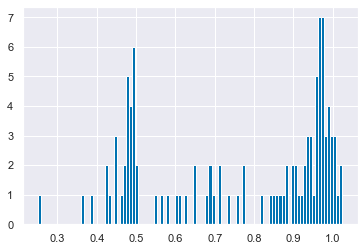

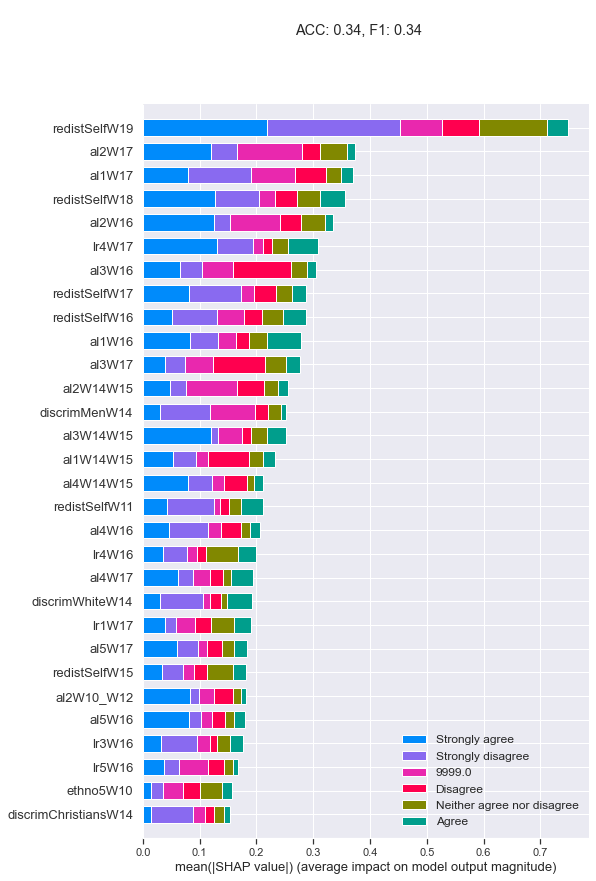

********


Strongly disagree             0.106784
Disagree                      0.151316
Neither agree nor disagree    0.183202
Agree                         0.094689
Strongly agree                0.024752
9999.0                        0.439255
dtype: float64

err_dist: 0.03447145075870628
0.7752984094982956
---mlogloss---
Ran in 38.6802 seconds
*******************  hostileSexismM1W19  *********************
ACC: 0.39,  F1: 0.39


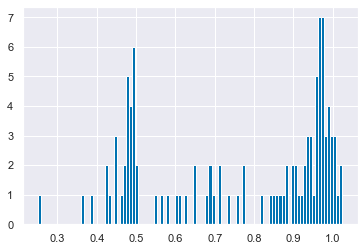

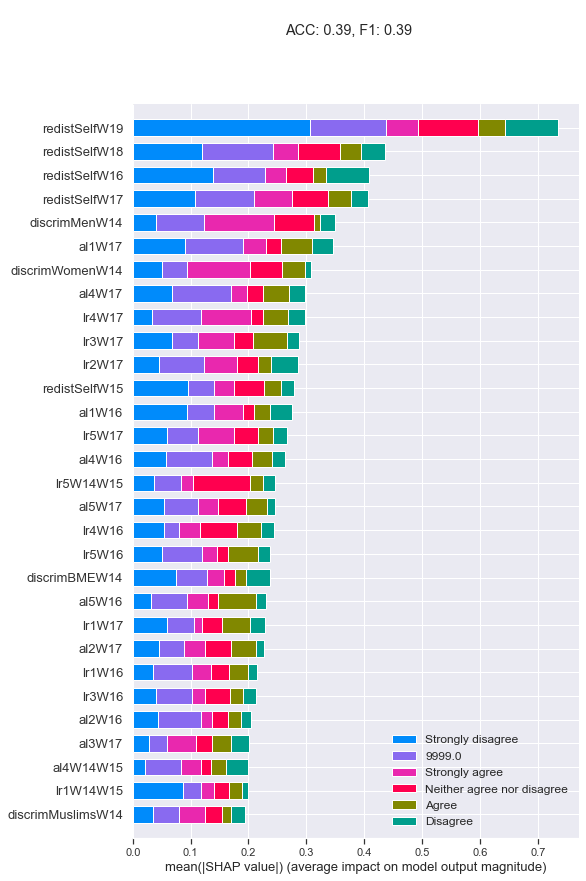

********


Strongly disagree             0.007752
Disagree                      0.048189
Neither agree nor disagree    0.159608
Agree                         0.250979
Strongly agree                0.120635
9999.0                        0.412838
dtype: float64

err_dist: 0.03132858243392883
0.8282704178096468
---mlogloss---
Ran in 45.9019 seconds
*******************  hostileSexismM2W19  *********************
ACC: 0.35,  F1: 0.35


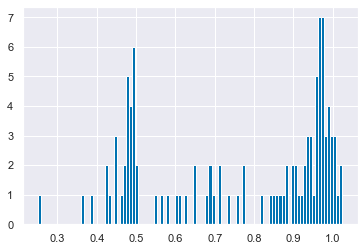

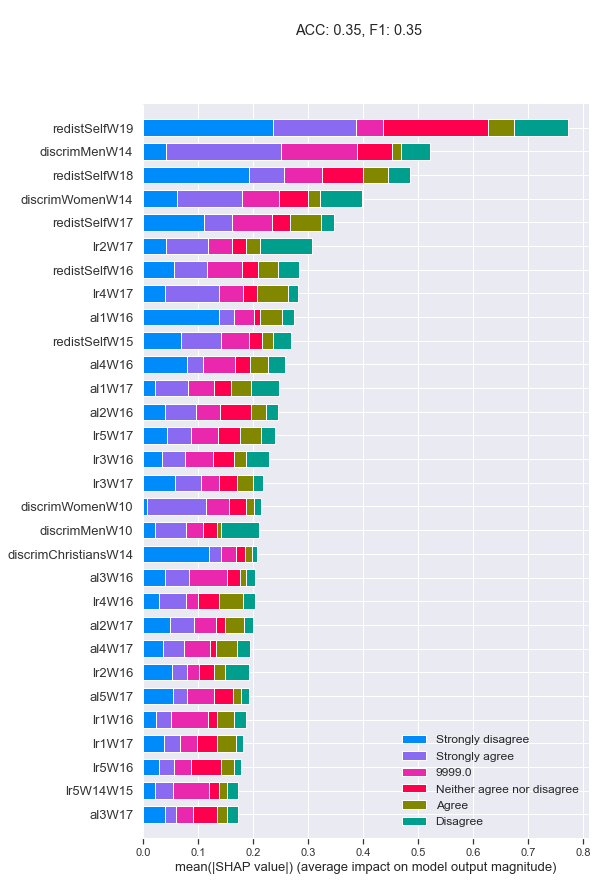

********


Strongly disagree             0.024392
Disagree                      0.090830
Neither agree nor disagree    0.234316
Agree                         0.157471
Strongly agree                0.055277
9999.0                        0.437714
dtype: float64

err_dist: 0.03188795888284685
0.8380400765441546
---mlogloss---
Ran in 45.4620 seconds
*******************  lr1W1_W5  *********************
ACC: 0.45,  F1: 0.45


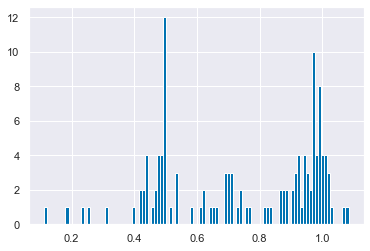

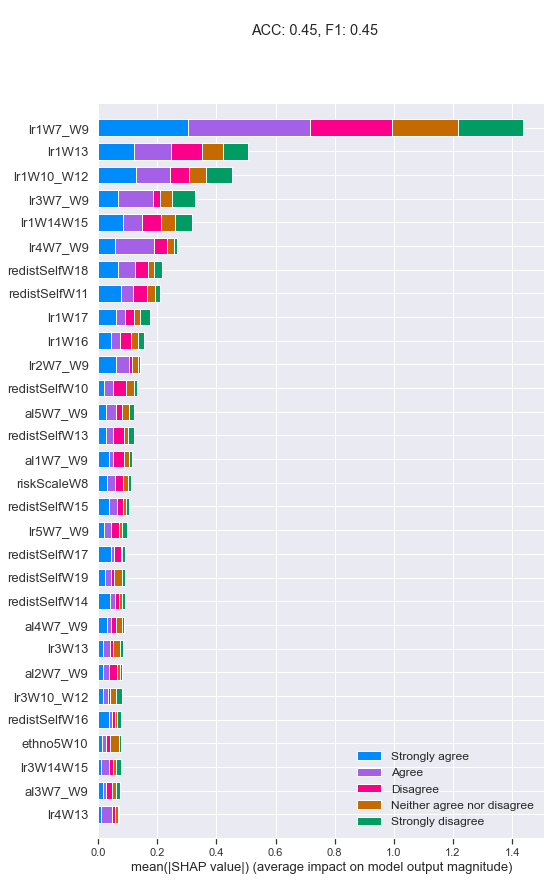

********


Strongly disagree             0.054094
Disagree                      0.173936
Neither agree nor disagree    0.248953
Agree                         0.345261
Strongly agree                0.177756
dtype: float64

err_dist: 0.0005671986406400585
0.6764079412241113
---mlogloss---
Ran in 178.4595 seconds
*******************  lr2W1_W5  *********************
ACC: 0.39,  F1: 0.39


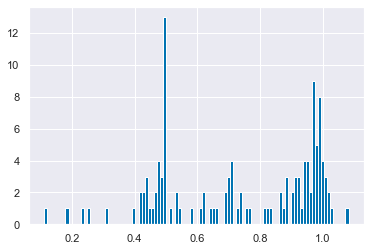

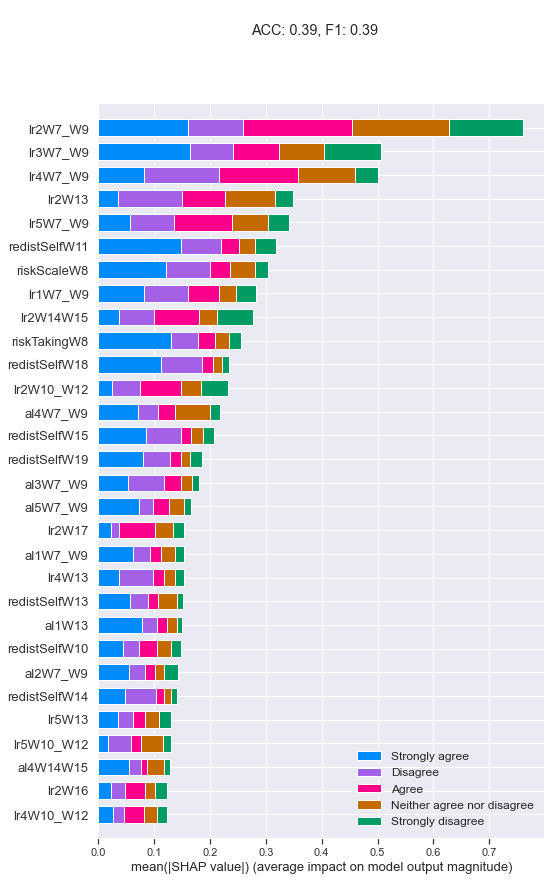

********


Strongly disagree             0.047466
Disagree                      0.071828
Neither agree nor disagree    0.200797
Agree                         0.385843
Strongly agree                0.294064
dtype: float64

err_dist: 0.0018743663202318308
0.6243855921196163
---mlogloss---
Ran in 291.7399 seconds
*******************  lr3W1_W5  *********************
ACC: 0.52,  F1: 0.52


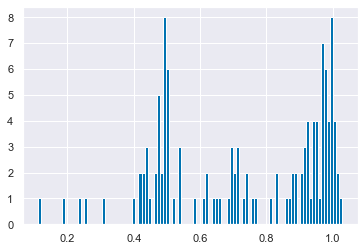

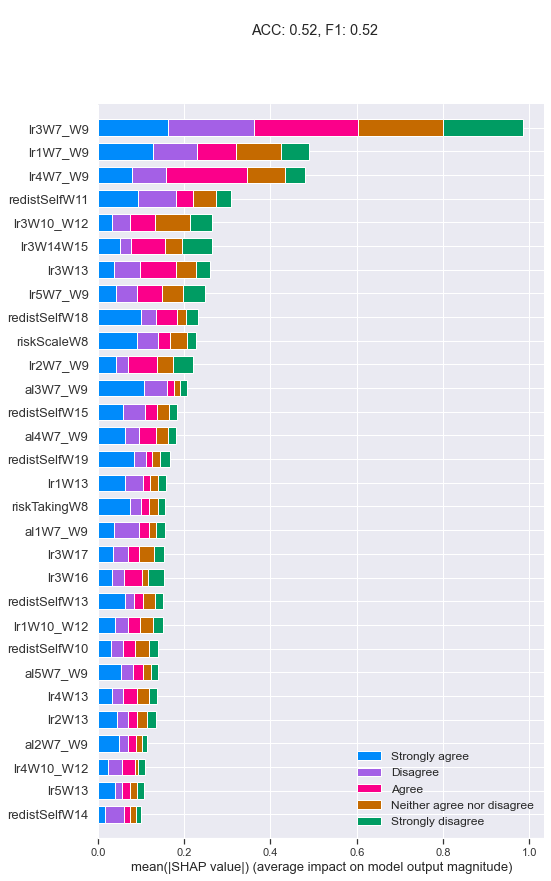

********


Strongly disagree             0.023189
Disagree                      0.104254
Neither agree nor disagree    0.204776
Agree                         0.414434
Strongly agree                0.253347
dtype: float64

err_dist: 0.0010626484975198955
0.7275319618177993
---mlogloss---
Ran in 272.5821 seconds
*******************  lr4W1_W5  *********************
ACC: 0.40,  F1: 0.40


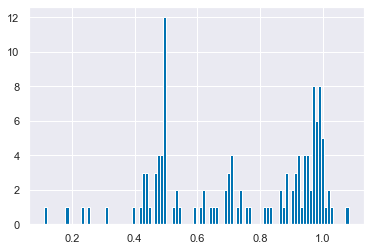

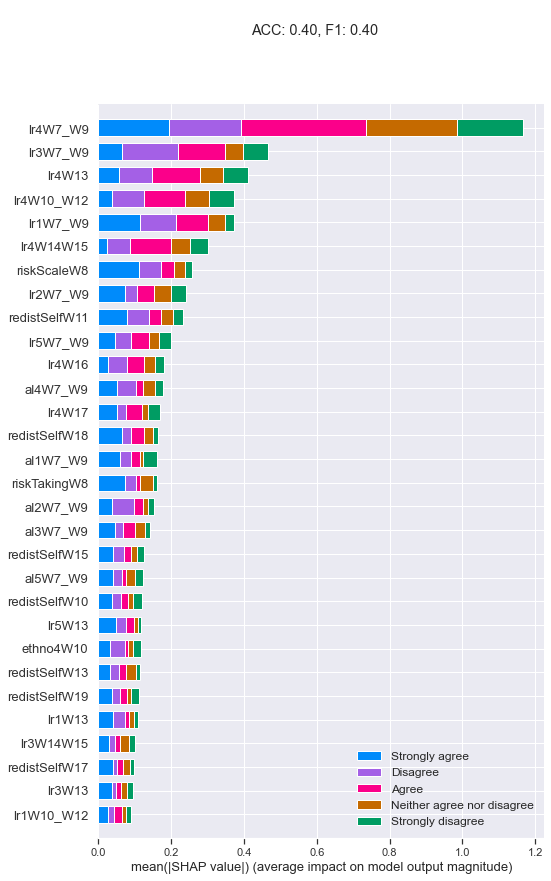

********


Strongly disagree             0.054705
Disagree                      0.125322
Neither agree nor disagree    0.188010
Agree                         0.335502
Strongly agree                0.296460
dtype: float64

err_dist: 0.0012943395771271111
0.6481147874789885
---mlogloss---
Ran in 265.9469 seconds
*******************  lr5W1_W5  *********************
ACC: 0.49,  F1: 0.49


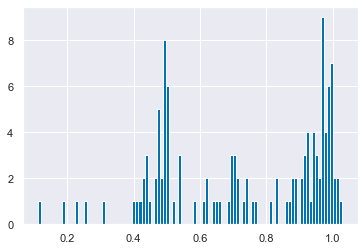

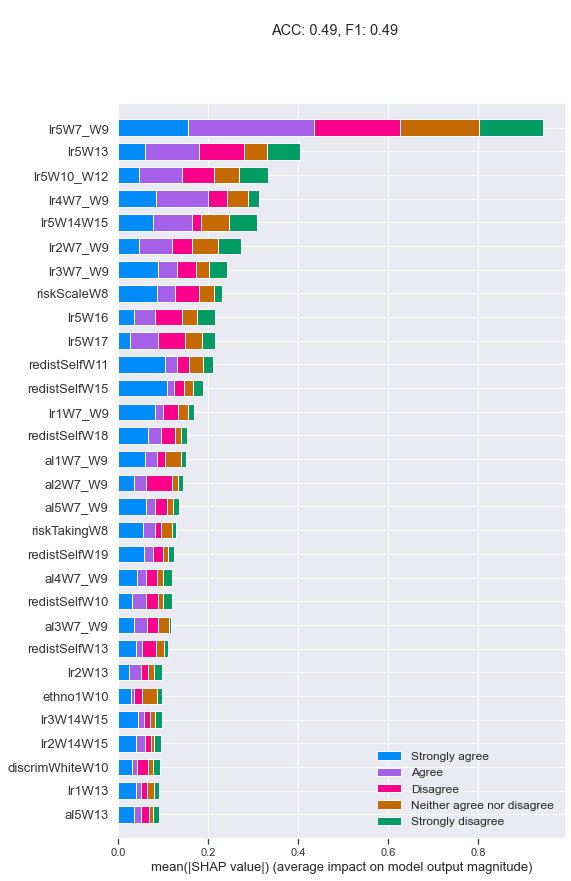

********


Strongly disagree             0.069447
Disagree                      0.110095
Neither agree nor disagree    0.254587
Agree                         0.341833
Strongly agree                0.224039
dtype: float64

err_dist: 0.0025028797620572757
0.6121630815559084
---mlogloss---
Ran in 255.4508 seconds
*******************  al1W1_W5  *********************
ACC: 0.40,  F1: 0.40


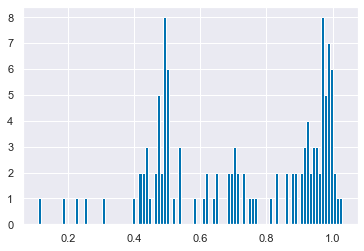

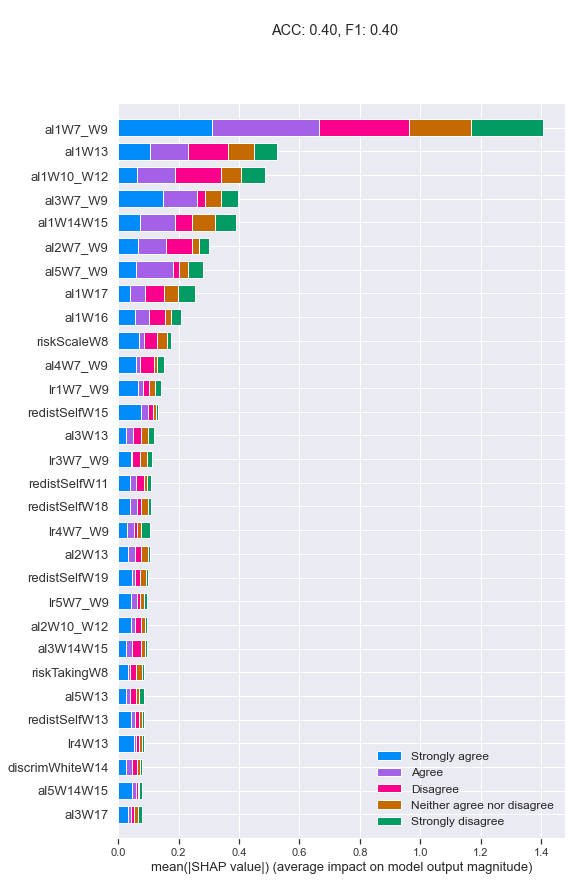

********


Strongly disagree             0.097258
Disagree                      0.117325
Neither agree nor disagree    0.193021
Agree                         0.339964
Strongly agree                0.252431
dtype: float64

err_dist: 0.0014423682533203483
0.6016219746546464
---mlogloss---
Ran in 182.0994 seconds
*******************  al2W1_W5  *********************
ACC: 0.45,  F1: 0.45


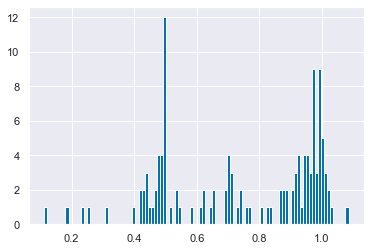

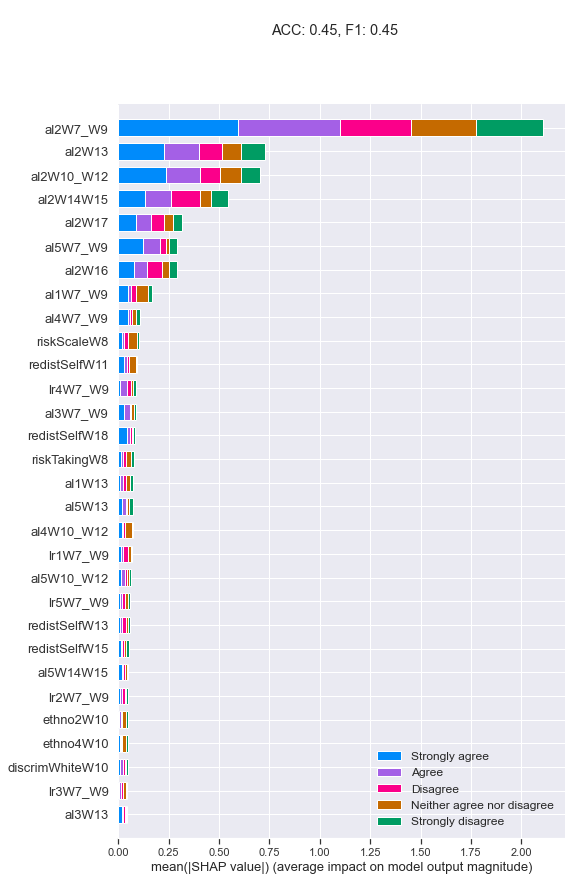

********


Strongly disagree             0.213302
Disagree                      0.156330
Neither agree nor disagree    0.173772
Agree                         0.235705
Strongly agree                0.220892
dtype: float64

err_dist: 0.0015955648966468681
0.6579022916718398
---mlogloss---
Ran in 139.4813 seconds
*******************  al3W1_W5  *********************
ACC: 0.42,  F1: 0.42


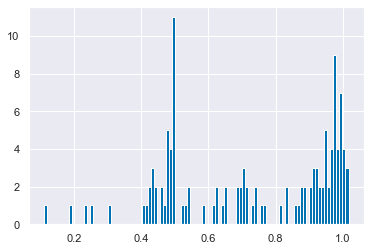

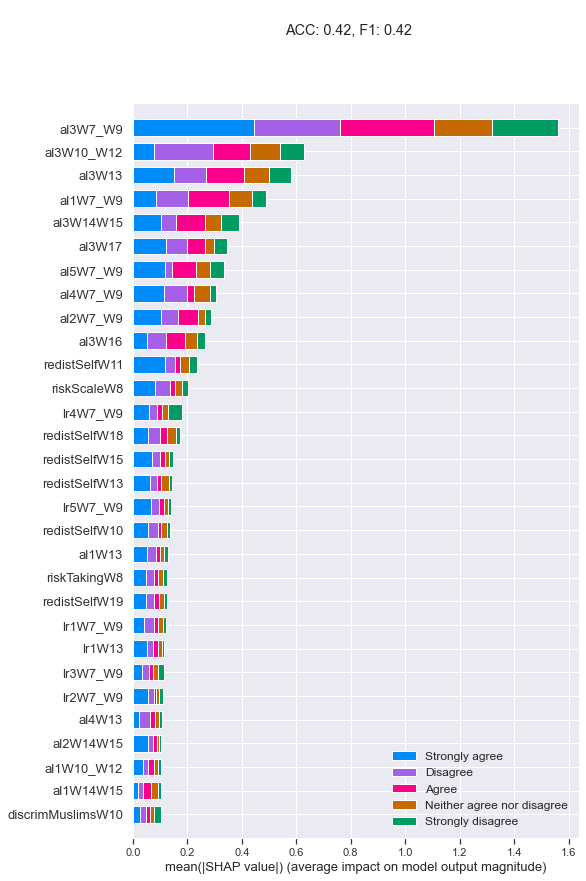

********


Strongly disagree             0.030126
Disagree                      0.136437
Neither agree nor disagree    0.197435
Agree                         0.380180
Strongly agree                0.255822
dtype: float64

err_dist: 0.0019134129463869627
0.6577383155266613
---mlogloss---
Ran in 300.2095 seconds
*******************  al4W1_W5  *********************
ACC: 0.39,  F1: 0.39


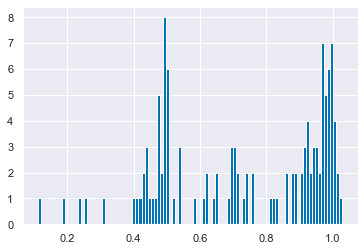

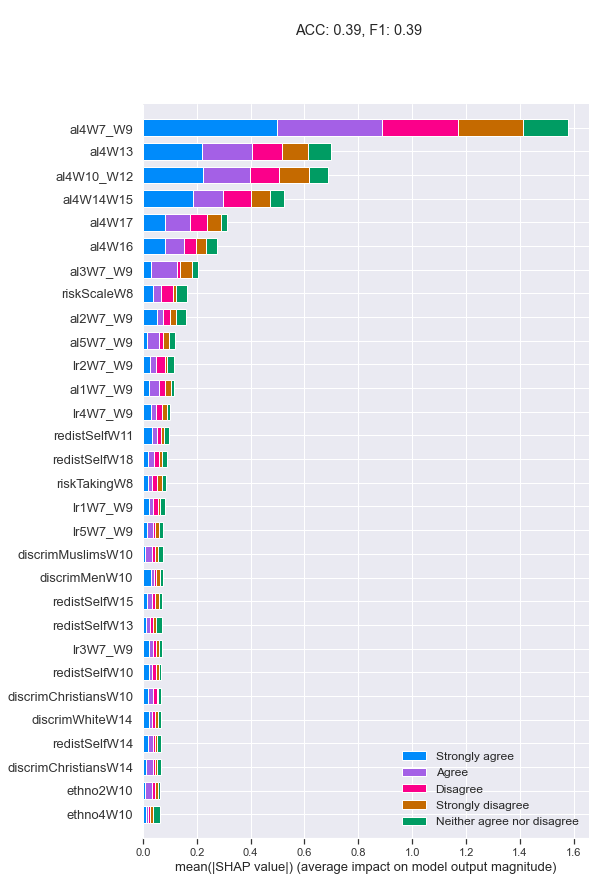

********


Strongly disagree             0.165541
Disagree                      0.195279
Neither agree nor disagree    0.203617
Agree                         0.244760
Strongly agree                0.190802
dtype: float64

err_dist: 0.004143203437520985
0.6278511532526723
---mlogloss---
Ran in 205.2677 seconds
*******************  al5W1_W5  *********************
ACC: 0.41,  F1: 0.41


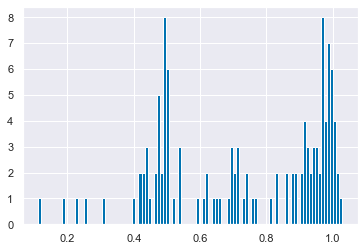

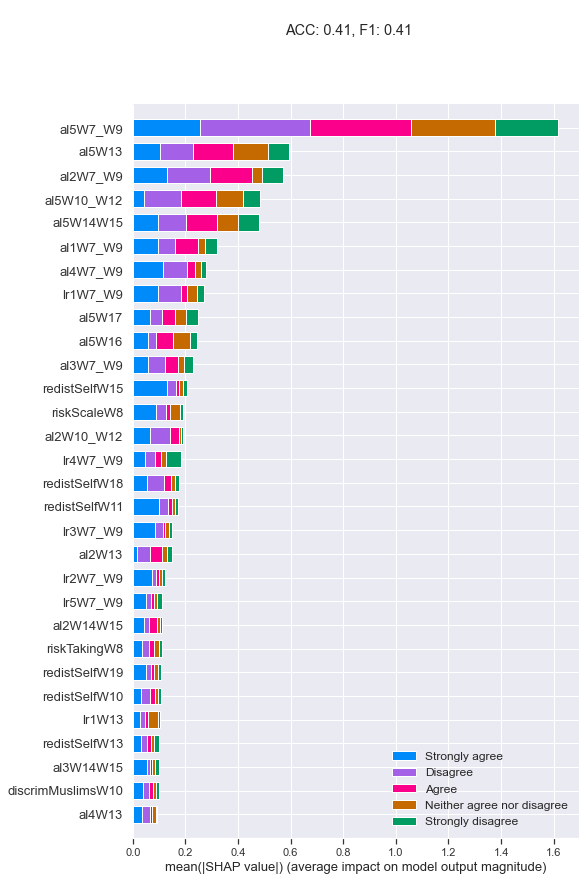

********


Strongly disagree             0.059857
Disagree                      0.068499
Neither agree nor disagree    0.227163
Agree                         0.373456
Strongly agree                0.271026
dtype: float64

err_dist: 0.0009186074412418681
0.6209223379475185
---mlogloss---
Ran in 212.7277 seconds
*******************  riskTakingW1_W5  *********************
ACC: 0.43,  F1: 0.43


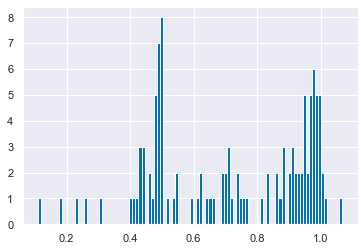

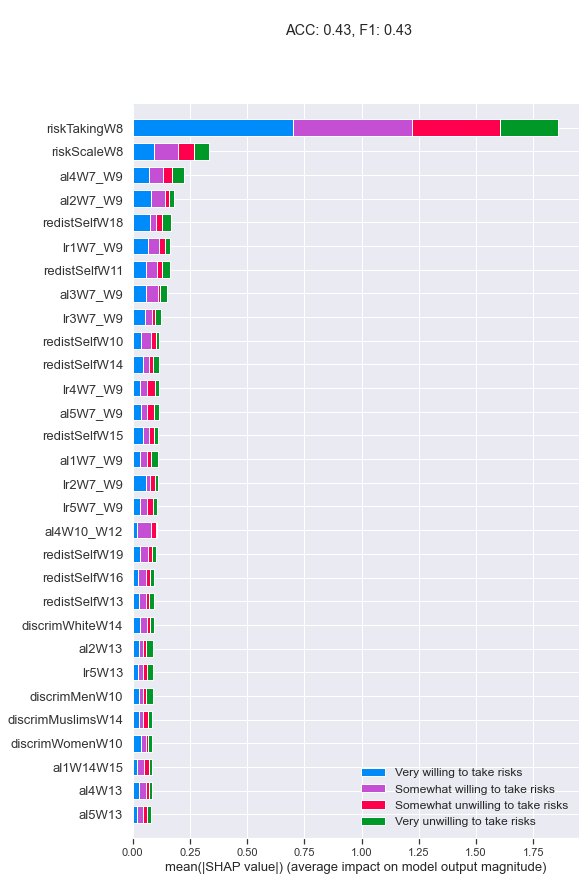

********


Very unwilling to take risks        0.083347
Somewhat unwilling to take risks    0.281235
Somewhat willing to take risks      0.556191
Very willing to take risks          0.079228
dtype: float64

err_dist: 0.001583630116163027
0.6628924483524902
---mlogloss---
Ran in 304.0543 seconds
*******************  lr1W14W15  *********************
ACC: 0.54,  F1: 0.54


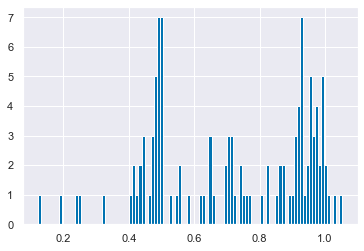

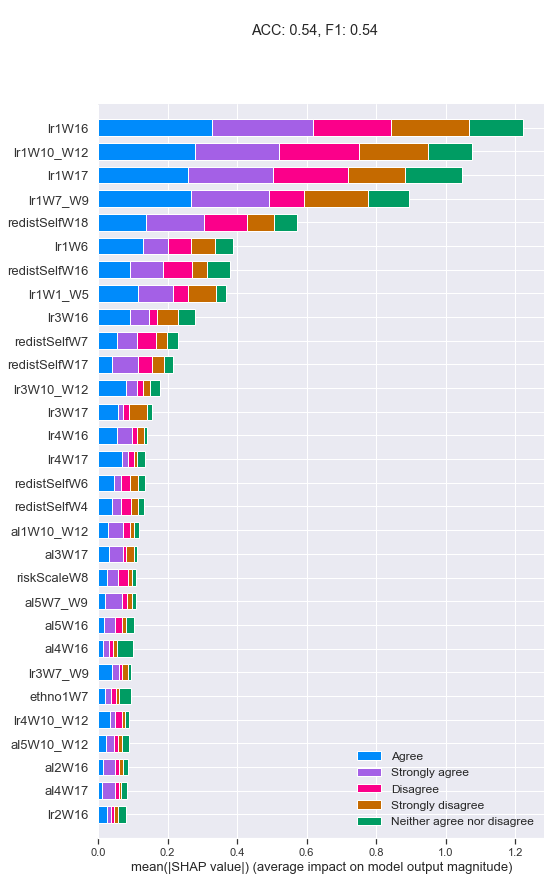

********


Strongly disagree             0.088516
Disagree                      0.149397
Neither agree nor disagree    0.234760
Agree                         0.315464
Strongly agree                0.211862
dtype: float64

err_dist: 0.001121547291035667
0.7039205668862785
---mlogloss---
Ran in 155.2992 seconds
*******************  lr2W14W15  *********************
ACC: 0.53,  F1: 0.53


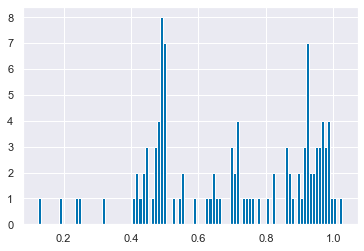

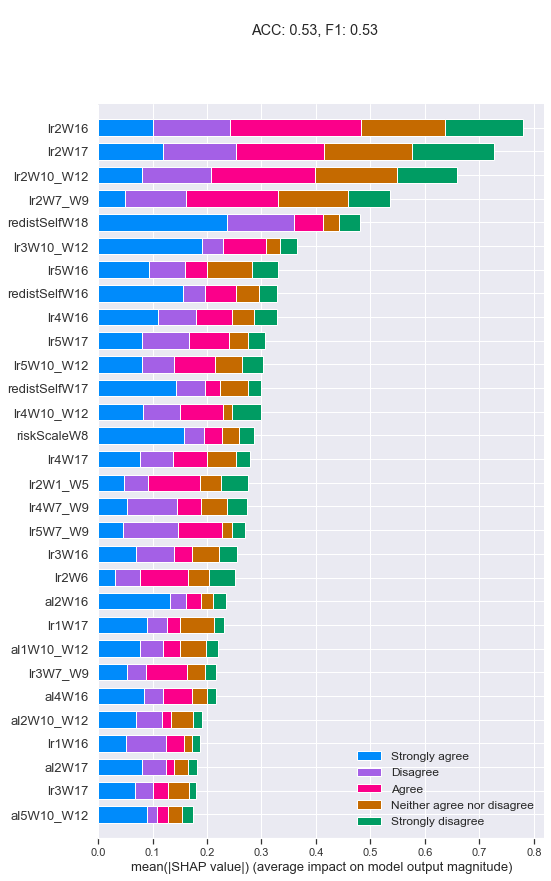

********


Strongly disagree             0.038566
Disagree                      0.102816
Neither agree nor disagree    0.183108
Agree                         0.362880
Strongly agree                0.312630
dtype: float64

err_dist: 0.002133275624517101
0.6440426064477671
---mlogloss---
Ran in 263.9701 seconds
*******************  lr3W14W15  *********************
ACC: 0.57,  F1: 0.57


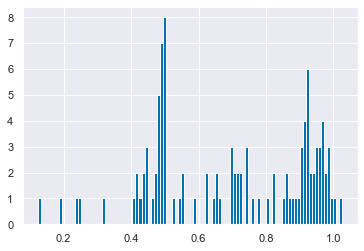

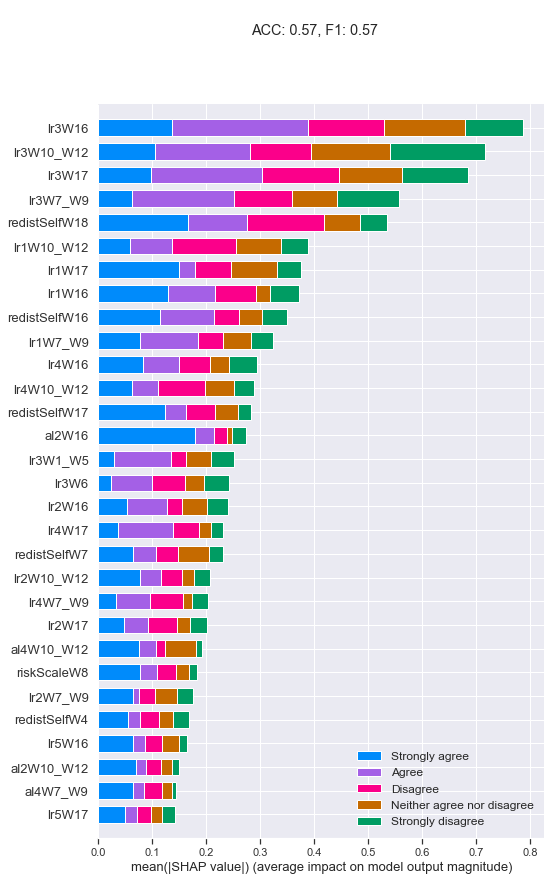

********


Strongly disagree             0.017971
Disagree                      0.121108
Neither agree nor disagree    0.168111
Agree                         0.401277
Strongly agree                0.291533
dtype: float64

err_dist: 0.0007716602045425761
0.7560633656324609
---mlogloss---
Ran in 226.5135 seconds
*******************  lr4W14W15  *********************
ACC: 0.55,  F1: 0.55


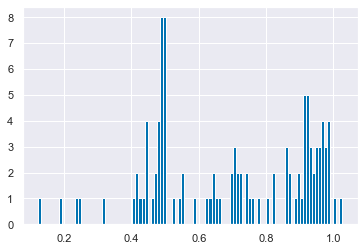

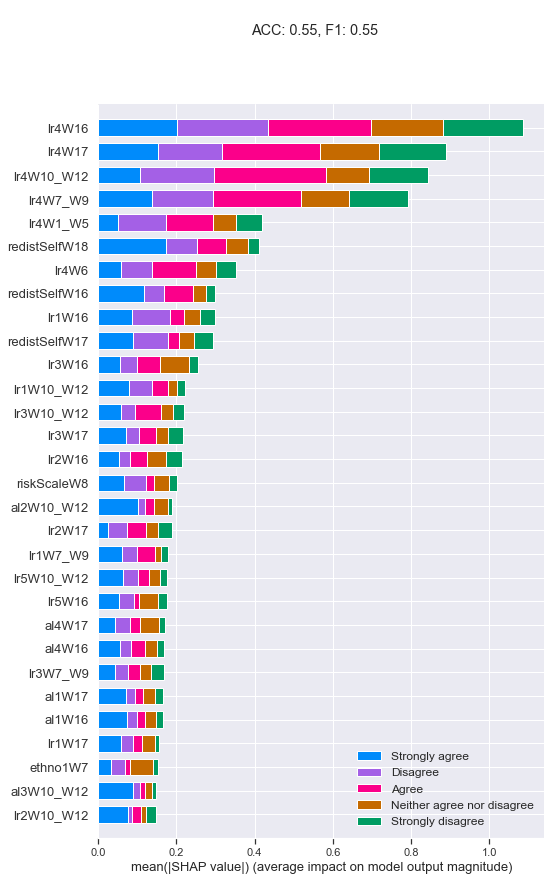

********


Strongly disagree             0.058726
Disagree                      0.129301
Neither agree nor disagree    0.148646
Agree                         0.345952
Strongly agree                0.317375
dtype: float64

err_dist: 0.000818728950802018
0.6624578370843921
---mlogloss---
Ran in 245.2802 seconds
*******************  lr5W14W15  *********************
ACC: 0.50,  F1: 0.50


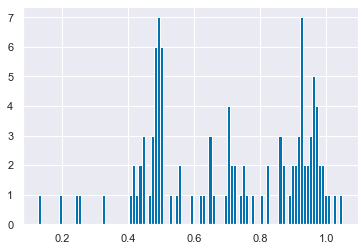

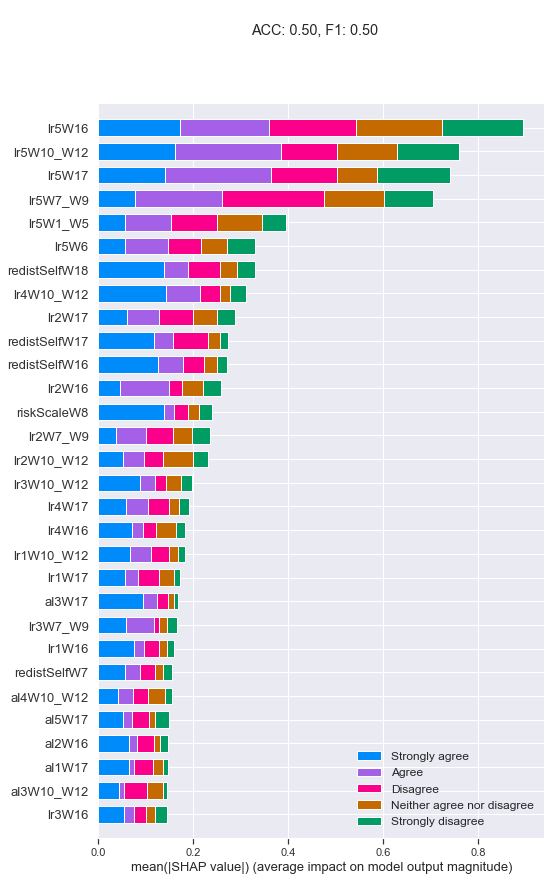

********


Strongly disagree             0.051078
Disagree                      0.173428
Neither agree nor disagree    0.200976
Agree                         0.320710
Strongly agree                0.253808
dtype: float64

err_dist: 0.0035595611850346093
0.6374663987156141
---mlogloss---
Ran in 255.7753 seconds
*******************  al1W14W15  *********************
ACC: 0.54,  F1: 0.54


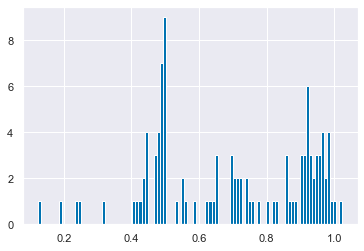

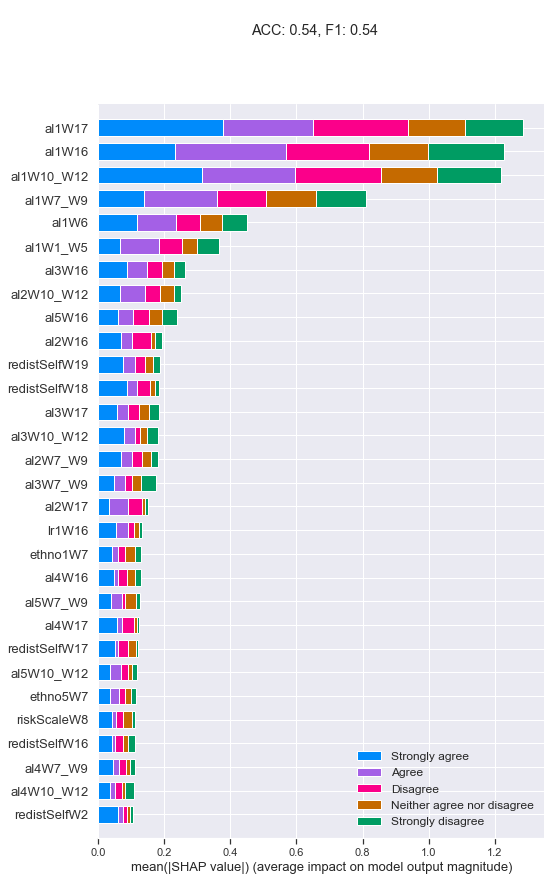

********


Strongly disagree             0.117426
Disagree                      0.153497
Neither agree nor disagree    0.193467
Agree                         0.304783
Strongly agree                0.230827
dtype: float64

err_dist: 0.003029306273563669
0.6499164497637906
---mlogloss---
Ran in 168.5433 seconds
*******************  al2W14W15  *********************
ACC: 0.61,  F1: 0.61


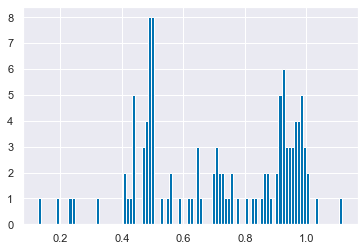

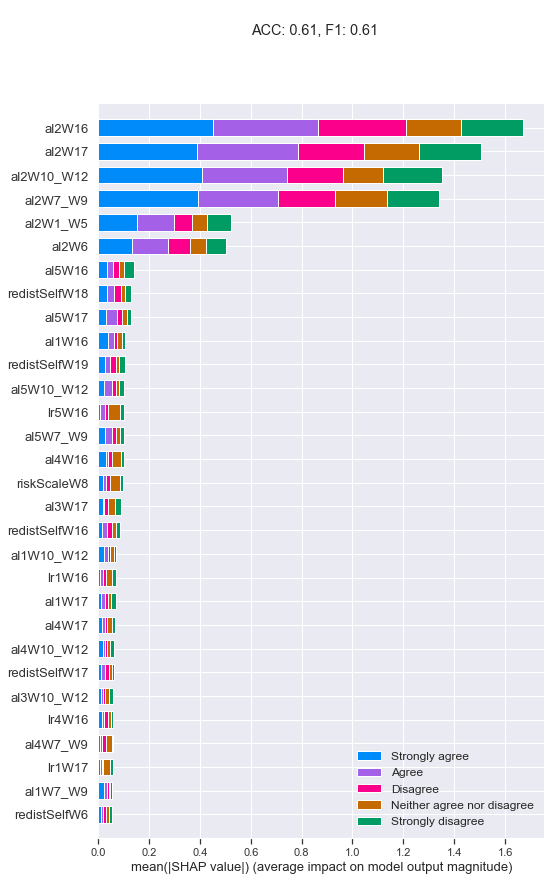

********


Strongly disagree             0.245934
Disagree                      0.192043
Neither agree nor disagree    0.141084
Agree                         0.225139
Strongly agree                0.195800
dtype: float64

err_dist: 0.0014478003303918386
0.6992896430026958
---mlogloss---
Ran in 114.3273 seconds
*******************  al3W14W15  *********************
ACC: 0.55,  F1: 0.55


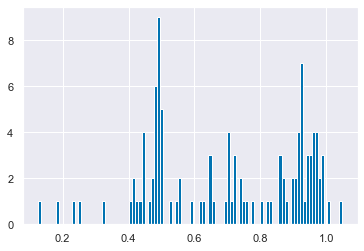

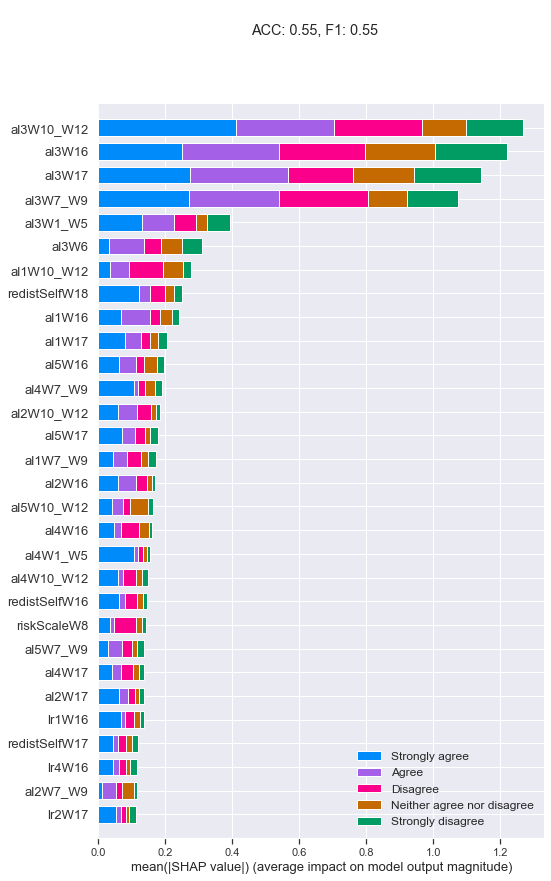

********


Strongly disagree             0.057060
Disagree                      0.167052
Neither agree nor disagree    0.193647
Agree                         0.360667
Strongly agree                0.221574
dtype: float64

err_dist: 0.002415255407885667
0.6782660231695352
---mlogloss---
Ran in 179.9003 seconds
*******************  al4W14W15  *********************
ACC: 0.50,  F1: 0.50


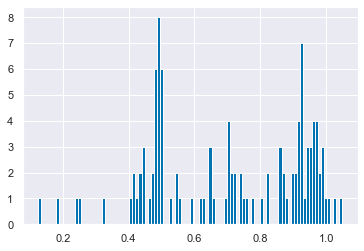

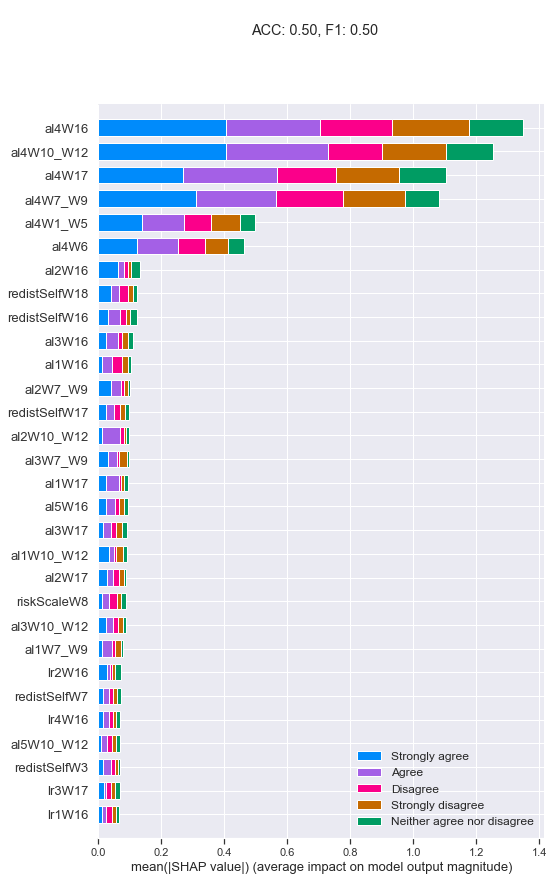

********


Strongly disagree             0.186780
Disagree                      0.214706
Neither agree nor disagree    0.211492
Agree                         0.269540
Strongly agree                0.117481
dtype: float64

err_dist: 0.002749290535903526
0.6358308709905759
---mlogloss---
Ran in 143.8060 seconds
*******************  al5W14W15  *********************
ACC: 0.57,  F1: 0.57


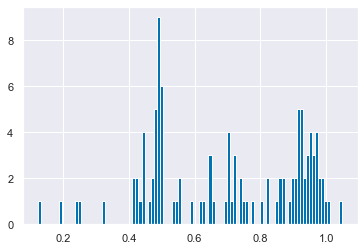

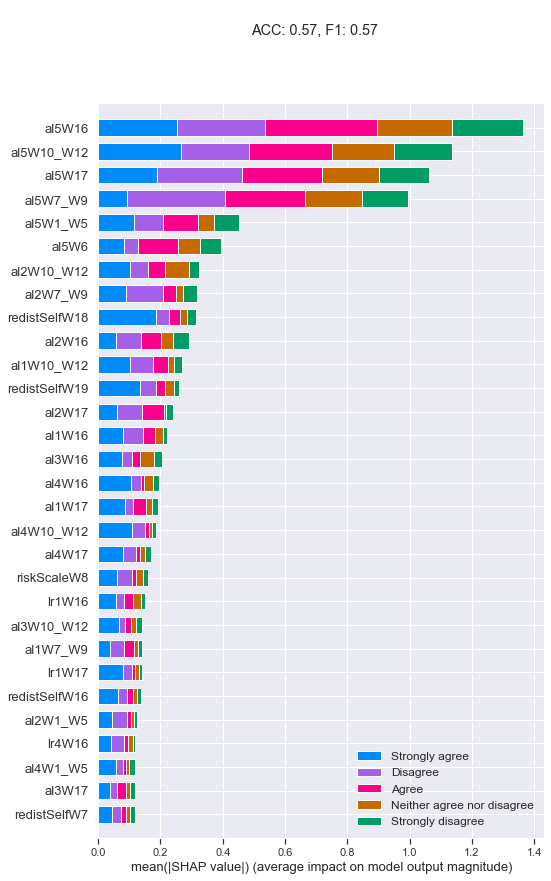

********


Strongly disagree             0.054981
Disagree                      0.132775
Neither agree nor disagree    0.220769
Agree                         0.339128
Strongly agree                0.252347
dtype: float64

err_dist: 0.0019407555844444496
0.634390717565273
---mlogloss---
Ran in 179.3886 seconds
*******************  lr1W7_W9  *********************
ACC: 0.49,  F1: 0.49


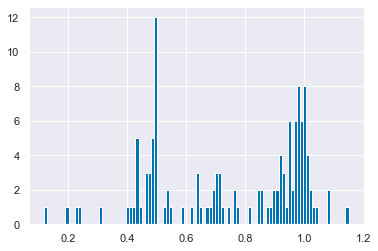

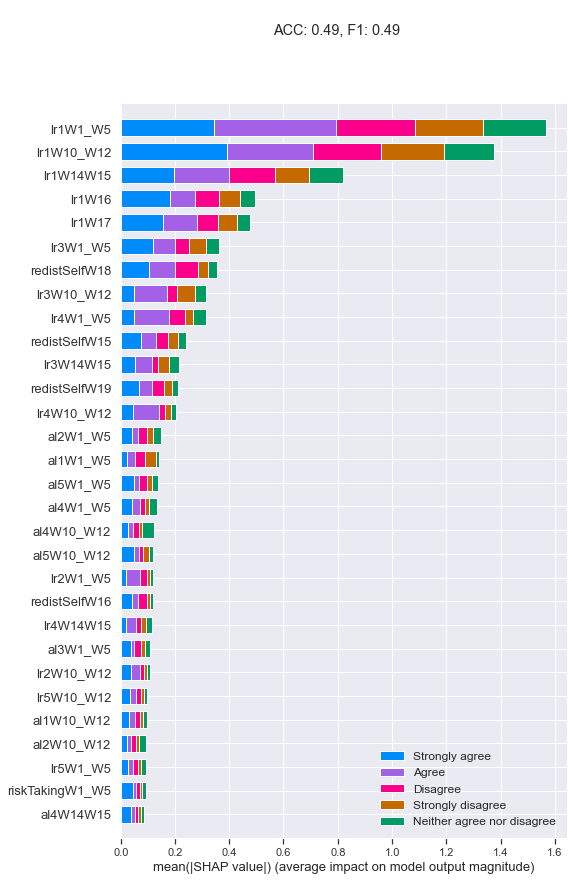

********


Strongly disagree             0.071773
Disagree                      0.160393
Neither agree nor disagree    0.223980
Agree                         0.305898
Strongly agree                0.237956
dtype: float64

err_dist: 0.0008073724922498856
0.6493193880654864
---mlogloss---
Ran in 168.7362 seconds
*******************  lr2W7_W9  *********************
ACC: 0.52,  F1: 0.52


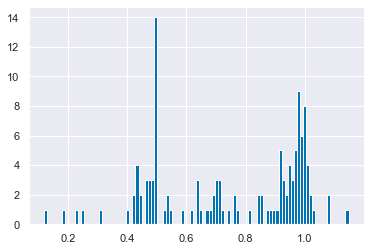

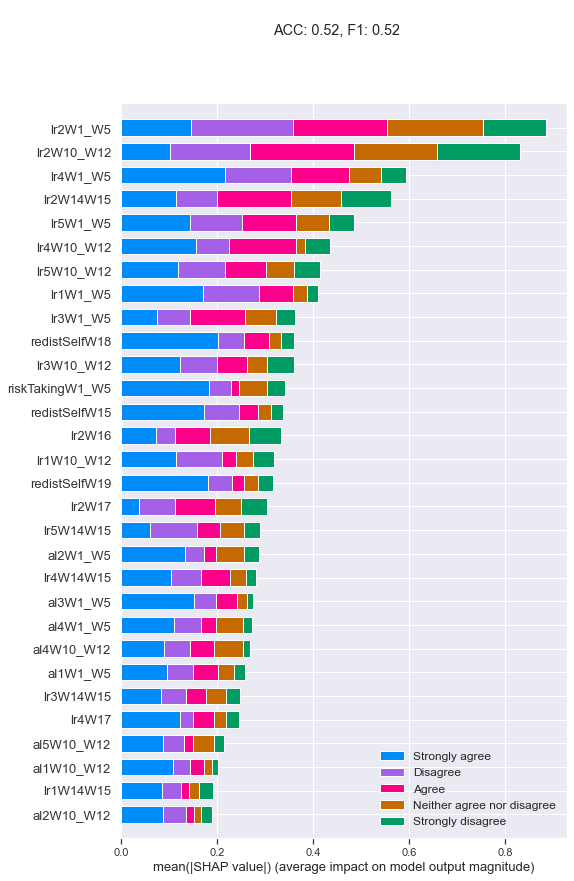

********


Strongly disagree             0.043156
Disagree                      0.110121
Neither agree nor disagree    0.180141
Agree                         0.387164
Strongly agree                0.279418
dtype: float64

err_dist: 0.0021306189589824403
0.5974696863527884
---mlogloss---
Ran in 277.8112 seconds
*******************  lr3W7_W9  *********************
ACC: 0.57,  F1: 0.57


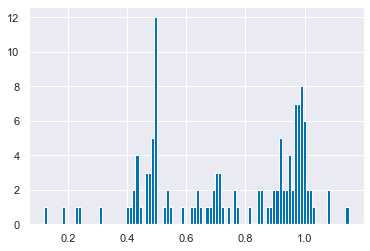

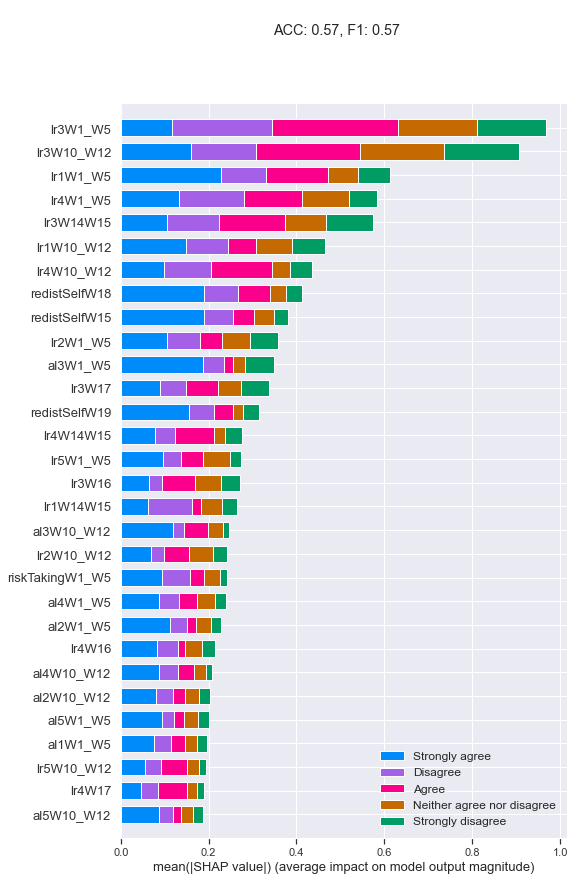

********


Strongly disagree             0.017592
Disagree                      0.121290
Neither agree nor disagree    0.171533
Agree                         0.411667
Strongly agree                0.277918
dtype: float64

err_dist: 0.0004073129768296955
0.7204149967064415
---mlogloss---
Ran in 294.8089 seconds
*******************  lr4W7_W9  *********************
ACC: 0.53,  F1: 0.53


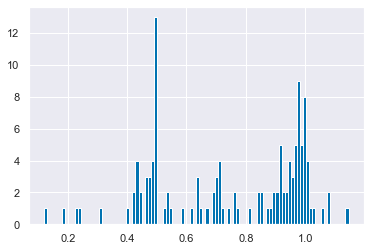

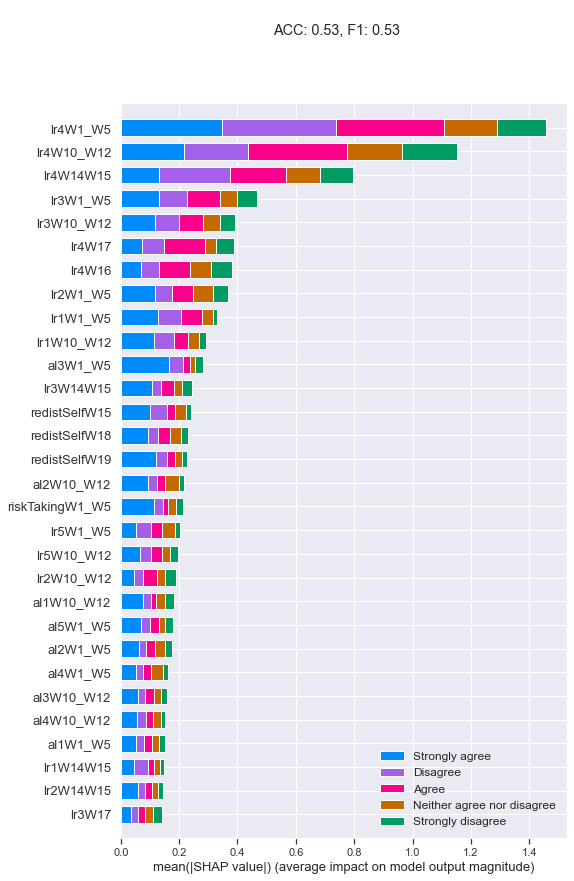

********


Strongly disagree             0.074450
Disagree                      0.125899
Neither agree nor disagree    0.150078
Agree                         0.356590
Strongly agree                0.292984
dtype: float64

err_dist: 0.001716399962713027
0.6119982275533411
---mlogloss---
Ran in 222.1394 seconds
*******************  lr5W7_W9  *********************
ACC: 0.50,  F1: 0.50


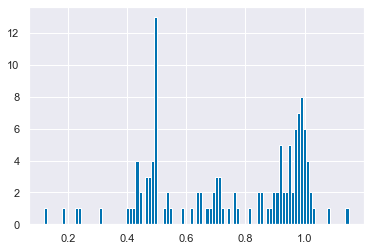

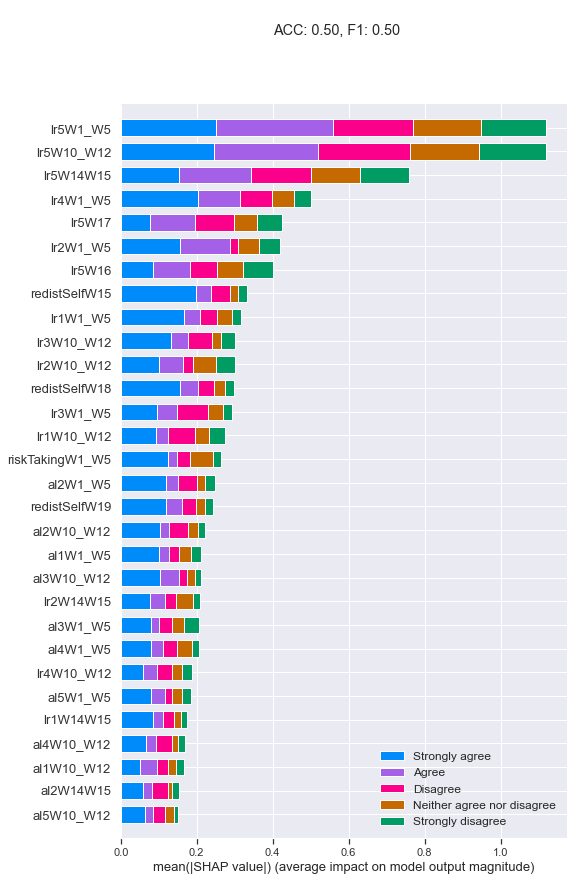

********


Strongly disagree             0.050302
Disagree                      0.150007
Neither agree nor disagree    0.203007
Agree                         0.364571
Strongly agree                0.232113
dtype: float64

err_dist: 0.00199829168375719
0.6101471643863653
---mlogloss---
Ran in 291.9523 seconds
*******************  al1W7_W9  *********************
ACC: 0.52,  F1: 0.52


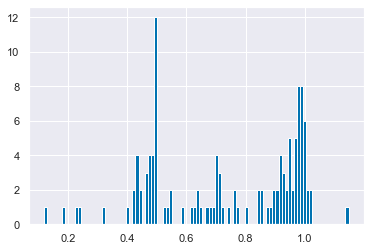

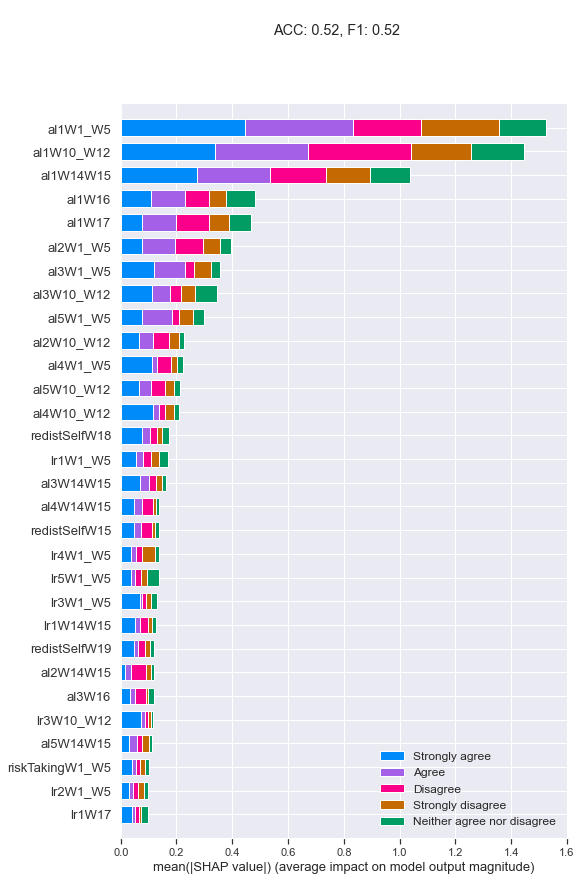

********


Strongly disagree             0.095593
Disagree                      0.163029
Neither agree nor disagree    0.196621
Agree                         0.314918
Strongly agree                0.229839
dtype: float64

err_dist: 0.0025321341310586398
0.6039635050355722
---mlogloss---
Ran in 168.5888 seconds
*******************  al2W7_W9  *********************
ACC: 0.59,  F1: 0.59


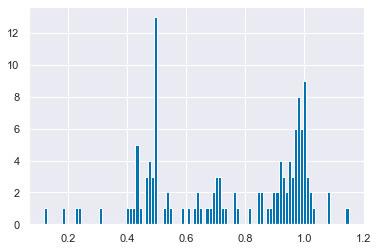

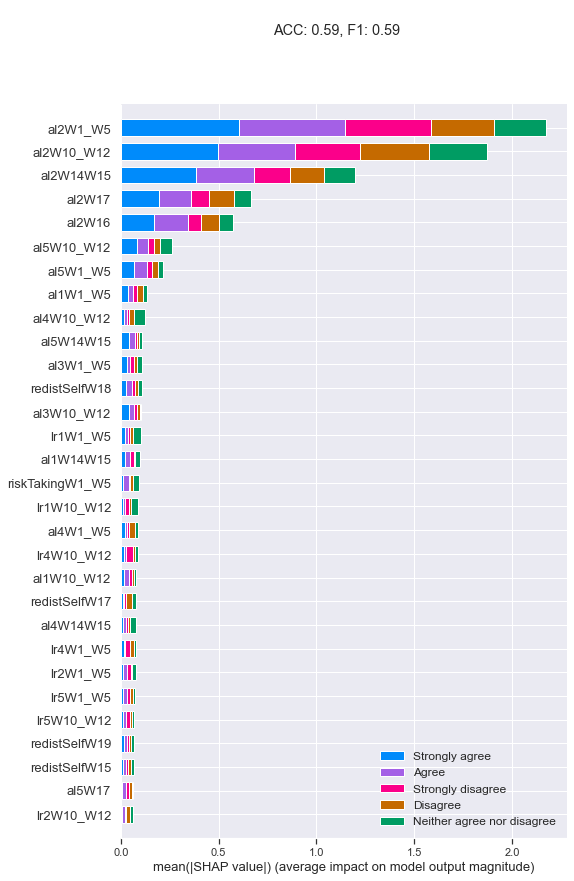

********


Strongly disagree             0.253085
Disagree                      0.165788
Neither agree nor disagree    0.144576
Agree                         0.229287
Strongly agree                0.207264
dtype: float64

err_dist: 0.00038764797689577236
0.6758557020149569
---mlogloss---
Ran in 119.0933 seconds
*******************  al3W7_W9  *********************
ACC: 0.52,  F1: 0.52


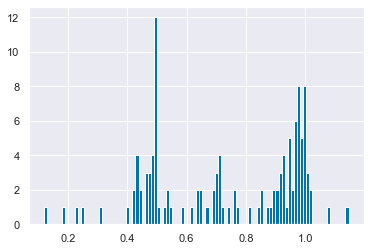

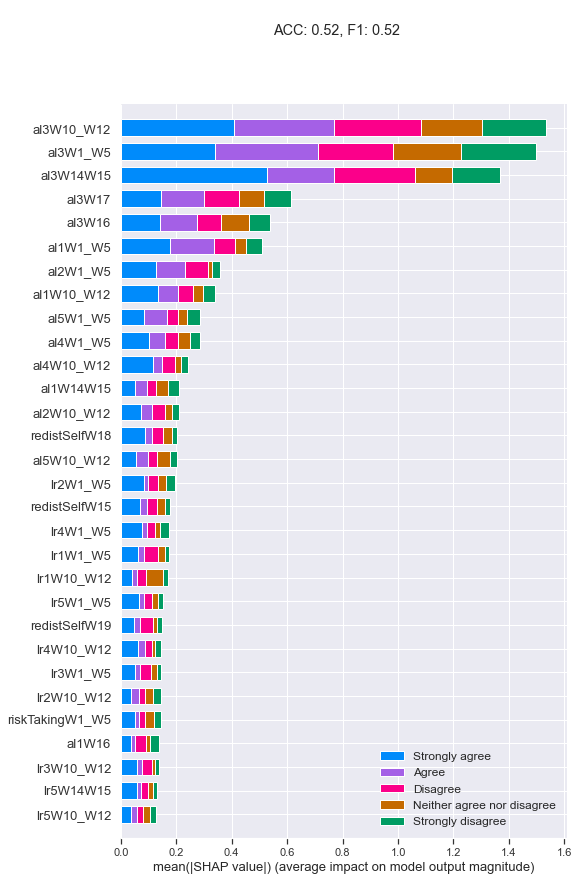

********


Strongly disagree             0.084689
Disagree                      0.137628
Neither agree nor disagree    0.192225
Agree                         0.373206
Strongly agree                0.212252
dtype: float64

err_dist: 0.0019234720923255962
0.6293214697801158
---mlogloss---
Ran in 247.6321 seconds
*******************  al4W7_W9  *********************
ACC: 0.49,  F1: 0.49


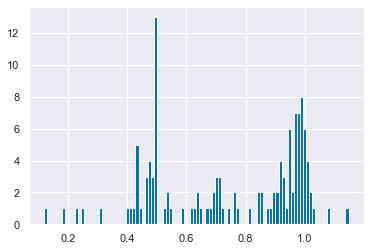

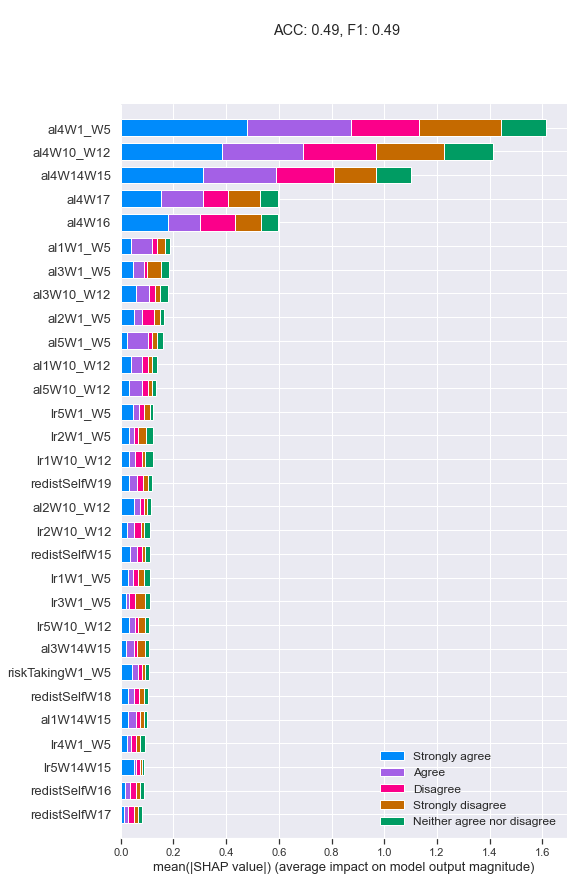

********


Strongly disagree             0.178220
Disagree                      0.204584
Neither agree nor disagree    0.197119
Agree                         0.300166
Strongly agree                0.119910
dtype: float64

err_dist: 0.0017984849193140515
0.6186285757959326
---mlogloss---
Ran in 178.6384 seconds
*******************  al5W7_W9  *********************
ACC: 0.54,  F1: 0.54


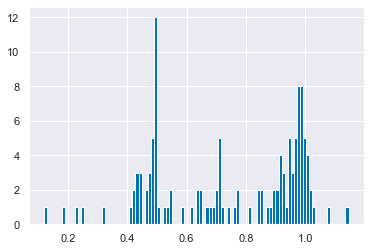

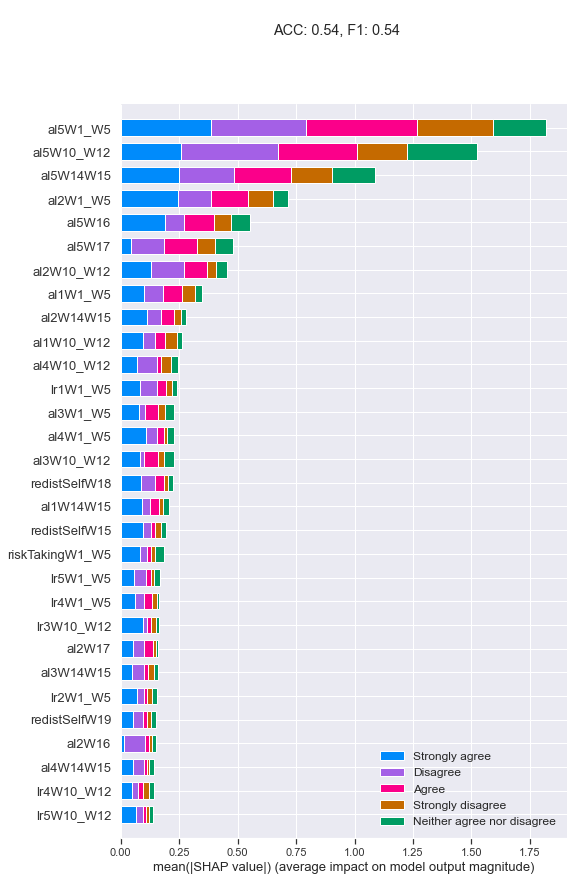

********


Strongly disagree             0.067454
Disagree                      0.104628
Neither agree nor disagree    0.230296
Agree                         0.349902
Strongly agree                0.247720
dtype: float64

err_dist: 0.0009682950784634618
0.62156261883661
---mlogloss---
Ran in 209.6227 seconds
*******************  lr1W10_W12  *********************
ACC: 0.53,  F1: 0.53


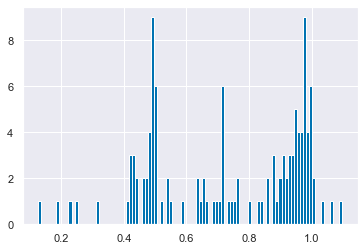

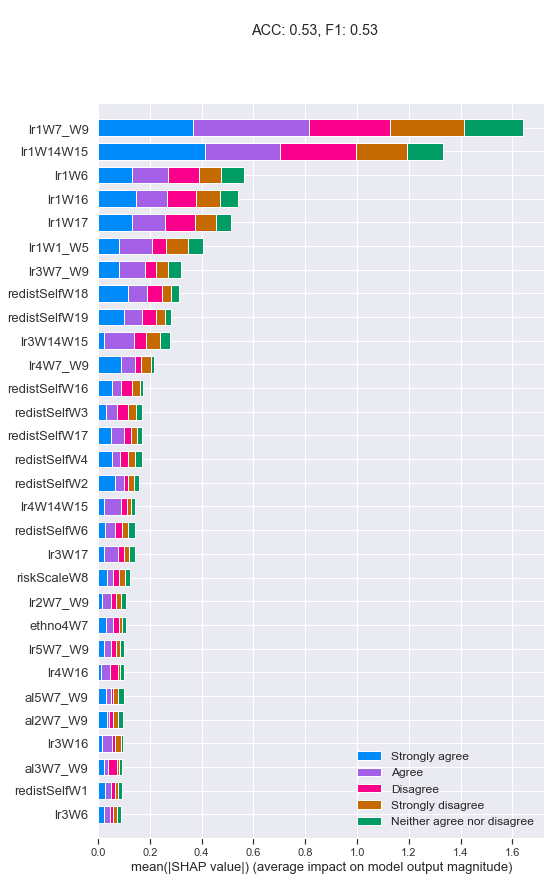

********


Strongly disagree             0.080863
Disagree                      0.165749
Neither agree nor disagree    0.228990
Agree                         0.329325
Strongly agree                0.195073
dtype: float64

err_dist: 0.00034987407857899375
0.7214790236374067
---mlogloss---
Ran in 153.9971 seconds
*******************  lr2W10_W12  *********************
ACC: 0.52,  F1: 0.52


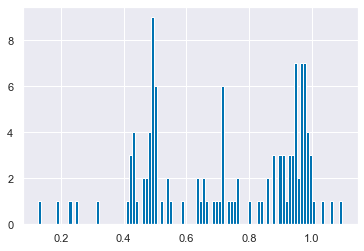

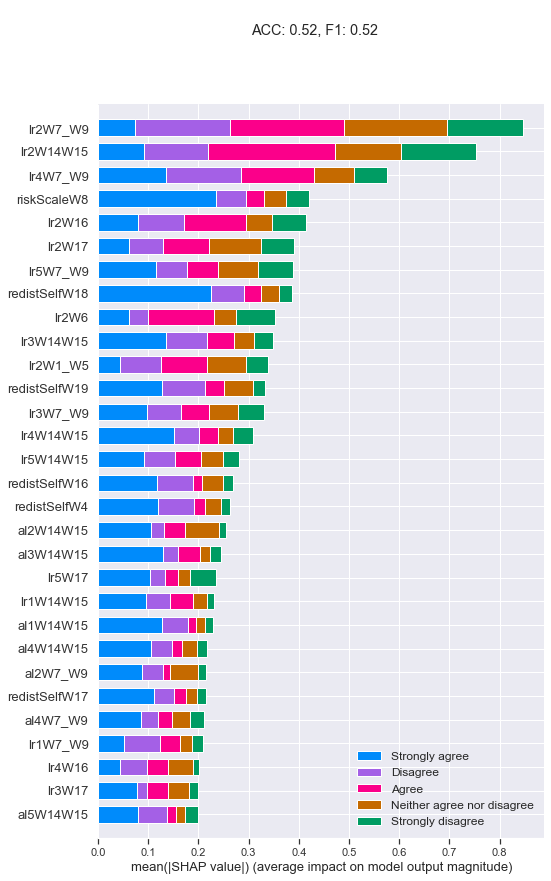

********


Strongly disagree             0.036821
Disagree                      0.084714
Neither agree nor disagree    0.195627
Agree                         0.393940
Strongly agree                0.288898
dtype: float64

err_dist: 0.0021249733007673386
0.6535558121381505
---mlogloss---
Ran in 264.3622 seconds
*******************  lr3W10_W12  *********************
ACC: 0.51,  F1: 0.51


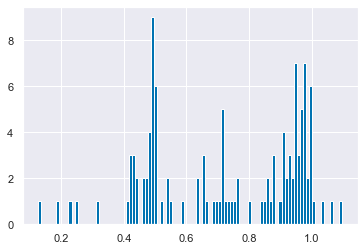

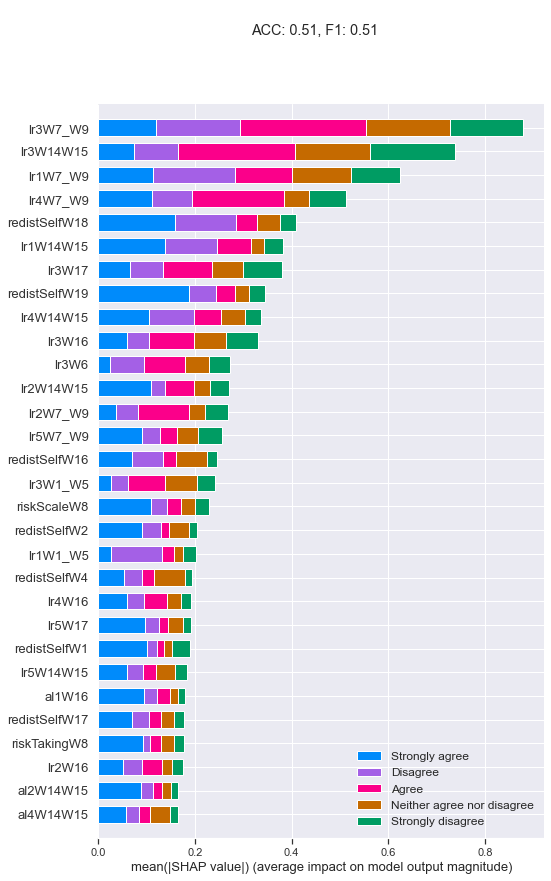

********


Strongly disagree             0.063295
Disagree                      0.106460
Neither agree nor disagree    0.199913
Agree                         0.383777
Strongly agree                0.246554
dtype: float64

err_dist: 0.0017869407509277491
0.6572748773768732
---mlogloss---
Ran in 236.0773 seconds
*******************  lr4W10_W12  *********************
ACC: 0.52,  F1: 0.52


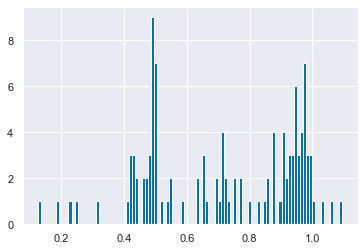

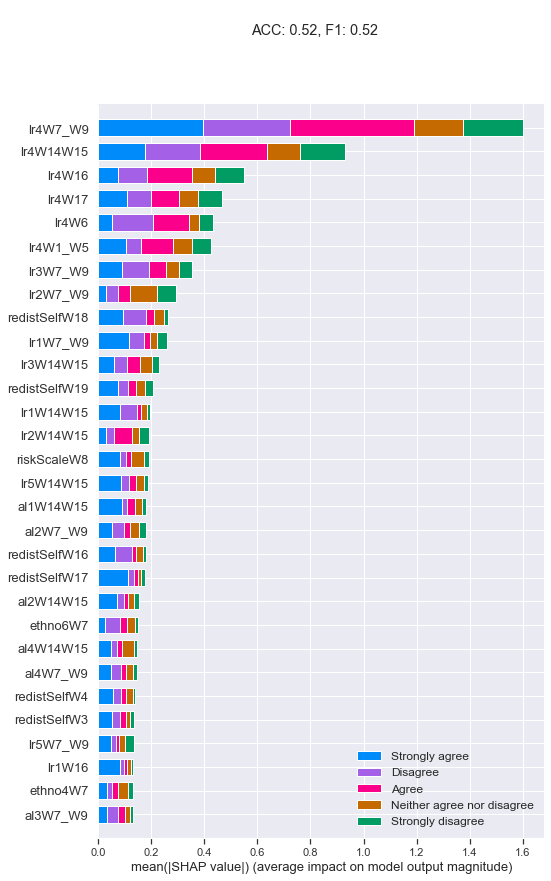

********


Strongly disagree             0.062541
Disagree                      0.124754
Neither agree nor disagree    0.161394
Agree                         0.343296
Strongly agree                0.308016
dtype: float64

err_dist: 0.0019195673289036552
0.6370246512885458
---mlogloss---
Ran in 182.6071 seconds
*******************  lr5W10_W12  *********************
ACC: 0.49,  F1: 0.49


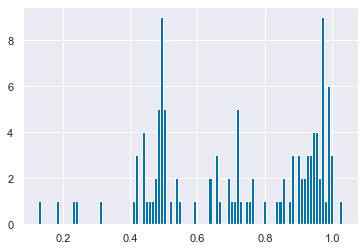

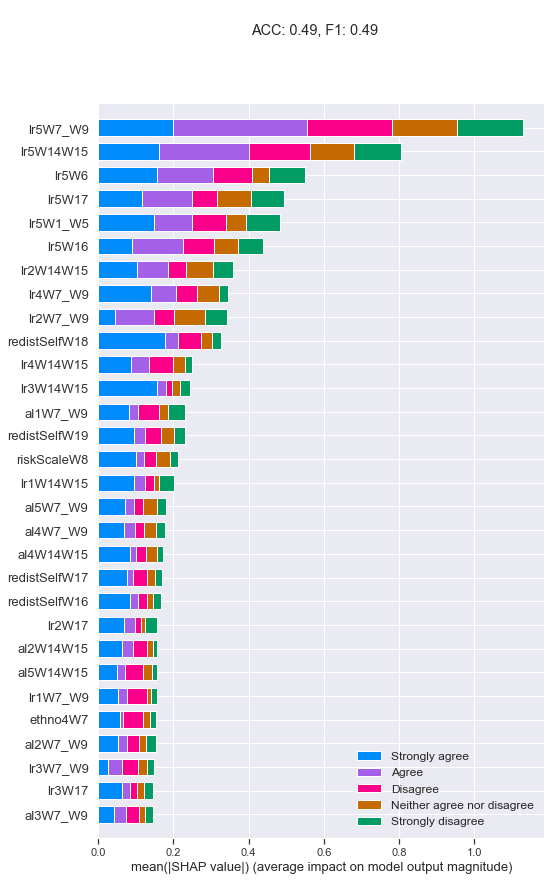

********


Strongly disagree             0.018430
Disagree                      0.151275
Neither agree nor disagree    0.227044
Agree                         0.379064
Strongly agree                0.224187
dtype: float64

err_dist: 0.0022985928212823996
0.7290347118935518
---mlogloss---
Ran in 229.4073 seconds
*******************  al1W10_W12  *********************
ACC: 0.52,  F1: 0.52


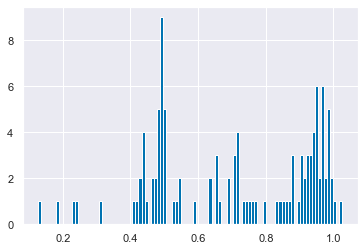

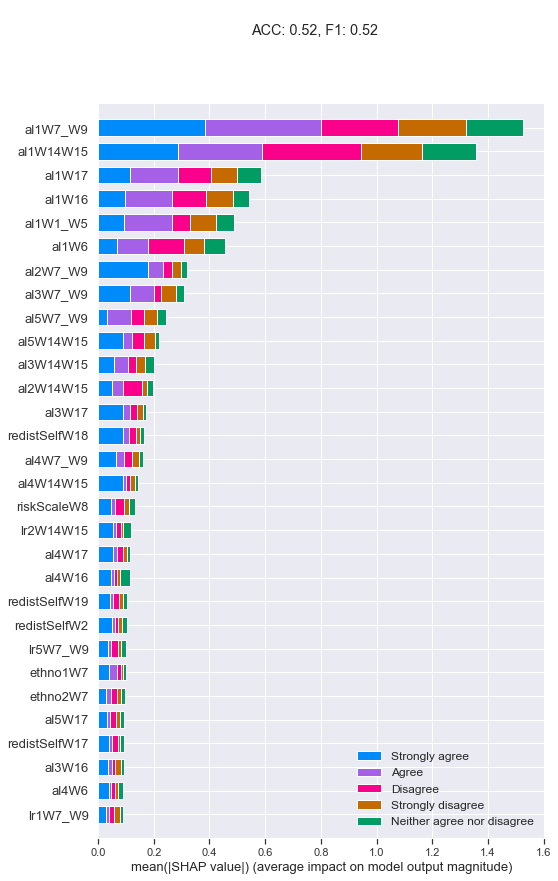

********


Strongly disagree             0.108354
Disagree                      0.142220
Neither agree nor disagree    0.212593
Agree                         0.304519
Strongly agree                0.232314
dtype: float64

err_dist: 0.0026056531725741476
0.6365700875838533
---mlogloss---
Ran in 133.4613 seconds
*******************  al2W10_W12  *********************
ACC: 0.58,  F1: 0.58


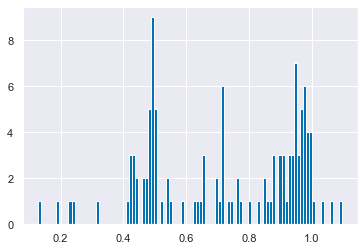

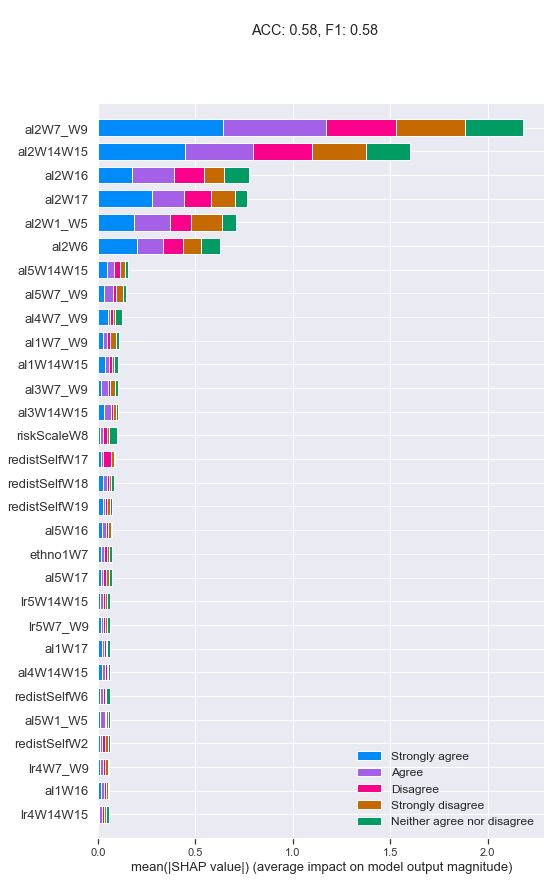

********


Strongly disagree             0.233114
Disagree                      0.202558
Neither agree nor disagree    0.143927
Agree                         0.218045
Strongly agree                0.202356
dtype: float64

err_dist: 0.001159256779226697
0.6988578999787078
---mlogloss---
Ran in 106.8660 seconds
*******************  al3W10_W12  *********************
ACC: 0.52,  F1: 0.52


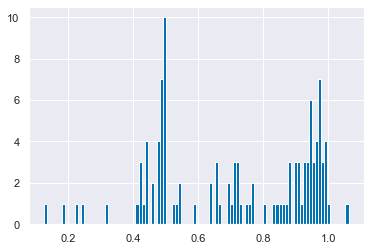

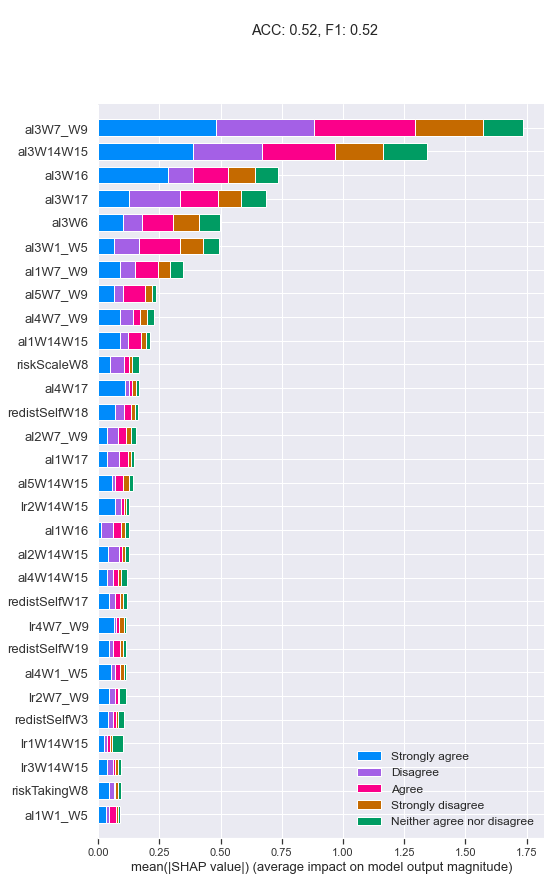

********


Strongly disagree             0.048523
Disagree                      0.172254
Neither agree nor disagree    0.183973
Agree                         0.368935
Strongly agree                0.226315
dtype: float64

err_dist: 0.002403614901212011
0.6811381401150116
---mlogloss---
Ran in 147.7805 seconds
*******************  al4W10_W12  *********************
ACC: 0.50,  F1: 0.50


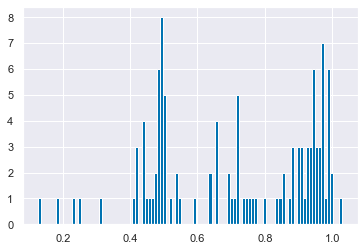

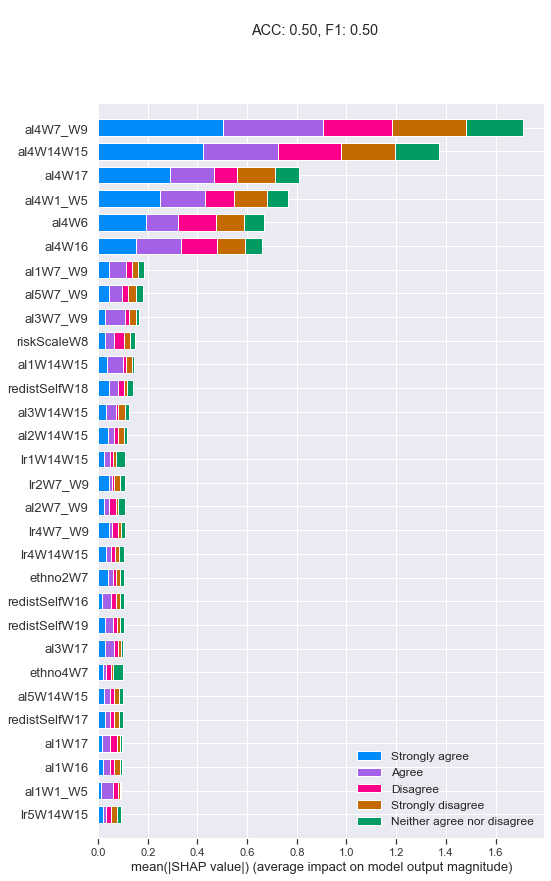

********


Strongly disagree             0.178977
Disagree                      0.207323
Neither agree nor disagree    0.230322
Agree                         0.268038
Strongly agree                0.115340
dtype: float64

err_dist: 0.0024935182280338146
0.6803717228347471
---mlogloss---
Ran in 179.1049 seconds
*******************  al5W10_W12  *********************
ACC: 0.54,  F1: 0.54


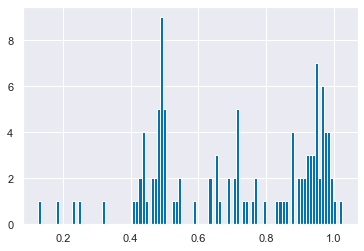

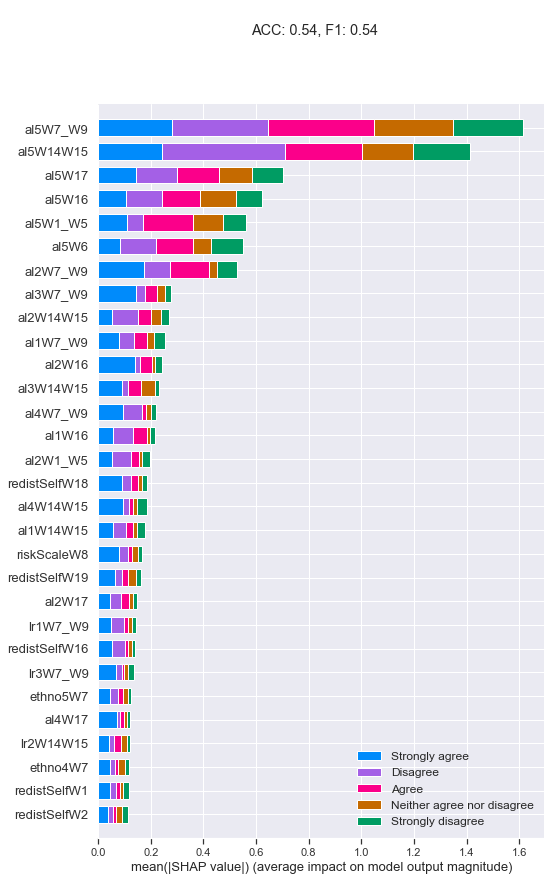

********


Strongly disagree             0.055818
Disagree                      0.122107
Neither agree nor disagree    0.226715
Agree                         0.348012
Strongly agree                0.247347
dtype: float64

err_dist: 0.0012023103957886693
0.6476334583476954
---mlogloss---
Ran in 170.1210 seconds
*******************  zeroSumIRTW14  *********************
MSE: 0.71, MAE: 0.66, EV: 0.06, R2: 0.06


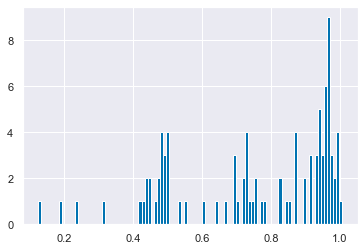

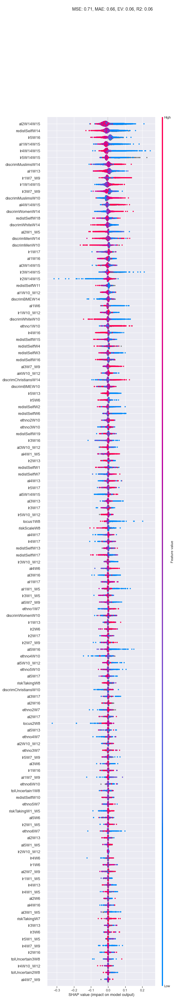

********


-1.0    0.000314
 0.0    0.983828
 1.0    0.015858
dtype: float64

err_dist: 0.0


ValueError: Classification metrics can't handle a mix of multiclass and continuous targets

In [17]:
xgb_params["sketch_eps"]=0.00
xgb_params["base_score"]=0.5
xgb_params["scale_pos_weight"]=None
for target_var in fuller_columns[137:]:
    print("*******************  "+target_var+"  *********************")
    descr = "new base"
#     xgb_params.update({'max_depth':7,'subsample':.6,'min_child_weight':3,'gamma':6,'reg_alpha':4,
#                       'reg_lambda':1.5,'learning_rate':0.065,'colsample_bytree':.99,
#                       'colsample_bylevel':.87,'colsample_bynode':.58})
    xgb_params.update({'max_depth':7,'subsample':.7,'min_child_weight':5,'gamma':.5,'reg_alpha':1,
                      'reg_lambda':.4,'learning_rate':0.065,'colsample_bytree':.99,
                      'colsample_bylevel':.87,'colsample_bynode':.58})    

    tic = time.perf_counter()

    count = max(len(results_df.index),results_df.index.max())

    df_pred,predictions,alg,target_var,metrics,err_dist = test_xgboost_multi(xgb_params,eval_metric = "mlogloss",
                                                                             target_var=target_var,coverage_thresh=.2)
    if df_pred is None:
        print("BAD VARIABLE:",target_var)
        continue
    balanced_acc = balanced_accuracy_score( predictions[df_simp[target_var].notnull()],
                                  df_simp[target_var][df_simp[target_var].notnull()])
    print( balanced_acc )
    print("---mlogloss---")
    toc = time.perf_counter()
    print(f"Ran in {toc - tic:0.4f} seconds")
    results_df.loc[count] = [descr,target_var,df_pred,predictions,alg,balanced_acc,metrics,err_dist,toc - tic]
    df_simp_imp.loc[df_simp[target_var].isnull(),target_var] = predictions[df_simp[target_var].isnull()]

In [24]:
df_simp_imp.to_pickle(BES_small_data_files + "imputed_data2"+".zip", compression='zip')
results_df.to_pickle(BES_small_data_files + "imputed_data2_df"+".zip", compression='zip')

MemoryError: 

In [30]:
results_df["df_pred"] = results_df["df_pred"].apply(lambda x: list(x.columns))

In [31]:
results_df.to_pickle(BES_small_data_files + "imputed_data2_df"+".zip", compression='zip')

In [35]:
results_df["err_dist"].describe()

count    228.000000
mean       0.011370
std        0.019972
min        0.000000
25%        0.001430
50%        0.003257
75%        0.010471
max        0.121620
Name: err_dist, dtype: float64

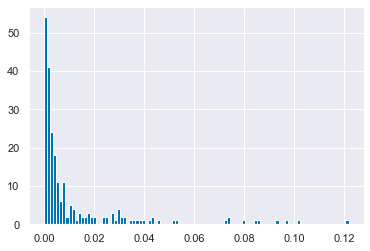

In [34]:
results_df["err_dist"].hist(bins=100)

In [59]:
def get_err_dist(target_var):
    predictions = results_df.loc[results_df["target_var"]==target_var,"predictions"].values[0]
    pred_dist = predictions[df_simp[target_var].isnull()].value_counts(normalize=True).sort_index()
    gt_dist = df_simp[target_var].value_counts(normalize=True).sort_index()
    err_dist = (pred_dist - gt_dist).apply(lambda x: x**2).sum()/gt_dist.shape[0]    
    return err_dist

target_var = "auth1W7"
get_err_dist(target_var)

0.06989487178382389

In [67]:
results_df.loc[results_df["err_dist"]==0.0,"err_dist"] = results_df[results_df["err_dist"]==0.0].apply(lambda x: get_err_dist(x["target_var"]),axis=1)

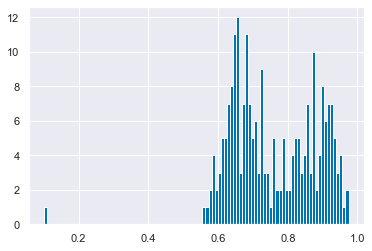

In [70]:
results_df["balanced_acc"].hist(bins=100)

In [71]:
results_df[ results_df["balanced_acc"]<.5 ]

,Description,target_var,df_pred,predictions,alg,balanced_acc,metrics,err_dist,duration
40,new base,riskScaleW8,"[riskScaleW8, redistSelfW15, redistSelfW16, lr...",id 1 6.0 2 5.0 3 6.0 4 ...,"XGBRegressor(base_score=0.5, booster='gbtree',...",0.101455,"(10.08049926621706, 2.4669082145787526, 0.0188...",0.015595,18.456454


In [88]:
mask = df_simp["riskScaleW8"].notnull()
(pd.Series(results_df.loc[40,"predictions"].values,index = df_simp.index)[mask]==df_simp["riskScaleW8"][mask]).value_counts()

False    28649
True      4853
dtype: int64

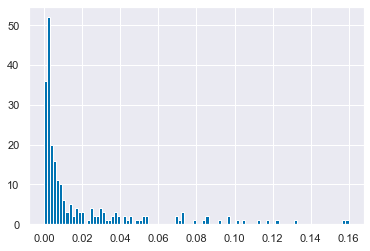

In [89]:
results_df["err_dist"].hist(bins=100)

In [99]:
(df_simp_imp[results_df[ (results_df["err_dist"]<.02) & (results_df["balanced_acc"]>.5) ]["target_var"]]).to_pickle(BES_small_data_files + "imputed_data3"+".zip", compression='zip')

In [ ]:
# df_simp_imp.to_pickle(BES_small_data_files + "imputed_data2"+".zip", compression='zip')

In [100]:
(df_simp_imp[results_df[ (results_df["err_dist"]<.02) & (results_df["balanced_acc"]>.5) ]["target_var"]]).shape

(97006, 167)

In [394]:
# from pandas.api.types import CategoricalDtype
# df_simp_imp = df_simp_imp.apply(lambda x: x.astype(CategoricalDtype(df_simp[x.name].cat.categories, ordered=True)) if x.name!='riskScaleW8' else x)
# df_simp_imp.to_pickle(BES_small_data_files + "imputed_data1"+".zip", compression='zip')
# accuracy_ser = pd.Series(metric_dict).apply(lambda x: x[0])
# accuracy_ser.to_pickle(BES_small_data_files + "accuracy_ser1"+".zip", compression='zip')

# ## saved!

'sdodominance1W15'

In [18]:
list(fuller_columns).index(target_var)

# df_simp[target_var]

227

In [392]:
len(fuller_columns)

228

In [19]:
target_var

'zeroSumIRTW14'

In [344]:
df_simp_first_batch = df_simp_imp[fuller_columns[0:30]].copy()
results_df_first_batch = results_df.copy()
# CHECK LATER

In [306]:
df_simp_imp.loc[df_simp[target_var].isnull(),target_var] = predictions[df_simp[target_var].isnull()]

In [308]:
df_simp_imp[target_var].value_counts(dropna=False)

Government should try to make incomes equal                17332
5                                                          13359
2                                                          10272
3                                                           9153
Government should be less concerned about equal incomes     9014
4                                                           8896
7                                                           7055
6                                                           6915
1                                                           6546
8                                                           4909
9                                                           3555
Name: redistSelfW1, dtype: int64

In [278]:
df_simp[target_var].value_counts(normalize=True).sort_index()

Government should try to make incomes equal                0.184228
1                                                          0.052153
2                                                          0.081390
3                                                          0.106467
4                                                          0.079922
5                                                          0.137539
6                                                          0.066384
7                                                          0.099005
8                                                          0.064427
9                                                          0.024180
Government should be less concerned about equal incomes    0.104306
Name: redistSelfW3, dtype: float64

In [269]:
df_pred[target_var].value_counts(normalize=True).sort_index()

Strongly disagree             0.018078
Disagree                      0.114449
Neither agree nor disagree    0.187208
Agree                         0.414181
Strongly agree                0.266085
Name: lr5W6, dtype: float64

In [243]:
import winsound
duration = 5000  # milliseconds
freq = 440  # Hz
winsound.Beep(freq, duration)

In [328]:
results_df.loc[0,"alg"]

XGBClassifier(base_score=0.5, booster='gbtree',
              colsample_bylevel=0.8720590254026701,
              colsample_bynode=0.5843005380100216,
              colsample_bytree=0.9897193555216962, gamma=5.976908406135755,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.06326866467481698, max_delta_step=0, max_depth=7,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=112, n_jobs=8, nthread=8, num_parallel_tree=1,
              objective='multi:softprob', random_state=729, refresh_leaf=0,
              reg_alpha=1.0, reg_lambda=0.0050929175003816,
              scale_pos_weight=None, sketch_eps=0.0,
              subsample=0.6064304958499334, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [331]:
results_df.tail(50)

,Description,target_var,df_pred,predictions,alg,balanced_acc,metrics,err_dist,duration
65,learning_rate=0.065,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 Government should try to mak...,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.640360,"(0.2514489522960321, 0.2514489522960321)",0.001202,160.626876
66,learning_rate=0.075,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 Government should try to mak...,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.636935,"(0.25089166295140436, 0.25089166295140436)",0.001197,152.508398
67,learning_rate=0.035,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 Government should try to make inco...,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.680622,"(0.24074899687917967, 0.24074899687917967)",0.001303,348.854754
68,learning_rate=0.09,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 Government should try to mak...,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.649649,"(0.2504458314757022, 0.2504458314757022)",0.000851,138.685876
69,learning_rate=0.1,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 Government should try to mak...,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.633900,"(0.23316986179224253, 0.23316986179224253)",0.000912,111.213280
70,learning_rate=0.2,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 Government should try to make inco...,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.623433,"(0.22737405260811414, 0.22737405260811414)",0.001209,62.785022
71,learning_rate=0.3,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 Government should try to make inco...,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.545986,"(0.24520731163620152, 0.24520731163620152)",0.000877,34.879582
72,learning_rate=0.4,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 Government should try to make inco...,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.465788,"(0.23673651359786002, 0.23673651359786002)",0.001002,26.170458
73,learning_rate=0.5,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 ...,"XGBClassifier(base_score=0.6, booster='gbtree'...",0.408127,"(0.22781988408381632, 0.22781988408381632)",0.001451,21.553698
74,base_score=0.4,redistSelfW1,ethno1W7 ethno2W7 ethno3W7 ethno4W7 ...,id 1 Government should try to mak...,"XGBClassifier(base_score=0.4, booster='gbtree'...",0.640360,"(0.2514489522960321, 0.2514489522960321)",0.001202,194.419420


In [ ]:
# df_simp = X_varset.replace("Don't know",np.nan)
# df_simp_imp = df_simp.copy()
#  = pd.Series(alg.predict(df_pred[train_columns]),index = df_simp.index)
df_simp_imp.loc[df_simp_imp.loc[target_var].isnull(),target_var] = predictions[df_simp_imp.loc[target_var].isnull()]

In [174]:
# max_depth is v time costly, but seems to be largely pos the higher it gets for both accuracy/dist cover
# subsample seems to be optimal at .6 ... but also good for dist at 1.0, not very time sensitive, but faster at v low or 1.0
# min_child_weight - I see no obvious pattern!
# gamma - no obv diff other than 0 (slightly slower, higher acc) / 1+ 
# reg_alpha - big vis impact, acc collapse above 10, slight impact on times, except when at 1000 -> faster
# -> do again betwee 2-9
    # time, acc, dist cover fluctuate, seem best at reg_alpha=4
# reg_lamba - no obv pattern, maybe .5 is best?
# learning_rate - large, direct impact on duration, doesn't really have a direct impact on acc/dist cover
    # big trade off against speed!
# base_score - changed nothing
# scale_pos_weight - changed nothing
# sketch_eps - changed nothing

#     xgb_params.update({'max_depth':7,'subsample':.6,'min_child_weight':3,'gamma':6,'reg_alpha':4,
#                       'reg_lambda':1.5,'learning_rate':0.065,'colsample_bytree':colsample_bytree})

1

In [196]:
gt_dist

Government should try to make incomes equal                0.182661
1                                                          0.057711
2                                                          0.079450
3                                                          0.108030
4                                                          0.078751
5                                                          0.147092
6                                                          0.072535
7                                                          0.100232
8                                                          0.061390
9                                                          0.024166
Government should be less concerned about equal incomes    0.087983
Name: redistSelfW1, dtype: float64

ACC: 0.29,  F1: 0.29


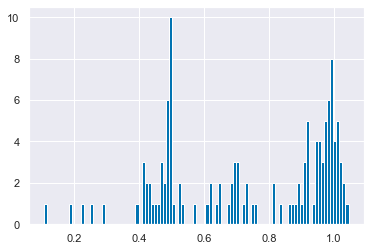

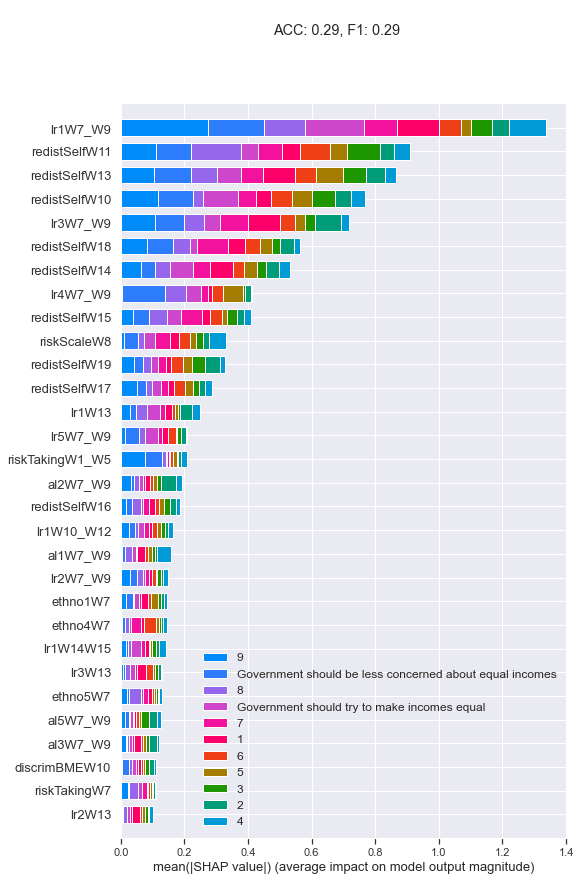

********


Government should try to make incomes equal                0.480099
1                                                          0.003638
2                                                          0.028903
3                                                          0.050029
4                                                          0.008909
5                                                          0.279423
6                                                          0.002549
7                                                          0.040806
8                                                          0.011229
9                                                          0.000201
Government should be less concerned about equal incomes    0.094215
dtype: float64

err_dist: 0.119327229706305
0.6584957928378419
---mlogloss---


In [123]:
eval_metric = "mlogloss"


target_var = fuller_columns[0]

mask = df_simp[target_var].notnull()

# target_var = fuller_columns[0]
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = None

var_stub = target_var
min_features = 30
#     drop_std_thresh = .1
drop_vars = []
specific_vars = []
inv_wt_classes = True
dependence_plots = False
drop_std_thresh = .35


# ### def on variable type
# if df_simp[target_var].dtype.name=="category":
#     alg = get_xgboost_alg(classification_problem=True)
#     multi_class_target = True
# else:
#     alg = get_xgboost_alg(classification_problem=False)
#     multi_class_target = False

multi_class_target = True
eval_metric = 'mlogloss'
alg = get_xgboost_alg(classification_problem=multi_class_target)


# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_dataset_only(df_simp,
                            target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,min_features,dependence_plots=dependence_plots,drop_vars=drop_vars,demo_var_only=False,specific_vars=False,
                            multi_class_target=multi_class_target,)

# only wave variants of variable
# df_pred = df_pred[search(df_pred,"redistSelf").index]
# drop all nan columns

df_pred = df_pred.drop(search(df_pred,"nan").index,axis=1)

null_mask = df_pred[target_var].isnull()
stds = df_pred[null_mask].std()
df_pred[mask].std()[df_pred[null_mask].std()<1].hist(bins=100)
low_var_list = list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)    
df_pred = df_pred.drop(low_var_list,axis=1)

isnull_coverage = df_pred[df_pred[target_var].isnull()].notnull().mean()
low_coverage_list = list(isnull_coverage[isnull_coverage<.2].index)
low_coverage_list.remove(target_var)
df_pred = df_pred.drop(low_coverage_list,axis=1)

# df_pred["test_var"] = df_pred[target_var]+.2

# if multi_class_target:
#     corrs = df_pred.corrwith(df_pred[target_var].cat.codes.replace(-1,np.nan))
# else:
#     corrs = df_pred.corrwith(df_pred[target_var])
# print("reduction:",df_pred.shape, len(corrs[corrs.abs()>.1].index))
# df_pred = df_pred[list(set(list(corrs[corrs.abs()>.1].index)+[target_var]))]


colname = var_stub
if target_var_title_pair is not None:
    title = "\n\nMore Likely to "+target_var_title_pair[0]+" <---   ---> More Likely to"+target_var_title_pair[1]
else:
    title = ""
var_list = [var_stub]
var_stub_list = []   

# eval_metric = 'merror'
alg = get_xgboost_alg(classification_problem=multi_class_target)
# alg = get_xgboost_alg(classification_problem=multi_class_target,
#                      colsample_bylevel=1.0,colsample_bynode=1.0, colsample_bytree=1.0,subsample=1.0,
#                      objective='multi:softmax',learning_rate=.01)
# alg = XGBRegressor(n_estimators=1000)

if inv_wt_classes:
    freq = df_pred.loc[mask,target_var].value_counts(normalize=True)
    wts = df_pred.loc[mask,target_var].apply(lambda x: 1/freq[x]).astype(float)
else:
    wts = df_pred.loc[mask,target_var].notnull().astype(float)
# wts=None
(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)=\
    xgboost_run(subdir=colname,dataset=df_pred[mask],
            var_list=var_list,var_stub_list=var_stub_list,
            use_specific_weights=wts,
            min_features = min(df_pred.shape[1]-1,min_features),verbosity=0,
            skip_bar_plot=True,dependence_plots=dependence_plots,alg=alg,eval_metric=eval_metric,                    
            title = title,print_shap_chart=True,threshold=0)
print("********")

if multi_class_target:
    predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).astype('category').cat.set_categories(df_pred[target_var].cat.categories,ordered=True)
else:    
    predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).round()
#
pred_dist = predictions[df_simp[target_var].isnull()].value_counts(normalize=True).sort_index()
gt_dist = df_pred[target_var].value_counts(normalize=True).sort_index()

err_dist = (pred_dist - gt_dist).apply(lambda x: x**2).sum()/gt_dist.shape[0]    
#     MSE = mean_squared_error(y_test, predictions)
#     MAE = mean_absolute_error(y_test, predictions)
#     EV = explained_variance_score(y_test, predictions)
#     R2 = r2_score(y_test, predictions)

#     print("MSE: %.2f, MAE: %.2f, EV: %.2f, R2: %.2f" % (MSE, MAE, EV, R2) )        
# print(params)
display(pred_dist)
#     display(gt_dist)
print("err_dist:",err_dist*10)
# return -metrics[0]+(err_dist*10)

print(balanced_accuracy_score( predictions[df_simp[target_var].notnull()],
                              df_simp[target_var][df_simp[target_var].notnull()]) )
print("---mlogloss---")

In [121]:
round(pd.crosstab(predictions[df_simp[target_var].notnull()],
            df_simp[target_var][df_simp[target_var].notnull()],normalize='columns')*100).astype(int)

redistSelfW1,Government should try to make incomes equal,1,2,3,4,5,6,7,8,9,Government should be less concerned about equal incomes
row_0,,,,,,,,,,,
Government should try to make incomes equal,70,22,21,22,20,21,18,18,16,16,20
1,4,58,4,5,2,2,2,2,1,0,1
2,4,3,53,5,4,2,2,2,1,0,1
3,2,2,3,45,5,4,3,3,2,0,1
4,1,1,2,3,50,4,2,3,2,0,1
5,12,10,11,12,12,52,12,12,11,9,8
6,1,1,1,2,3,4,52,3,1,0,2
7,1,1,1,2,1,3,2,47,2,1,1
8,0,0,1,1,1,3,2,3,56,0,2


In [117]:
### base
# Government should try to make incomes equal                0.235151
# 1                                                          0.071413
# 2                                                          0.088586
# 3                                                          0.041121
# 4                                                          0.075409
# 5                                                          0.122531
# 6                                                          0.030092
# 7                                                          0.139790
# 8                                                          0.038013
# 9                                                          0.023819
# Government should be less concerned about equal incomes    0.134075
# dtype: float64
# err_dist: 0.012868149547035029
# 0.6134014455952131
# ---mlogloss---

round(pd.crosstab(predictions[df_simp[target_var].notnull()],
            df_simp[target_var][df_simp[target_var].notnull()],normalize='columns')*100).astype(int)

redistSelfW1,Government should try to make incomes equal,1,2,3,4,5,6,7,8,9,Government should be less concerned about equal incomes
row_0,,,,,,,,,,,
Government should try to make incomes equal,70,22,21,22,20,21,18,18,16,16,20
1,4,58,4,5,2,2,2,2,1,0,1
2,4,3,53,5,4,2,2,2,1,0,1
3,2,2,3,45,5,4,3,3,2,0,1
4,1,1,2,3,50,4,2,3,2,0,1
5,12,10,11,12,12,52,12,12,11,9,8
6,1,1,1,2,3,4,52,3,1,0,2
7,1,1,1,2,1,3,2,47,2,1,1
8,0,0,1,1,1,3,2,3,56,0,2


In [114]:
### without nan removal
# Government should try to make incomes equal                0.235151
# 1                                                          0.071413
# 2                                                          0.088586
# 3                                                          0.041121
# 4                                                          0.075409
# 5                                                          0.122531
# 6                                                          0.030092
# 7                                                          0.139790
# 8                                                          0.038013
# 9                                                          0.023819
# Government should be less concerned about equal incomes    0.134075
# dtype: float64
# err_dist: 0.012868149547035029
# 0.6134014455952131
# ---mlogloss---

round(pd.crosstab(predictions[df_simp[target_var].notnull()],
            df_simp[target_var][df_simp[target_var].notnull()],normalize='columns')*100).astype(int)

redistSelfW1,Government should try to make incomes equal,1,2,3,4,5,6,7,8,9,Government should be less concerned about equal incomes
row_0,,,,,,,,,,,
Government should try to make incomes equal,70,22,21,22,20,21,18,18,16,16,20
1,4,58,4,5,2,2,2,2,1,0,1
2,4,3,53,5,4,2,2,2,1,0,1
3,2,2,3,45,5,4,3,3,2,0,1
4,1,1,2,3,50,4,2,3,2,0,1
5,12,10,11,12,12,52,12,12,11,9,8
6,1,1,1,2,3,4,52,3,1,0,2
7,1,1,1,2,1,3,2,47,2,1,1
8,0,0,1,1,1,3,2,3,56,0,2


In [112]:
### without null_mask stuff

# Government should try to make incomes equal                0.235151
# 1                                                          0.071413
# 2                                                          0.088586
# 3                                                          0.041121
# 4                                                          0.075409
# 5                                                          0.122531
# 6                                                          0.030092
# 7                                                          0.139790
# 8                                                          0.038013
# 9                                                          0.023819
# Government should be less concerned about equal incomes    0.134075
# dtype: float64
# err_dist: 0.012868149547035029
# 0.6134014455952131

round(pd.crosstab(predictions[df_simp[target_var].notnull()],
            df_simp[target_var][df_simp[target_var].notnull()],normalize='columns')*100).astype(int)

redistSelfW1,Government should try to make incomes equal,1,2,3,4,5,6,7,8,9,Government should be less concerned about equal incomes
row_0,,,,,,,,,,,
Government should try to make incomes equal,70,22,21,22,20,21,18,18,16,16,20
1,4,58,4,5,2,2,2,2,1,0,1
2,4,3,53,5,4,2,2,2,1,0,1
3,2,2,3,45,5,4,3,3,2,0,1
4,1,1,2,3,50,4,2,3,2,0,1
5,12,10,11,12,12,52,12,12,11,9,8
6,1,1,1,2,3,4,52,3,1,0,2
7,1,1,1,2,1,3,2,47,2,1,1
8,0,0,1,1,1,3,2,3,56,0,2


In [104]:
gt_dist

Government should try to make incomes equal                0.182661
1                                                          0.057711
2                                                          0.079450
3                                                          0.108030
4                                                          0.078751
5                                                          0.147092
6                                                          0.072535
7                                                          0.100232
8                                                          0.061390
9                                                          0.024166
Government should be less concerned about equal incomes    0.087983
Name: redistSelfW1, dtype: float64

In [122]:
pred_dist

Government should try to make incomes equal                0.235151
1                                                          0.071413
2                                                          0.088586
3                                                          0.041121
4                                                          0.075409
5                                                          0.122531
6                                                          0.030092
7                                                          0.139790
8                                                          0.038013
9                                                          0.023819
Government should be less concerned about equal incomes    0.134075
dtype: float64

In [105]:
df_pred

,ethno1W7,ethno2W7,ethno3W7,ethno4W7,ethno5W7,ethno6W7,riskTakingW7,riskTakingW8,riskScaleW8,redistSelfW10,...,lr2W10_W12,lr3W10_W12,lr4W10_W12,lr5W10_W12,al1W10_W12,al2W10_W12,al3W10_W12,al4W10_W12,al5W10_W12,redistSelfW1
id,,,,,,,,,,,,,,,,,,,,,
1,0.0,4.0,2.0,1.0,3.0,2.0,2.0,2.0,8.0,1.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.0,4.0,Government should try to make incomes equal
2,3.0,2.0,2.0,3.0,2.0,3.0,2.0,2.0,6.0,6.0,...,NaN,2.0,2.0,2.0,2.0,0.0,3.0,1.0,3.0,8
3,1.0,3.0,2.0,1.0,2.0,3.0,2.0,NaN,NaN,4.0,...,3.0,3.0,4.0,3.0,3.0,3.0,4.0,2.0,3.0,5
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98447,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98448,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98449,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [94]:
df_simp[df_simp[target_var].isnull()].notnull().mean().loc["lr1W1_W5"]

# low_coverage_list

0.19080765980606998

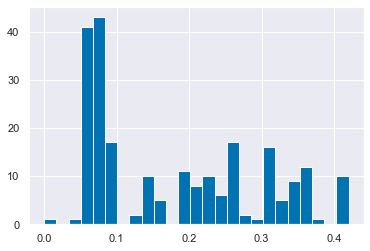

In [70]:
df_simp[df_simp[target_var].isnull()].notnull().mean().hist(bins=25)

In [98]:
df_simp[df_simp[target_var].isnull()].drop(target_var,axis=1).notnull().mean().mean()

0.18010938668159765

In [100]:
# df_simp[df_simp[target_var].isnull()].drop(target_var,axis=1).notnull().mean().loc["redistSelfW7"]

In [79]:
target_var

'redistSelfW1'

In [ ]:
## the problem of generalisability isn't about absolute variance or coverage ...

## it's about variables which have *very different* coverage in the 'target_var notnull' section
# than the 'target_var isnull' section

In [72]:
df_simp[df_simp[target_var].isnull()].notnull().mean().median()

0.14403672352797947

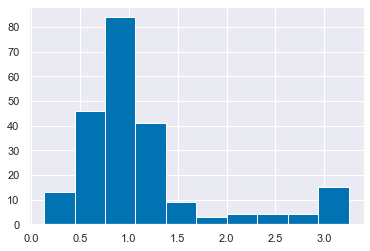

In [62]:
stds.hist()

In [249]:
# %debug

In [ ]:
# err_dist: 0.3937426399360876
# 0.7009569921425262
# ------
# ACC: 0.34,  F1: 0.34

In [19]:
accuracy_score( predictions[df_simp[target_var].notnull()],df_simp[target_var][df_simp[target_var].notnull()]) 

0.7197189833376246

In [16]:
(predictions[df_simp[target_var].notnull()]==df_simp[target_var][df_simp[target_var].notnull()]).mean()

0.7197189833376246

In [107]:
balanced_accuracy_score( predictions[df_simp[target_var].notnull()],df_simp[target_var][df_simp[target_var].notnull()]) 

0.6134014455952131

In [108]:
# confusion_matrix( predictions[df_simp[target_var].notnull()],df_simp[target_var][df_simp[target_var].notnull()],normalize='all')*100

In [33]:
predictions.name='predictions'

In [109]:
pd.crosstab(predictions[df_simp[target_var].notnull()],
            df_simp[target_var][df_simp[target_var].notnull()])

redistSelfW1,Government should try to make incomes equal,1,2,3,4,5,6,7,8,9,Government should be less concerned about equal incomes
row_0,,,,,,,,,,,
Government should try to make incomes equal,3484,347,449,635,427,837,359,498,265,108,472
1,203,913,88,140,40,91,40,48,18,2,14
2,206,43,1141,140,77,96,35,57,19,3,14
3,117,30,65,1307,97,145,53,83,30,3,13
4,72,16,44,99,1065,142,48,78,29,3,16
5,573,155,244,361,254,2060,240,322,176,60,187
6,46,15,28,70,55,152,1018,85,22,2,40
7,32,9,21,60,28,128,42,1279,29,5,35
8,19,2,14,22,31,104,43,76,941,2,43


In [110]:
round(pd.crosstab(predictions[df_simp[target_var].notnull()],
            df_simp[target_var][df_simp[target_var].notnull()],normalize='columns')*100).astype(int)

redistSelfW1,Government should try to make incomes equal,1,2,3,4,5,6,7,8,9,Government should be less concerned about equal incomes
row_0,,,,,,,,,,,
Government should try to make incomes equal,70,22,21,22,20,21,18,18,16,16,20
1,4,58,4,5,2,2,2,2,1,0,1
2,4,3,53,5,4,2,2,2,1,0,1
3,2,2,3,45,5,4,3,3,2,0,1
4,1,1,2,3,50,4,2,3,2,0,1
5,12,10,11,12,12,52,12,12,11,9,8
6,1,1,1,2,3,4,52,3,1,0,2
7,1,1,1,2,1,3,2,47,2,1,1
8,0,0,1,1,1,3,2,3,56,0,2


In [39]:
alg

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=0.9,
              colsample_bynode=0.85, colsample_bytree=0.7, gamma=0.00065,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=6, missing=nan, monotone_constraints='()',
              n_estimators=316, n_jobs=8, nthread=8, num_parallel_tree=1,
              objective='multi:softprob', random_state=729, refresh_leaf=0,
              reg_alpha=1.075, reg_lambda=1.011, scale_pos_weight=None,
              sketch_eps=0.0, subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

[20:23:33] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:23:52] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


ACC: 0.22,  F1: 0.22                                                                                                   
[20:23:52] WARNING: ..\src\learner.cc:573:          

Government should try to make incomes equal                0.388032
1                                                          0.055042
2                                                          0.086380
3                                                          0.020754
4                                                          0.066586
5                                                          0.121758
6                                                          0.039101
7                                                          0.026984
8                                                          0.054212
9                                                          0.068148
Government should be less concerned about equal incomes    0.073003
dtype: float64

err_dist:                                                                                                              
0.0053938804743265045                                                                                                  
[20:24:46] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:29:29] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.240407
1                                                          0.077386
2                                                          0.078890
3                                                          0.037368
4                                                          0.037998
5                                                          0.103611
6                                                          0.020539
7                                                          0.236268
8                                                          0.044615
9                                                          0.028273
Government should be less concerned about equal incomes    0.094645
dtype: float64

err_dist:                                                                                                              
0.0030744185495618723                                                                                                  
[20:32:32] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:32:46] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.333047
1                                                          0.083000
2                                                          0.112706
3                                                          0.026096
4                                                          0.050015
5                                                          0.115241
6                                                          0.045403
7                                                          0.024019
8                                                          0.058251
9                                                          0.064266
Government should be less concerned about equal incomes    0.087956
dtype: float64

err_dist:                                                                                                              
0.003734287932050878                                                                                                   
[20:33:16] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:33:33] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.378851
1                                                          0.047380
2                                                          0.077185
3                                                          0.016786
4                                                          0.071614
5                                                          0.107277
6                                                          0.036881
7                                                          0.070998
8                                                          0.053782
9                                                          0.091551
Government should be less concerned about equal incomes    0.047695
dtype: float64

err_dist:                                                                                                              
0.005173778147386379                                                                                                   
[20:34:01] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:34:25] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.308598
1                                                          0.087455
2                                                          0.098569
3                                                          0.036122
4                                                          0.048583
5                                                          0.088658
6                                                          0.025452
7                                                          0.099013
8                                                          0.045704
9                                                          0.046578
Government should be less concerned about equal incomes    0.115269
dtype: float64

err_dist:                                                                                                              
0.0027560870077132206                                                                                                  
[20:35:34] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:36:02] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.324382
1                                                          0.050846
2                                                          0.074722
3                                                          0.020453
4                                                          0.054097
5                                                          0.088443
6                                                          0.015025
7                                                          0.190392
8                                                          0.046549
9                                                          0.035392
Government should be less concerned about equal incomes    0.099701
dtype: float64

err_dist:                                                                                                              
0.0039810371702612745                                                                                                  
[20:37:19] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:37:43] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.380641
1                                                          0.047566
2                                                          0.086309
3                                                          0.015569
4                                                          0.119996
5                                                          0.094831
6                                                          0.022945
7                                                          0.034761
8                                                          0.053968
9                                                          0.072860
Government should be less concerned about equal incomes    0.070554
dtype: float64

err_dist:                                                                                                              
0.005618467508316633                                                                                                   
[20:38:29] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:38:48] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.315015
1                                                          0.129564
2                                                          0.045818
3                                                          0.013191
4                                                          0.170856
5                                                          0.067732
6                                                          0.016428
7                                                          0.067274
8                                                          0.046220
9                                                          0.074206
Government should be less concerned about equal incomes    0.053696
dtype: float64

err_dist:                                                                                                              
0.005066447197165475                                                                                                   
[20:39:26] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:39:50] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.254129
1                                                          0.074049
2                                                          0.101505
3                                                          0.038514
4                                                          0.056718
5                                                          0.136625
6                                                          0.029906
7                                                          0.031940
8                                                          0.055572
9                                                          0.073089
Government should be less concerned about equal incomes    0.147954
dtype: float64

err_dist:                                                                                                              
0.002163021816771587                                                                                                   
[20:40:36] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:40:55] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.356207
1                                                          0.069437
2                                                          0.094903
3                                                          0.029634
4                                                          0.052522
5                                                          0.118091
6                                                          0.032441
7                                                          0.024936
8                                                          0.055529
9                                                          0.061445
Government should be less concerned about equal incomes    0.104857
dtype: float64

err_dist:                                                                                                              
0.004286830743602736                                                                                                   
[20:41:33] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:41:51] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.378536
1                                                          0.068448
2                                                          0.097581
3                                                          0.015483
4                                                          0.073404
5                                                          0.109440
6                                                          0.030321
7                                                          0.039216
8                                                          0.046778
9                                                          0.054856
Government should be less concerned about equal incomes    0.085936
dtype: float64

err_dist:                                                                                                              
0.005044249546992169                                                                                                   
[20:42:29] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:42:42] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.432074
1                                                          0.037039
2                                                          0.084103
3                                                          0.019064
4                                                          0.036681
5                                                          0.097266
6                                                          0.019923
7                                                          0.096406
8                                                          0.035850
9                                                          0.067589
Government should be less concerned about equal incomes    0.074006
dtype: float64

err_dist:                                                                                                              
0.00730359279801566                                                                                                    
[20:43:06] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:43:24] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.337845
1                                                          0.061717
2                                                          0.100331
3                                                          0.018920
4                                                          0.028416
5                                                          0.070296
6                                                          0.016056
7                                                          0.203569
8                                                          0.031009
9                                                          0.051848
Government should be less concerned about equal incomes    0.079993
dtype: float64

err_dist:                                                                                                              
0.005138867932261475                                                                                                   
[20:44:02] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:44:16] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.277145
1                                                          0.052966
2                                                          0.070038
3                                                          0.022730
4                                                          0.031395
5                                                          0.051247
6                                                          0.013979
7                                                          0.344935
8                                                          0.023761
9                                                          0.030794
Government should be less concerned about equal incomes    0.081009
dtype: float64

err_dist:                                                                                                              
0.00841455153591749                                                                                                    
[20:44:49] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:45:06] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.243988
1                                                          0.049442
2                                                          0.075266
3                                                          0.023088
4                                                          0.103682
5                                                          0.060199
6                                                          0.020195
7                                                          0.271803
8                                                          0.038113
9                                                          0.029276
Government should be less concerned about equal incomes    0.084948
dtype: float64

err_dist:                                                                                                              
0.004726113777028463                                                                                                   
[20:46:28] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:46:44] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.319583
1                                                          0.062676
2                                                          0.107550
3                                                          0.037268
4                                                          0.060184
5                                                          0.136768
6                                                          0.020224
7                                                          0.028560
8                                                          0.064066
9                                                          0.068362
Government should be less concerned about equal incomes    0.094759
dtype: float64

err_dist:                                                                                                              
0.00317275934561554                                                                                                    
[20:47:30] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:47:47] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.287558
1                                                          0.073991
2                                                          0.116630
3                                                          0.033859
4                                                          0.052206
5                                                          0.151578
6                                                          0.032097
7                                                          0.031295
8                                                          0.070339
9                                                          0.049070
Government should be less concerned about equal incomes    0.101376
dtype: float64

err_dist:                                                                                                              
0.00237671770589455                                                                                                    
[20:48:40] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:48:55] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.432490
1                                                          0.042839
2                                                          0.076168
3                                                          0.017288
4                                                          0.065455
5                                                          0.105358
6                                                          0.027099
7                                                          0.029233
8                                                          0.057377
9                                                          0.089976
Government should be less concerned about equal incomes    0.056718
dtype: float64

err_dist:                                                                                                              
0.0077480780494424036                                                                                                  
[20:49:27] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:49:43] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.480471
1                                                          0.038313
2                                                          0.073404
3                                                          0.018347
4                                                          0.049170
5                                                          0.100087
6                                                          0.023547
7                                                          0.039559
8                                                          0.048024
9                                                          0.062562
Government should be less concerned about equal incomes    0.066515
dtype: float64

err_dist:                                                                                                              
0.009856890563716246                                                                                                   
[20:50:12] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:50:33] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.371618
1                                                          0.052593
2                                                          0.092181
3                                                          0.027485
4                                                          0.050760
5                                                          0.131025
6                                                          0.030994
7                                                          0.037970
8                                                          0.053882
9                                                          0.061559
Government should be less concerned about equal incomes    0.089933
dtype: float64

err_dist:                                                                                                              
0.004589339791356927                                                                                                   
[20:51:29] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:51:48] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.278019
1                                                          0.090391
2                                                          0.092224
3                                                          0.035592
4                                                          0.093828
5                                                          0.119380
6                                                          0.027199
7                                                          0.043011
8                                                          0.063092
9                                                          0.039273
Government should be less concerned about equal incomes    0.117991
dtype: float64

err_dist:                                                                                                              
0.00209344356615665                                                                                                    
[20:53:06] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:53:29] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.283662
1                                                          0.084791
2                                                          0.086638
3                                                          0.051591
4                                                          0.063278
5                                                          0.141237
6                                                          0.043742
7                                                          0.034389
8                                                          0.060456
9                                                          0.034776
Government should be less concerned about equal incomes    0.115441
dtype: float64

err_dist:                                                                                                              
0.0018615427457710247                                                                                                  
[20:55:36] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:55:55] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.284192
1                                                          0.089116
2                                                          0.104828
3                                                          0.045160
4                                                          0.046134
5                                                          0.134992
6                                                          0.030679
7                                                          0.044071
8                                                          0.049127
9                                                          0.050359
Government should be less concerned about equal incomes    0.121342
dtype: float64

err_dist:                                                                                                              
0.002177908070488847                                                                                                   
[20:57:39] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:57:58] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.285968
1                                                          0.072731
2                                                          0.113980
3                                                          0.036036
4                                                          0.078016
5                                                          0.115427
6                                                          0.045289
7                                                          0.033501
8                                                          0.060685
9                                                          0.043140
Government should be less concerned about equal incomes    0.115227
dtype: float64

err_dist:                                                                                                              
0.0022340631232135168                                                                                                  
[20:59:15] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:59:36] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.252954
1                                                          0.092568
2                                                          0.093585
3                                                          0.039545
4                                                          0.056847
5                                                          0.157507
6                                                          0.031037
7                                                          0.054641
8                                                          0.056976
9                                                          0.040705
Government should be less concerned about equal incomes    0.123634
dtype: float64

err_dist:                                                                                                              
0.001545345975147784                                                                                                   
[21:01:37] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:01:56] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.250877
1                                                          0.096005
2                                                          0.117962
3                                                          0.055400
4                                                          0.053223
5                                                          0.139833
6                                                          0.031782
7                                                          0.036652
8                                                          0.066859
9                                                          0.047910
Government should be less concerned about equal incomes    0.103496
dtype: float64

err_dist:                                                                                                              
0.0016013437785492588                                                                                                  
[21:03:35] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:03:52] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.210043
1                                                          0.087125
2                                                          0.116945
3                                                          0.040046
4                                                          0.058251
5                                                          0.139088
6                                                          0.026110
7                                                          0.058337
8                                                          0.073247
9                                                          0.051361
Government should be less concerned about equal incomes    0.139446
dtype: float64

err_dist:                                                                                                              
0.0014150872536383599                                                                                                  
[21:05:06] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:05:24] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.296109
1                                                          0.078875
2                                                          0.107048
3                                                          0.033773
4                                                          0.052808
5                                                          0.137785
6                                                          0.026927
7                                                          0.063693
8                                                          0.043699
9                                                          0.040061
Government should be less concerned about equal incomes    0.119223
dtype: float64

err_dist:                                                                                                              
0.002300937335846263                                                                                                   
[21:06:43] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:07:05] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.249502
1                                                          0.083831
2                                                          0.102193
3                                                          0.033888
4                                                          0.051318
5                                                          0.158481
6                                                          0.030250
7                                                          0.034833
8                                                          0.046449
9                                                          0.047365
Government should be less concerned about equal incomes    0.161890
dtype: float64

err_dist:                                                                                                              
0.0022122929990946727                                                                                                  
[21:08:46] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:09:07] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.225053
1                                                          0.091422
2                                                          0.090821
3                                                          0.045561
4                                                          0.051949
5                                                          0.132156
6                                                          0.028359
7                                                          0.080422
8                                                          0.051548
9                                                          0.037697
Government should be less concerned about equal incomes    0.165012
dtype: float64

err_dist:                                                                                                              
0.0014967286273221475                                                                                                  
[21:11:09] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:11:26] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.204214
1                                                          0.095676
2                                                          0.124407
3                                                          0.041035
4                                                          0.043598
5                                                          0.145505
6                                                          0.032871
7                                                          0.061087
8                                                          0.059683
9                                                          0.038543
Government should be less concerned about equal incomes    0.153382
dtype: float64

err_dist:                                                                                                              
0.0015677975201673843                                                                                                  
[21:13:02] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:13:19] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.240637
1                                                          0.078904
2                                                          0.087684
3                                                          0.035907
4                                                          0.049886
5                                                          0.131082
6                                                          0.024034
7                                                          0.107063
8                                                          0.051132
9                                                          0.045604
Government should be less concerned about equal incomes    0.148069
dtype: float64

err_dist:                                                                                                              
0.001522119856452034                                                                                                   
[21:14:33] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:14:48] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.289248
1                                                          0.097638
2                                                          0.084060
3                                                          0.028989
4                                                          0.062619
5                                                          0.109068
6                                                          0.022816
7                                                          0.122746
8                                                          0.040806
9                                                          0.045890
Government should be less concerned about equal incomes    0.096120
dtype: float64

err_dist:                                                                                                              
0.002260942185785719                                                                                                   
[21:15:32] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:15:46] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.391297
1                                                          0.044100
2                                                          0.088873
3                                                          0.022745
4                                                          0.037110
5                                                          0.074579
6                                                          0.019393
7                                                          0.155703
8                                                          0.038843
9                                                          0.052092
Government should be less concerned about equal incomes    0.075266
dtype: float64

err_dist:                                                                                                              
0.0059472758795190645                                                                                                  
[21:16:16] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:16:34] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.296166
1                                                          0.081052
2                                                          0.106017
3                                                          0.036838
4                                                          0.057964
5                                                          0.144101
6                                                          0.033372
7                                                          0.035062
8                                                          0.070325
9                                                          0.041493
Government should be less concerned about equal incomes    0.097610
dtype: float64

err_dist:                                                                                                              
0.002354252990186779                                                                                                   
[21:17:56] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:18:14] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.219525
1                                                          0.087412
2                                                          0.112076
3                                                          0.038184
4                                                          0.049743
5                                                          0.140048
6                                                          0.026511
7                                                          0.066844
8                                                          0.069537
9                                                          0.042095
Government should be less concerned about equal incomes    0.148026
dtype: float64

err_dist:                                                                                                              
0.0014818812135754132                                                                                                  
[21:19:42] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:19:58] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.252911
1                                                          0.073848
2                                                          0.126255
3                                                          0.044916
4                                                          0.050316
5                                                          0.130308
6                                                          0.038671
7                                                          0.078217
8                                                          0.052765
9                                                          0.036380
Government should be less concerned about equal incomes    0.115413
dtype: float64

err_dist:                                                                                                              
0.0013697377293390846                                                                                                  
[21:21:12] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:21:30] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.180753
1                                                          0.057277
2                                                          0.125868
3                                                          0.029319
4                                                          0.063951
5                                                          0.116516
6                                                          0.021241
7                                                          0.199759
8                                                          0.040748
9                                                          0.022100
Government should be less concerned about equal incomes    0.142468
dtype: float64

err_dist:                                                                                                              
0.002313063032686635                                                                                                   
[21:23:09] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:23:24] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.306707
1                                                          0.072545
2                                                          0.090162
3                                                          0.022644
4                                                          0.058408
5                                                          0.071829
6                                                          0.017431
7                                                          0.182572
8                                                          0.055071
9                                                          0.034002
Government should be less concerned about equal incomes    0.088629
dtype: float64

err_dist:                                                                                                              
0.0035495353255783004                                                                                                  
[21:24:07] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:24:28] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.188101
1                                                          0.064825
2                                                          0.079463
3                                                          0.029333
4                                                          0.037397
5                                                          0.107535
6                                                          0.021241
7                                                          0.266360
8                                                          0.038399
9                                                          0.031524
Government should be less concerned about equal incomes    0.135823
dtype: float64

err_dist:                                                                                                              
0.003877211327251416                                                                                                   
[21:26:26] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:26:41] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.332975
1                                                          0.081482
2                                                          0.100331
3                                                          0.034274
4                                                          0.059110
5                                                          0.109240
6                                                          0.027084
7                                                          0.059840
8                                                          0.046277
9                                                          0.047781
Government should be less concerned about equal incomes    0.101606
dtype: float64

err_dist:                                                                                                              
0.0032293399011419895                                                                                                  
[21:27:27] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:27:42] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.310761
1                                                          0.066028
2                                                          0.107650
3                                                          0.020524
4                                                          0.047938
5                                                          0.075424
6                                                          0.026039
7                                                          0.175912
8                                                          0.046248
9                                                          0.051175
Government should be less concerned about equal incomes    0.072301
dtype: float64

err_dist:                                                                                                              
0.003646455134025268                                                                                                   
[21:28:12] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:28:32] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.186353
1                                                          0.088787
2                                                          0.096335
3                                                          0.030980
4                                                          0.066329
5                                                          0.122101
6                                                          0.027199
7                                                          0.143915
8                                                          0.047623
9                                                          0.035320
Government should be less concerned about equal incomes    0.155058
dtype: float64

err_dist:                                                                                                              
0.0015233103744494304                                                                                                  
[21:30:41] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:30:56] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.324339
1                                                          0.076670
2                                                          0.100675
3                                                          0.027199
4                                                          0.041106
5                                                          0.100889
6                                                          0.022157
7                                                          0.124665
8                                                          0.052063
9                                                          0.047566
Government should be less concerned about equal incomes    0.082671
dtype: float64

err_dist:                                                                                                              
0.0031605062956156084                                                                                                  
[21:31:40] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:32:04] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.242599
1                                                          0.072602
2                                                          0.091880
3                                                          0.026970
4                                                          0.059167
5                                                          0.102995
6                                                          0.022186
7                                                          0.196809
8                                                          0.049643
9                                                          0.035921
Government should be less concerned about equal incomes    0.099228
dtype: float64

err_dist:                                                                                                              
0.0022847614466323623                                                                                                  
[21:33:49] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:34:01] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.285281
1                                                          0.079849
2                                                          0.118292
3                                                          0.026841
4                                                          0.040190
5                                                          0.095031
6                                                          0.024435
7                                                          0.144345
8                                                          0.052808
9                                                          0.051820
Government should be less concerned about equal incomes    0.081110
dtype: float64

err_dist:                                                                                                              
0.0025876074365349866                                                                                                  
[21:34:27] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:34:47] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.235337
1                                                          0.069609
2                                                          0.089546
3                                                          0.037927
4                                                          0.050130
5                                                          0.122574
6                                                          0.028244
7                                                          0.196179
8                                                          0.040820
9                                                          0.032785
Government should be less concerned about equal incomes    0.096850
dtype: float64

err_dist:                                                                                                              
0.0019178612956054985                                                                                                  
[21:36:36] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:36:50] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.392730
1                                                          0.055787
2                                                          0.081969
3                                                          0.016944
4                                                          0.070826
5                                                          0.083172
6                                                          0.023260
7                                                          0.098111
8                                                          0.044787
9                                                          0.063937
Government should be less concerned about equal incomes    0.068477
dtype: float64

err_dist:                                                                                                              
0.005568594489212104                                                                                                   
[21:37:16] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:37:27] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.360174
1                                                          0.037569
2                                                          0.052135
3                                                          0.011687
4                                                          0.226027
5                                                          0.083989
6                                                          0.017846
7                                                          0.020825
8                                                          0.056589
9                                                          0.076340
Government should be less concerned about equal incomes    0.056818
dtype: float64

err_dist:                                                                                                              
0.007329976773278567                                                                                                   
[21:37:47] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:38:07] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.258282
1                                                          0.067030
2                                                          0.073017
3                                                          0.035878
4                                                          0.040204
5                                                          0.069508
6                                                          0.020725
7                                                          0.287243
8                                                          0.027213
9                                                          0.034704
Government should be less concerned about equal incomes    0.086194
dtype: float64

err_dist:                                                                                                              
0.005227033032920498                                                                                                   
[21:39:28] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:39:42] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.318767
1                                                          0.071399
2                                                          0.118363
3                                                          0.023962
4                                                          0.048139
5                                                          0.108280
6                                                          0.020883
7                                                          0.099500
8                                                          0.040548
9                                                          0.070224
Government should be less concerned about equal incomes    0.079935
dtype: float64

err_dist:                                                                                                              
0.003184218244841783                                                                                                   
[21:40:09] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:40:29] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.280239
1                                                          0.081196
2                                                          0.090706
3                                                          0.019493
4                                                          0.160844
5                                                          0.056818
6                                                          0.015970
7                                                          0.117776
8                                                          0.039631
9                                                          0.050846
Government should be less concerned about equal incomes    0.086481
dtype: float64

err_dist:                                                                                                              
0.0034201827692002394                                                                                                  
[21:41:17] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:41:38] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.259213
1                                                          0.067890
2                                                          0.083158
3                                                          0.025623
4                                                          0.043111
5                                                          0.082513
6                                                          0.019851
7                                                          0.249774
8                                                          0.038944
9                                                          0.036394
Government should be less concerned about equal incomes    0.093528
dtype: float64

err_dist:                                                                                                              
0.004002876125086211                                                                                                   
[21:42:46] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:43:02] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.219611
1                                                          0.057391
2                                                          0.081167
3                                                          0.037970
4                                                          0.046649
5                                                          0.081468
6                                                          0.018562
7                                                          0.307438
8                                                          0.032069
9                                                          0.024606
Government should be less concerned about equal incomes    0.093069
dtype: float64

err_dist:                                                                                                              
0.005304273048589637                                                                                                   
[21:44:41] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:44:59] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.316905
1                                                          0.067145
2                                                          0.088429
3                                                          0.032756
4                                                          0.049428
5                                                          0.123433
6                                                          0.034403
7                                                          0.086595
8                                                          0.057749
9                                                          0.040605
Government should be less concerned about equal incomes    0.102551
dtype: float64

err_dist:                                                                                                              
0.0024920449189243933                                                                                                  
[21:46:16] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:46:36] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.266260
1                                                          0.054240
2                                                          0.084647
3                                                          0.022172
4                                                          0.074450
5                                                          0.102436
6                                                          0.019508
7                                                          0.204672
8                                                          0.043312
9                                                          0.042281
Government should be less concerned about equal incomes    0.086022
dtype: float64

err_dist:                                                                                                              
0.0027991430168147137                                                                                                  
[21:47:41] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:47:56] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.401524
1                                                          0.046549
2                                                          0.073734
3                                                          0.016815
4                                                          0.055515
5                                                          0.092697
6                                                          0.028330
7                                                          0.093513
8                                                          0.040562
9                                                          0.090548
Government should be less concerned about equal incomes    0.060213
dtype: float64

err_dist:                                                                                                              
0.006135273010678741                                                                                                   
[21:48:25] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:48:38] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.342901
1                                                          0.033186
2                                                          0.064166
3                                                          0.013506
4                                                          0.084218
5                                                          0.050216
6                                                          0.018190
7                                                          0.257824
8                                                          0.024793
9                                                          0.049886
Government should be less concerned about equal incomes    0.061115
dtype: float64

err_dist:                                                                                                              
0.006852091258682647                                                                                                   
[21:49:03] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:49:22] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.184262
1                                                          0.062719
2                                                          0.083817
3                                                          0.038013
4                                                          0.034604
5                                                          0.105859
6                                                          0.020926
7                                                          0.248829
8                                                          0.029748
9                                                          0.028015
Government should be less concerned about equal incomes    0.163208
dtype: float64

err_dist:                                                                                                              
0.003637964945235907                                                                                                   
[21:51:07] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:51:29] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.282674
1                                                          0.054469
2                                                          0.084089
3                                                          0.029405
4                                                          0.039559
5                                                          0.108738
6                                                          0.016657
7                                                          0.217906
8                                                          0.035334
9                                                          0.026626
Government should be less concerned about equal incomes    0.104542
dtype: float64

err_dist:                                                                                                              
0.003377473442765032                                                                                                   
[21:53:07] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:53:23] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.285882
1                                                          0.091794
2                                                          0.096793
3                                                          0.027142
4                                                          0.039660
5                                                          0.102050
6                                                          0.028244
7                                                          0.142798
8                                                          0.038743
9                                                          0.066744
Government should be less concerned about equal incomes    0.080150
dtype: float64

err_dist:                                                                                                              
0.0025797744323618624                                                                                                  
[21:53:58] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:54:15] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.343588
1                                                          0.061087
2                                                          0.114611
3                                                          0.022644
4                                                          0.045016
5                                                          0.105774
6                                                          0.033558
7                                                          0.079864
8                                                          0.051347
9                                                          0.070382
Government should be less concerned about equal incomes    0.072129
dtype: float64

err_dist:                                                                                                              
0.0037912205966576266                                                                                                  
[21:54:47] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:55:07] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.289635
1                                                          0.084791
2                                                          0.100388
3                                                          0.035363
4                                                          0.056604
5                                                          0.114926
6                                                          0.027686
7                                                          0.080007
8                                                          0.046048
9                                                          0.043570
Government should be less concerned about equal incomes    0.120984
dtype: float64

err_dist:                                                                                                              
0.002140196148409106                                                                                                   
[21:56:29] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:56:46] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.160572
1                                                          0.063235
2                                                          0.093384
3                                                          0.031897
4                                                          0.047165
5                                                          0.100718
6                                                          0.018405
7                                                          0.278807
8                                                          0.031037
9                                                          0.027915
Government should be less concerned about equal incomes    0.146865
dtype: float64

err_dist:                                                                                                              
0.004443505991393152                                                                                                   
[21:58:34] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:58:50] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.266460
1                                                          0.107822
2                                                          0.110815
3                                                          0.028474
4                                                          0.067661
5                                                          0.155001
6                                                          0.026597
7                                                          0.029849
8                                                          0.056346
9                                                          0.052751
Government should be less concerned about equal incomes    0.098225
dtype: float64

err_dist:                                                                                                              
0.0022766664014773658                                                                                                  
[21:59:36] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:59:55] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.260803
1                                                          0.080580
2                                                          0.100560
3                                                          0.053897
4                                                          0.050072
5                                                          0.139231
6                                                          0.027428
7                                                          0.062476
8                                                          0.042510
9                                                          0.041149
Government should be less concerned about equal incomes    0.141294
dtype: float64

err_dist:                                                                                                              
0.0016214960230202739                                                                                                  
[22:01:17] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:01:40] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.265873
1                                                          0.095834
2                                                          0.094387
3                                                          0.041694
4                                                          0.044859
5                                                          0.136997
6                                                          0.035248
7                                                          0.082327
8                                                          0.062333
9                                                          0.038428
Government should be less concerned about equal incomes    0.102021
dtype: float64

err_dist:                                                                                                              
0.001487633106497137                                                                                                   
[22:03:52] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:04:13] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.234435
1                                                          0.094086
2                                                          0.104126
3                                                          0.036566
4                                                          0.048368
5                                                          0.129907
6                                                          0.039216
7                                                          0.053367
8                                                          0.056217
9                                                          0.034990
Government should be less concerned about equal incomes    0.168722
dtype: float64

err_dist:                                                                                                              
0.001900660401662489                                                                                                   
[22:06:15] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:06:32] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.260072
1                                                          0.115713
2                                                          0.116644
3                                                          0.035563
4                                                          0.049012
5                                                          0.115585
6                                                          0.030078
7                                                          0.079706
8                                                          0.059268
9                                                          0.045145
Government should be less concerned about equal incomes    0.093212
dtype: float64

err_dist:                                                                                                              
0.0018695076847058693                                                                                                  
[22:07:55] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:08:11] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.186396
1                                                          0.110529
2                                                          0.117991
3                                                          0.040677
4                                                          0.056274
5                                                          0.157865
6                                                          0.031868
7                                                          0.039660
8                                                          0.057706
9                                                          0.052522
Government should be less concerned about equal incomes    0.148513
dtype: float64

err_dist:                                                                                                              
0.0017500782987999767                                                                                                  
[22:09:32] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:09:51] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.231183
1                                                          0.098727
2                                                          0.102451
3                                                          0.040390
4                                                          0.047852
5                                                          0.152638
6                                                          0.026583
7                                                          0.054298
8                                                          0.053281
9                                                          0.043613
Government should be less concerned about equal incomes    0.148985
dtype: float64

err_dist:                                                                                                              
0.0016829989409629274                                                                                                  
[22:11:16] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:11:40] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.280726
1                                                          0.074908
2                                                          0.109354
3                                                          0.042037
4                                                          0.056202
5                                                          0.142898
6                                                          0.038399
7                                                          0.045360
8                                                          0.057620
9                                                          0.037869
Government should be less concerned about equal incomes    0.114625
dtype: float64

err_dist:                                                                                                              
0.0018886949885414174                                                                                                  
[22:14:16] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:14:37] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.320557
1                                                          0.086080
2                                                          0.085006
3                                                          0.039158
4                                                          0.058938
5                                                          0.116272
6                                                          0.036022
7                                                          0.053395
8                                                          0.047380
9                                                          0.046821
Government should be less concerned about equal incomes    0.110371
dtype: float64

err_dist:                                                                                                              
0.002788580329374668                                                                                                   
[22:15:53] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:16:12] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.296753
1                                                          0.065784
2                                                          0.094888
3                                                          0.044415
4                                                          0.061688
5                                                          0.166602
6                                                          0.024334
7                                                          0.040462
8                                                          0.049614
9                                                          0.042567
Government should be less concerned about equal incomes    0.112892
dtype: float64

err_dist:                                                                                                              
0.002275689995767154                                                                                                   
[22:17:55] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:18:15] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.220169
1                                                          0.053094
2                                                          0.092281
3                                                          0.042596
4                                                          0.050416
5                                                          0.120798
6                                                          0.019851
7                                                          0.181083
8                                                          0.049872
9                                                          0.033945
Government should be less concerned about equal incomes    0.135894
dtype: float64

err_dist:                                                                                                              
0.0017458921703984267                                                                                                  
[22:20:04] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:20:26] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.246093
1                                                          0.079062
2                                                          0.083845
3                                                          0.036967
4                                                          0.041550
5                                                          0.112548
6                                                          0.022358
7                                                          0.199287
8                                                          0.037583
9                                                          0.040920
Government should be less concerned about equal incomes    0.099787
dtype: float64

err_dist:                                                                                                              
0.002312937639852533                                                                                                   
[22:21:54] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:22:13] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.327490
1                                                          0.078746
2                                                          0.106833
3                                                          0.031381
4                                                          0.050187
5                                                          0.109712
6                                                          0.031854
7                                                          0.056775
8                                                          0.056632
9                                                          0.051419
Government should be less concerned about equal incomes    0.098970
dtype: float64

err_dist:                                                                                                              
0.003153211340773813                                                                                                   
[22:23:06] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:23:27] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.212593
1                                                          0.072946
2                                                          0.104513
3                                                          0.035048
4                                                          0.066744
5                                                          0.134591
6                                                          0.038199
7                                                          0.059568
8                                                          0.046749
9                                                          0.037912
Government should be less concerned about equal incomes    0.191137
dtype: float64

err_dist:                                                                                                              
0.0019326767756116978                                                                                                  
[22:25:22] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:25:41] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.181340
1                                                          0.073161
2                                                          0.090749
3                                                          0.034317
4                                                          0.040777
5                                                          0.100202
6                                                          0.019064
7                                                          0.236297
8                                                          0.035821
9                                                          0.041250
Government should be less concerned about equal incomes    0.147023
dtype: float64

err_dist:                                                                                                              
0.003204223051559187                                                                                                   
[22:26:57] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:27:18] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.233618
1                                                          0.072888
2                                                          0.097166
3                                                          0.029648
4                                                          0.071800
5                                                          0.117203
6                                                          0.020138
7                                                          0.187112
8                                                          0.046807
9                                                          0.036437
Government should be less concerned about equal incomes    0.087183
dtype: float64

err_dist:                                                                                                              
0.0018985245078827781                                                                                                  
[22:28:46] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:29:02] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.301451
1                                                          0.078875
2                                                          0.092611
3                                                          0.044057
4                                                          0.068076
5                                                          0.128260
6                                                          0.028431
7                                                          0.053252
8                                                          0.060442
9                                                          0.045332
Government should be less concerned about equal incomes    0.099214
dtype: float64

err_dist:                                                                                                              
0.002183690141892013                                                                                                   
[22:30:17] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:30:31] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.362265
1                                                          0.066271
2                                                          0.094487
3                                                          0.030493
4                                                          0.044816
5                                                          0.103539
6                                                          0.030636
7                                                          0.075896
8                                                          0.046821
9                                                          0.052994
Government should be less concerned about equal incomes    0.091780
dtype: float64

err_dist:                                                                                                              
0.004092993872666967                                                                                                   
[22:31:16] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:31:39] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.275899
1                                                          0.082442
2                                                          0.083673
3                                                          0.049643
4                                                          0.055314
5                                                          0.141237
6                                                          0.029433
7                                                          0.045145
8                                                          0.066586
9                                                          0.047666
Government should be less concerned about equal incomes    0.122961
dtype: float64

err_dist:                                                                                                              
0.0018191214246355487                                                                                                  
[22:33:35] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:33:52] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.227818
1                                                          0.076068
2                                                          0.098011
3                                                          0.036423
4                                                          0.044916
5                                                          0.112391
6                                                          0.031668
7                                                          0.105014
8                                                          0.043183
9                                                          0.035535
Government should be less concerned about equal incomes    0.188974
dtype: float64

err_dist:                                                                                                              
0.0020500067305401592                                                                                                  
[22:35:42] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:35:59] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.253470
1                                                          0.070511
2                                                          0.119781
3                                                          0.027385
4                                                          0.083860
5                                                          0.124995
6                                                          0.040963
7                                                          0.063650
8                                                          0.070568
9                                                          0.043169
Government should be less concerned about equal incomes    0.101649
dtype: float64

err_dist:                                                                                                              
0.0015263041694138508                                                                                                  
[22:37:25] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:37:45] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.256578
1                                                          0.079878
2                                                          0.081625
3                                                          0.029935
4                                                          0.060055
5                                                          0.115355
6                                                          0.022845
7                                                          0.171945
8                                                          0.044243
9                                                          0.036093
Government should be less concerned about equal incomes    0.101448
dtype: float64

err_dist:                                                                                                              
0.0019677072686593495                                                                                                  
[22:39:27] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:39:49] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.299045
1                                                          0.066071
2                                                          0.102093
3                                                          0.023504
4                                                          0.057191
5                                                          0.115456
6                                                          0.026769
7                                                          0.121013
8                                                          0.056074
9                                                          0.052264
Government should be less concerned about equal incomes    0.080522
dtype: float64

err_dist:                                                                                                              
0.0023761700373066325                                                                                                  
[22:40:46] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:41:05] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.310990
1                                                          0.072043
2                                                          0.109297
3                                                          0.028560
4                                                          0.052550
5                                                          0.125553
6                                                          0.036752
7                                                          0.075624
8                                                          0.047380
9                                                          0.058064
Government should be less concerned about equal incomes    0.083187
dtype: float64

err_dist:                                                                                                              
0.0025713459601848965                                                                                                  
[22:41:53] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:42:26] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.278076
1                                                          0.092124
2                                                          0.107822
3                                                          0.034704
4                                                          0.046893
5                                                          0.135450
6                                                          0.029090
7                                                          0.050115
8                                                          0.063708
9                                                          0.042596
Government should be less concerned about equal incomes    0.119423
dtype: float64

err_dist:                                                                                                              
0.0021230027988336808                                                                                                  
[22:45:52] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:46:15] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.237328
1                                                          0.061631
2                                                          0.088443
3                                                          0.034102
4                                                          0.039989
5                                                          0.106289
6                                                          0.021155
7                                                          0.245077
8                                                          0.036938
9                                                          0.034733
Government should be less concerned about equal incomes    0.094315
dtype: float64

err_dist:                                                                                                              
0.0032806244533902847                                                                                                  
[22:47:30] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:47:49] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.234048
1                                                          0.089532
2                                                          0.098025
3                                                          0.034246
4                                                          0.049170
5                                                          0.138587
6                                                          0.029190
7                                                          0.099629
8                                                          0.044443
9                                                          0.035750
Government should be less concerned about equal incomes    0.147381
dtype: float64

err_dist:                                                                                                              
0.0014743848755629574                                                                                                  
[22:49:33] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:49:49] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.263209
1                                                          0.100517
2                                                          0.083416
3                                                          0.028645
4                                                          0.097638
5                                                          0.108108
6                                                          0.020854
7                                                          0.114424
8                                                          0.041350
9                                                          0.047351
Government should be less concerned about equal incomes    0.094487
dtype: float64

err_dist:                                                                                                              
0.0018516540311592125                                                                                                  
[22:50:33] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:50:47] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.366591
1                                                          0.089145
2                                                          0.089059
3                                                          0.022601
4                                                          0.047924
5                                                          0.103983
6                                                          0.034518
7                                                          0.060743
8                                                          0.050015
9                                                          0.061645
Government should be less concerned about equal incomes    0.073776
dtype: float64

err_dist:                                                                                                              
0.004523442031053604                                                                                                   
[22:51:15] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:51:31] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.240379
1                                                          0.101534
2                                                          0.081597
3                                                          0.022974
4                                                          0.073504
5                                                          0.071513
6                                                          0.019780
7                                                          0.223836
8                                                          0.032914
9                                                          0.048382
Government should be less concerned about equal incomes    0.083588
dtype: float64

err_dist:                                                                                                              
0.003428025902958111                                                                                                   
[22:52:06] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:52:20] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.377462
1                                                          0.046664
2                                                          0.065971
3                                                          0.016299
4                                                          0.079563
5                                                          0.074092
6                                                          0.020782
7                                                          0.166015
8                                                          0.030694
9                                                          0.053925
Government should be less concerned about equal incomes    0.068534
dtype: float64

err_dist:                                                                                                              
0.0055642912647461                                                                                                     
[22:52:45] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:53:01] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.202509
1                                                          0.095074
2                                                          0.114983
3                                                          0.039330
4                                                          0.053152
5                                                          0.153611
6                                                          0.035406
7                                                          0.053223
8                                                          0.069451
9                                                          0.041636
Government should be less concerned about equal incomes    0.141623
dtype: float64

err_dist:                                                                                                              
0.0013914344699572478                                                                                                  
[22:54:36] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:54:51] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.245435
1                                                          0.061774
2                                                          0.077128
3                                                          0.036738
4                                                          0.037397
5                                                          0.067174
6                                                          0.022100
7                                                          0.299360
8                                                          0.033214
9                                                          0.024750
Government should be less concerned about equal incomes    0.094931
dtype: float64

err_dist:                                                                                                              
0.005470927707377495                                                                                                   
[22:55:54] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:56:11] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.359000
1                                                          0.047251
2                                                          0.097953
3                                                          0.019293
4                                                          0.072974
5                                                          0.122846
6                                                          0.040261
7                                                          0.030063
8                                                          0.067747
9                                                          0.093141
Government should be less concerned about equal incomes    0.049471
dtype: float64

err_dist:                                                                                                              
0.004753544130640344                                                                                                   
[22:56:42] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:57:03] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.221043
1                                                          0.080308
2                                                          0.107693
3                                                          0.036910
4                                                          0.056074
5                                                          0.126857
6                                                          0.035535
7                                                          0.082155
8                                                          0.057234
9                                                          0.042667
Government should be less concerned about equal incomes    0.153526
dtype: float64

err_dist:                                                                                                              
0.0013740320787176718                                                                                                  
[22:59:00] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:59:19] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.307996
1                                                          0.082800
2                                                          0.089546
3                                                          0.039932
4                                                          0.045546
5                                                          0.125725
6                                                          0.033143
7                                                          0.065756
8                                                          0.074149
9                                                          0.045088
Government should be less concerned about equal incomes    0.090319
dtype: float64

err_dist:                                                                                                              
0.0023620966850873525                                                                                                  
[23:00:29] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:00:47] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.293359
1                                                          0.075782
2                                                          0.097538
3                                                          0.046177
4                                                          0.050101
5                                                          0.113465
6                                                          0.039531
7                                                          0.075739
8                                                          0.044501
9                                                          0.037597
Government should be less concerned about equal incomes    0.126212
dtype: float64

err_dist:                                                                                                              
0.002027396923720433                                                                                                   
[23:02:44] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:03:00] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.284321
1                                                          0.073046
2                                                          0.079592
3                                                          0.025767
4                                                          0.039101
5                                                          0.080522
6                                                          0.024965
7                                                          0.208998
8                                                          0.040591
9                                                          0.036466
Government should be less concerned about equal incomes    0.106633
dtype: float64

err_dist:                                                                                                              
0.0034877628558268856                                                                                                  
[23:03:40] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:03:58] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

Government should try to make incomes equal                0.185723
1                                                          0.057606
2                                                          0.133832
3                                                          0.028688
4                                                          0.058251
5                                                          0.102780
6                                                          0.021155
7                                                          0.195950
8                                                          0.043255
9                                                          0.027356
Government should be less concerned about equal incomes    0.145405
dtype: float64

err_dist:                                                                                                              
0.0024621551994707465                                                                                                  
[23:05:33] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:05:49] WARNING: ..\src\learner.cc:573:                                                                             
Parameters: { "scale_pos_weight" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through t

KeyboardInterrupt: 

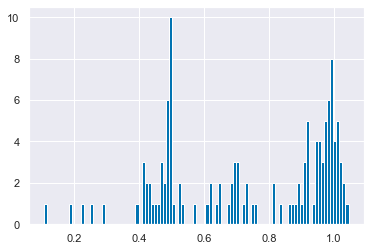

In [251]:
%%time
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

target_var = fuller_columns[0]

mask = df_simp[target_var].notnull()

# target_var = fuller_columns[0]
target_var_replace_dict = {}
target_var_drop_list = []
target_var_title_pair = None

var_stub = target_var
min_features = 30
#     drop_std_thresh = .1
drop_vars = []
specific_vars = []
dependence_plots = False
drop_std_thresh = .35


### def on variable type
if df_simp[target_var].dtype.name=="category":
    alg = get_xgboost_alg(classification_problem=True)
    multi_class_target = True
else:
    alg = get_xgboost_alg(classification_problem=False)
    multi_class_target = False

# find variables with no coverage/variation in focal instances (mask)
df_pred = prep_dataset_only(df_simp,
                            target_var,target_var_replace_dict,target_var_drop_list,target_var_title_pair,
       var_stub,min_features,dependence_plots=True,drop_vars=drop_vars,demo_var_only=False,specific_vars=False,
                            multi_class_target=multi_class_target,)

# df_pred = df_pred[search(df_pred,"redistSelf").index]
df_pred = df_pred.drop(search(df_pred,"nan").index,axis=1)

null_mask = df_pred[target_var].isnull()
stds = df_pred[null_mask].std()
df_pred[mask].std()[df_pred[null_mask].std()<1].hist(bins=100)
low_var_list = list(stds[stds.isnull()].index)+list(stds[stds<=drop_std_thresh].index)    
df_pred = df_pred.drop(low_var_list,axis=1)

isnull_coverage = df_pred[df_pred[target_var].isnull()].notnull().mean()
low_coverage_list = list(isnull_coverage[isnull_coverage<.2].index)
low_coverage_list.remove(target_var)
df_pred = df_pred.drop(low_coverage_list,axis=1)


# if multi_class_target:
#     corrs = df_pred.corrwith(df_pred[target_var].cat.codes.replace(-1,np.nan))
# else:
#     corrs = df_pred.corrwith(df_pred[target_var])
# print("reduction:",df_pred.shape, len(corrs[corrs.abs()>.1].index))
# df_pred = df_pred[list(set(list(corrs[corrs.abs()>.1].index)+[target_var]))]


colname = var_stub
if target_var_title_pair is not None:
    title = "\n\nMore Likely to "+target_var_title_pair[0]+" <---   ---> More Likely to"+target_var_title_pair[1]
else:
    title = ""
var_list = [var_stub]
var_stub_list = [var_stub,]   

eval_metric = 'mlogloss'

def hyperopt_train_test(params):
    alg = get_xgboost_alg(classification_problem=multi_class_target,
                         max_depth = int(params["max_depth"]),
                         n_estimators =int(params['n_estimators']),
                         min_child_weight=int(params['min_child_weight']),
                          
                         reg_alpha = int(params['reg_alpha']),
                         reg_lambda = int(params['reg_lambda']), 
                         gamma = int(params["max_depth"]),  
                         colsample_bytree=params['colsample_bytree'], 
                         
                         learning_rate=params['learning_rate'], 
                         subsample=  params['subsample'],
                         colsample_bylevel = params['colsample_bylevel'],
                         colsample_bynode = params['colsample_bynode'],
                          
                         )
    if params["inv_wt_classes"]:
        freq = df_pred.loc[mask,target_var].value_counts(normalize=True)
        wts = df_pred.loc[mask,target_var].apply(lambda x: 1/freq[x]).astype(float)
    else:
        wts = df_pred.loc[mask,target_var].notnull().astype(float)
    
    (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics)=\
        xgboost_run(subdir=colname,dataset=df_pred[mask],
                var_list=var_list,var_stub_list=var_stub_list,
                use_specific_weights=wts,
                min_features = min(df_pred.shape[1]-1,min_features),verbosity=0,
                skip_bar_plot=True,dependence_plots=dependence_plots,alg=alg,eval_metric=eval_metric,                    
                title = title,print_shap_chart=False)
    print("********")

    
    predictions = pd.Series(alg.predict(df_pred[train_columns]),index = df_pred.index).astype('category').cat.set_categories(df_pred[target_var].cat.categories)
    pred_dist = predictions[df_simp[target_var].isnull()].value_counts(normalize=True).sort_index()
    gt_dist = df_pred[target_var].value_counts(normalize=True).sort_index()
    
    err_dist = (pred_dist - gt_dist).apply(lambda x: x**2).sum()/gt_dist.shape[0]    
#     MSE = mean_squared_error(y_test, predictions)
#     MAE = mean_absolute_error(y_test, predictions)
#     EV = explained_variance_score(y_test, predictions)
#     R2 = r2_score(y_test, predictions)

#     print("MSE: %.2f, MAE: %.2f, EV: %.2f, R2: %.2f" % (MSE, MAE, EV, R2) )        
    print(params)
    display(pred_dist)
#     display(gt_dist)
    print("err_dist:",err_dist)
    return -metrics[0]+(err_dist*20)


# max_depth is v time costly, but seems to be largely pos the higher it gets for both accuracy/dist cover
# subsample seems to be optimal at .6 ... but also good for dist at 1.0, not very time sensitive, but faster at v low or 1.0
# min_child_weight - I see no obvious pattern!
# gamma - no obv diff other than 0 (slightly slower, higher acc) / 1+ 
# reg_alpha - big vis impact, acc collapse above 10, slight impact on times, except when at 1000 -> faster
# -> do again betwee 2-9
    # time, acc, dist cover fluctuate, seem best at reg_alpha=4
# reg_lamba - no obv pattern, maybe .5 is best?
# learning_rate - large, direct impact on duration, doesn't really have a direct impact on acc/dist cover
    # big trade off against speed!
# base_score - changed nothing
# scale_pos_weight - changed nothing
# sketch_eps - changed nothing

#     xgb_params.update({'max_depth':7,'subsample':.6,'min_child_weight':3,'gamma':6,'reg_alpha':4,
#                       'reg_lambda':1.5,'learning_rate':0.065,'colsample_bytree':colsample_bytree})


space4knn = {
    
#     max_depth=5,learning_rate=.028,min_child_weight=5,subsample=.1
    
#         'learning_rate':hp.uniform('learning_rate', .005,.5),
        'learning_rate':hp.uniform('learning_rate', .06,.1),
        'max_depth':hp.quniform("max_depth", 1, 7, 1),
        'min_child_weight':hp.quniform("min_child_weight", 0, 10, 1),
        'subsample':hp.uniform('subsample', .5,.7),

         'n_estimators': 500,
    
    #hp.quniform("max_depth", 1, 6, 1),    
#          'max_depth':5,
#          'learning_rate':0.028,    
#          'min_child_weight':5,
#          'subsample':0.1,
    
    #hp.quniform("min_child_weight", 0, 10, 1),
         'gamma':hp.uniform ('gamma', 0,1),
    #0.00065, # aka min_split_loss

    # hp.uniform("subsample", 0.05, .95),
    #0.8,
         'colsample_bytree':hp.uniform('colsample_bytree', .85,1.0),
    #0.7,
         'colsample_bylevel':hp.uniform('colsample_bylevel', .85,1.0),
    #.9,
         'colsample_bynode':hp.uniform('colsample_bynode', .85,1.0),
#     .85,
#          'objective= 'reg:squarederror',
       #  scale_pos_weight=1.09,
         'reg_alpha': hp.quniform('reg_alpha', 0,10,1),
    #1.075,
         'reg_lambda':hp.uniform('reg_lambda', 0,2),
    #1.011,    
         'inv_wt_classes': True,
    # hp.choice("inv_wt_classes",[False,True]),
    
#         'max_depth': hp.quniform("max_depth", 1, 6, 1),
#         'gamma': hp.uniform ('gamma', 0,9),
#         'reg_alpha' : hp.quniform('reg_alpha', 1,180,1),
#         'reg_lambda' : hp.uniform('reg_lambda', 0,2),
#         'colsample_bytree' : hp.uniform('colsample_bytree', 0.25,1),
#         'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
    
#      learning_rate =hp.uniform('learning_rate',.0001,.1),
#         'n_estimators': hp.quniform('n_estimators', 10,500,1),
#      max_depth=hp.quniform('max_depth', 1,10,1),
#      min_child_weight=hp.quniform('min_child_weight', 1,10,1),

#      subsample=hp.uniform('subsample', .25,.95),
#      objective= 'reg:squarederror',
    
#      gamma=0.00065, # aka min_split_loss    
#      colsample_bytree=0.7,
#      colsample_bylevel=.9,
#      colsample_bynode=.85,
     
#      scale_pos_weight=1.09,
#      reg_alpha=1.075,
#      reg_lambda=1.011,
#      sketch_eps=0.0,
#      refresh_leaf=0,
#      nthread=8,
#      n_jobs =8,
#      random_state=27**2,     
    
    
}
def f(params):
    clusteringness = hyperopt_train_test(params)
    return {'loss': clusteringness, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4knn, algo=tpe.suggest, max_evals=400, trials=trials)
print('best:')
print(best)

In [125]:
{'colsample_bylevel': 0.9993530672426759, 'colsample_bynode': 0.923842763238649, 'colsample_bytree': 0.9692759731399389,
 'gamma': 0.4485300495916873, 'inv_wt_classes': True, 'learning_rate': 0.09752248436332413, 'max_depth': 7.0,
 'min_child_weight': 5.0, 'n_estimators': 500, 'reg_alpha': 1.0, 'reg_lambda': 0.3974541426809541,
 'subsample': 0.6910642731185885}
  9%|████                                        | 37/400 [59:36<9:11:52, 91.22s/trial, best loss: -0.1981959721185237]

360.0

In [ ]:
### so now?